# GAMA-09: Validation Checks (SUBSET)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools

import time


In [2]:
t0 = time.time()

catname = "../../dmu1/dmu1_ml_GAMA-09/data/master_catalogue_gama-09_20171206.fits"
#catname = "/data/help/master_catalogue_gama-09_20171206.fits"
master_catalogue = Table.read(catname)

print('Elapsed time(secs): ', time.time() - t0)

print("Number of sources in master catalogue: ", len(master_catalogue))

Elapsed time(secs):  277.4483251571655
Number of sources in master catalogue:  6468991


In [7]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

GAMA-09


In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [3]:
u_bands = ["Megacam u", "OmegaCAM u"]
g_bands = ["Megacam g", "DECam g", "OmegaCAM g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "OmegaCAM r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i",            "OmegaCAM i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z",               "SUPRIME z", "GPC1 z", "VISTA Z"]
y_bands = [                                      "SUPRIME y", "GPC1 y", "VISTA Y", "UKIDSS Y"]


opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands

j_bands = ["UKIDSS J", "VISTA J"]
h_bands = ["UKIDSS H", "VISTA H"]
k_bands = ["UKIDSS K", "VISTA Ks"]

ir_mags = j_bands + h_bands + k_bands

all_mags = opt_mags + ir_mags

In [5]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

Megacam u mag (aperture)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam u mag (total)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



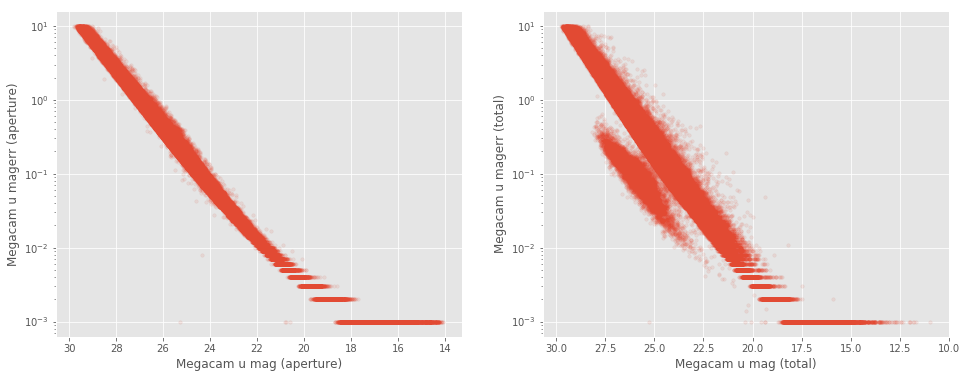

OmegaCAM u mag (aperture)
    Error max: 118228
    magerr > 10: Number of objects = 20489, min mag = 27.2
    magerr > 100: Number of objects = 1858, min mag = 30.2
    magerr > 1000: Number of objects = 208, min mag = 32.7

OmegaCAM u mag (total)
    Error max: 266161
    magerr > 10: Number of objects = 37890, min mag = 24.9
    magerr > 100: Number of objects = 3732, min mag = 28.5
    magerr > 1000: Number of objects = 339, min mag = 31.6



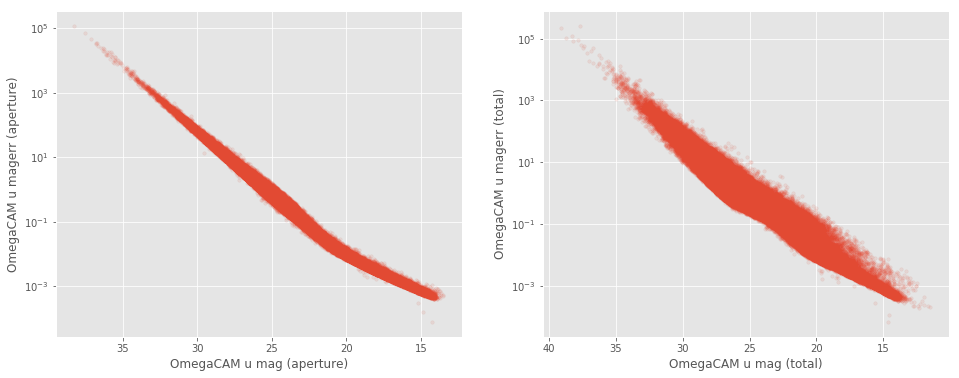

Megacam g mag (aperture)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam g mag (total)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



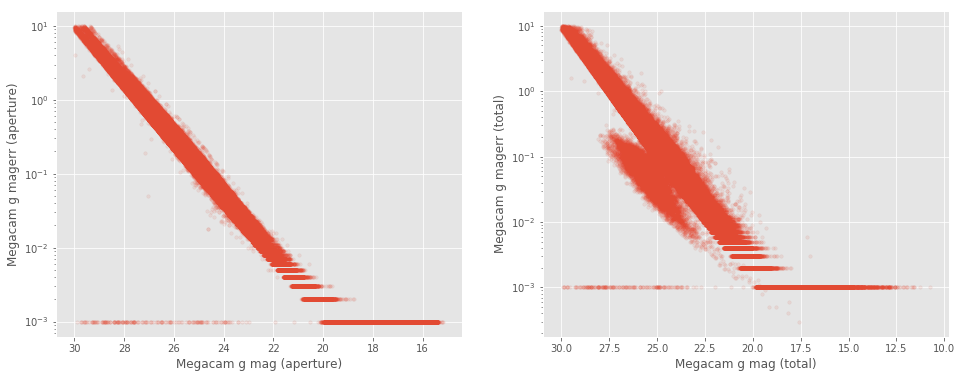

DECam g mag (aperture)
    Error max: 1066606
    magerr > 10: Number of objects = 18938, min mag = 26.5
    magerr > 100: Number of objects = 1815, min mag = 29.0
    magerr > 1000: Number of objects = 212, min mag = 31.5

DECam g mag (total)
    Error max: 725456
    magerr > 10: Number of objects = 15063, min mag = -7.0
    magerr > 100: Number of objects = 1496, min mag = 9.3
    magerr > 1000: Number of objects = 155, min mag = 15.0



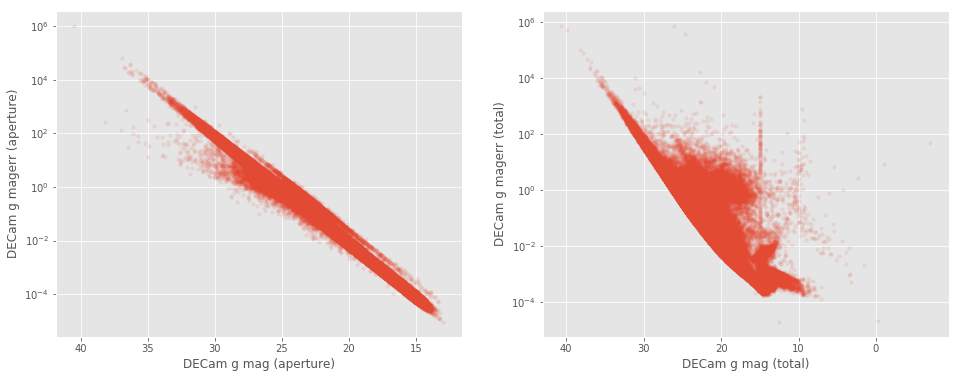

OmegaCAM g mag (aperture)
    Error max: 74273
    magerr > 10: Number of objects = 5283, min mag = 28.2
    magerr > 100: Number of objects = 490, min mag = 30.6
    magerr > 1000: Number of objects = 52, min mag = 33.7

OmegaCAM g mag (total)
    Error max: 56488
    magerr > 10: Number of objects = 9763, min mag = 26.0
    magerr > 100: Number of objects = 928, min mag = 29.9
    magerr > 1000: Number of objects = 85, min mag = 33.0



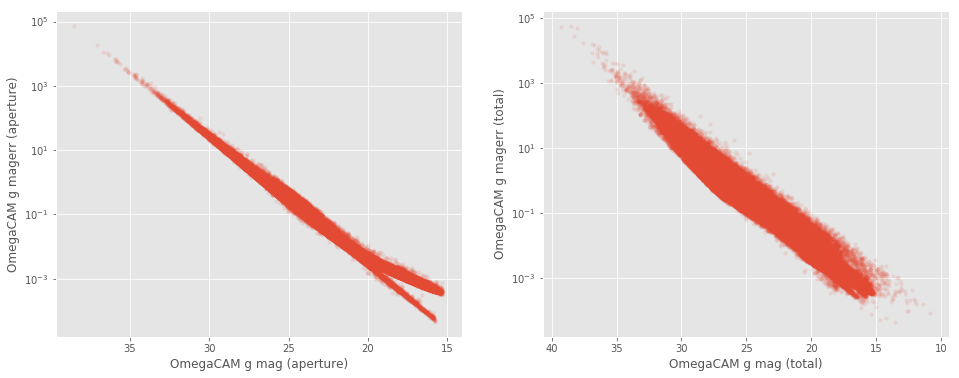

SUPRIME g mag (aperture)
    Error max: 1041022226268160
    magerr > 10: Number of objects = 21024, min mag = 29.8
    magerr > 100: Number of objects = 10210, min mag = 32.2
    magerr > 1000: Number of objects = 4649, min mag = 35.2

SUPRIME g mag (total)
    Error max: 38153553444864
    magerr > 10: Number of objects = 14820, min mag = 28.0
    magerr > 100: Number of objects = 4466, min mag = 30.0
    magerr > 1000: Number of objects = 1755, min mag = 33.5



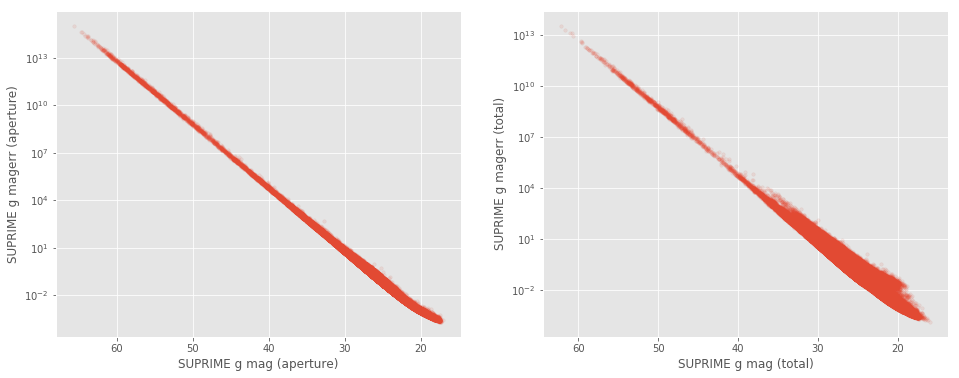

GPC1 g mag (aperture)
    Error max: 40980
    magerr > 10: Number of objects = 4528, min mag = 16.1
    magerr > 100: Number of objects = 451, min mag = 26.5
    magerr > 1000: Number of objects = 49, min mag = 29.7

GPC1 g mag (total)
    Error max: 123741
    magerr > 10: Number of objects = 5024, min mag = 8.0
    magerr > 100: Number of objects = 498, min mag = 25.9
    magerr > 1000: Number of objects = 43, min mag = 29.4



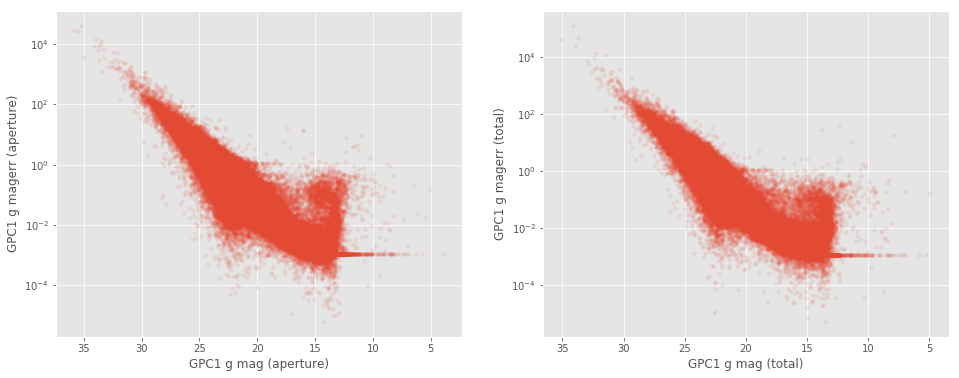

Megacam r mag (aperture)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam r mag (total)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



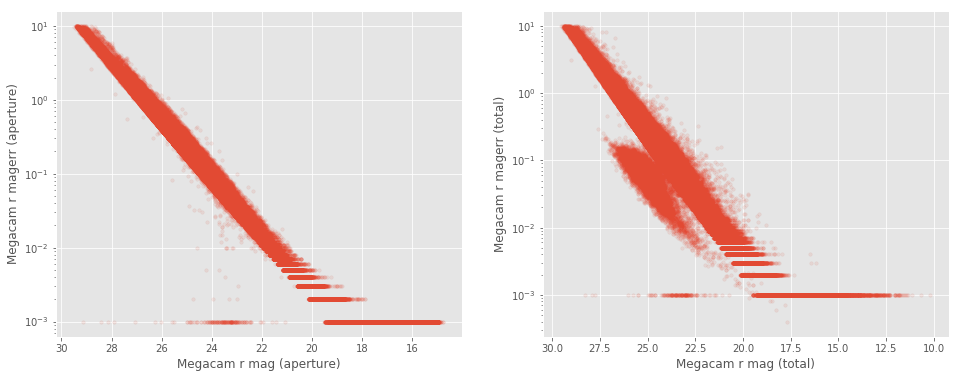

DECam r mag (aperture)
    Error max: 67386
    magerr > 10: Number of objects = 13699, min mag = 25.5
    magerr > 100: Number of objects = 1314, min mag = 28.0
    magerr > 1000: Number of objects = 141, min mag = 30.6

DECam r mag (total)
    Error max: 4513103
    magerr > 10: Number of objects = 7225, min mag = 7.3
    magerr > 100: Number of objects = 699, min mag = 13.0
    magerr > 1000: Number of objects = 78, min mag = 15.0



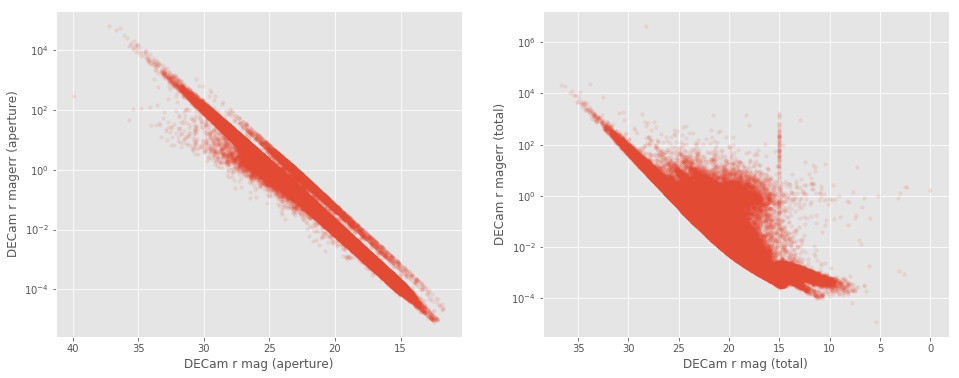

OmegaCAM r mag (aperture)
    Error max: 25447
    magerr > 10: Number of objects = 1647, min mag = 28.2
    magerr > 100: Number of objects = 152, min mag = 31.0
    magerr > 1000: Number of objects = 18, min mag = 33.6

OmegaCAM r mag (total)
    Error max: 17602
    magerr > 10: Number of objects = 2184, min mag = 26.9
    magerr > 100: Number of objects = 212, min mag = 29.6
    magerr > 1000: Number of objects = 16, min mag = 32.8



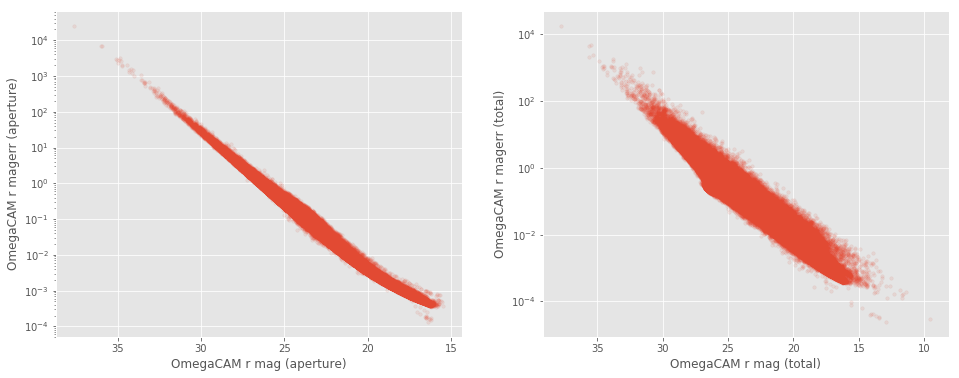

SUPRIME r mag (aperture)
    Error max: 2927183152545792
    magerr > 10: Number of objects = 12991, min mag = 23.0
    magerr > 100: Number of objects = 6938, min mag = 31.9
    magerr > 1000: Number of objects = 3836, min mag = 34.6

SUPRIME r mag (total)
    Error max: 32859492450304
    magerr > 10: Number of objects = 11082, min mag = 19.0
    magerr > 100: Number of objects = 3454, min mag = 22.0
    magerr > 1000: Number of objects = 1606, min mag = 26.3



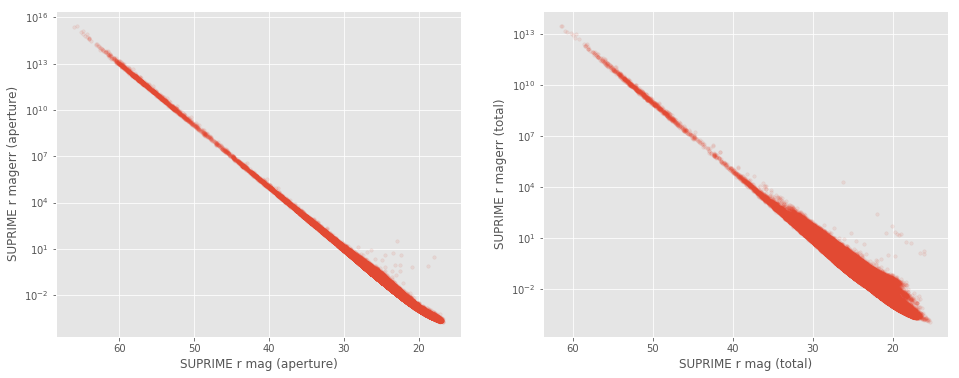

GPC1 r mag (aperture)
    Error max: 15205
    magerr > 10: Number of objects = 1919, min mag = 23.5
    magerr > 100: Number of objects = 159, min mag = 25.7
    magerr > 1000: Number of objects = 19, min mag = 30.4

GPC1 r mag (total)
    Error max: 9682
    magerr > 10: Number of objects = 1970, min mag = 22.1
    magerr > 100: Number of objects = 175, min mag = 26.2
    magerr > 1000: Number of objects = 14, min mag = 30.2



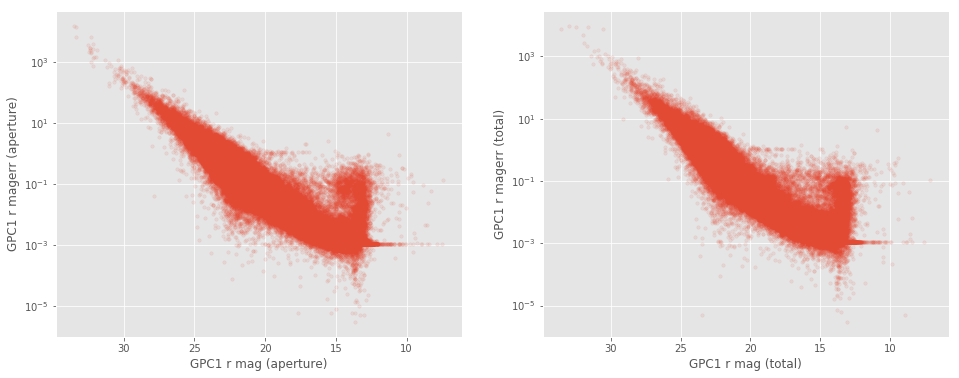

Megacam i mag (aperture)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam i mag (total)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



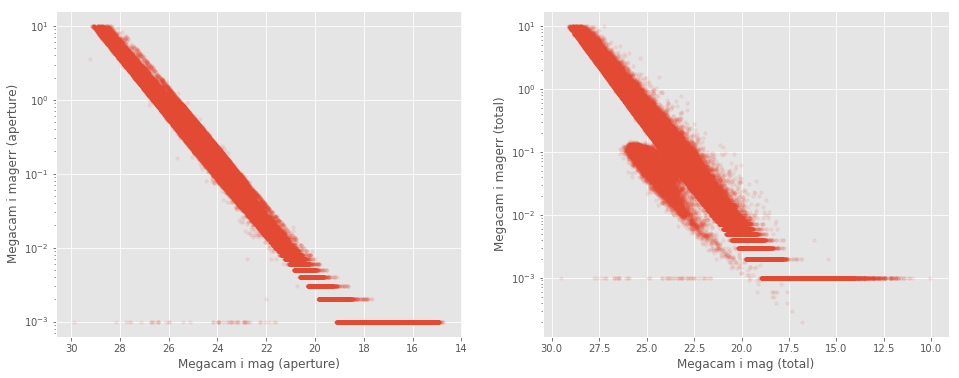

OmegaCAM i mag (aperture)
    Error max: 280499
    magerr > 10: Number of objects = 8835, min mag = 26.7
    magerr > 100: Number of objects = 826, min mag = 29.4
    magerr > 1000: Number of objects = 84, min mag = 32.0

OmegaCAM i mag (total)
    Error max: 75691
    magerr > 10: Number of objects = 16721, min mag = 24.6
    magerr > 100: Number of objects = 1575, min mag = 27.4
    magerr > 1000: Number of objects = 167, min mag = 30.5



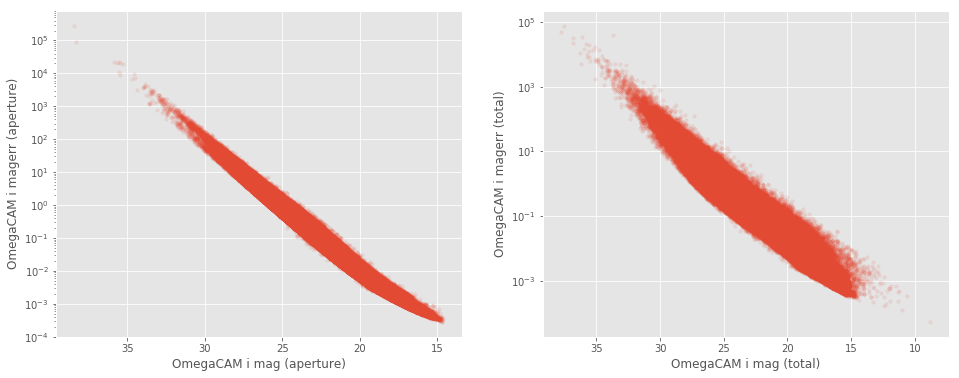

SUPRIME i mag (aperture)
    Error max: 16441261686784
    magerr > 10: Number of objects = 3898, min mag = 22.7
    magerr > 100: Number of objects = 1423, min mag = 32.0
    magerr > 1000: Number of objects = 567, min mag = 34.2

SUPRIME i mag (total)
    Error max: 93626703872
    magerr > 10: Number of objects = 7191, min mag = 22.6
    magerr > 100: Number of objects = 997, min mag = 22.6
    magerr > 1000: Number of objects = 192, min mag = 32.7



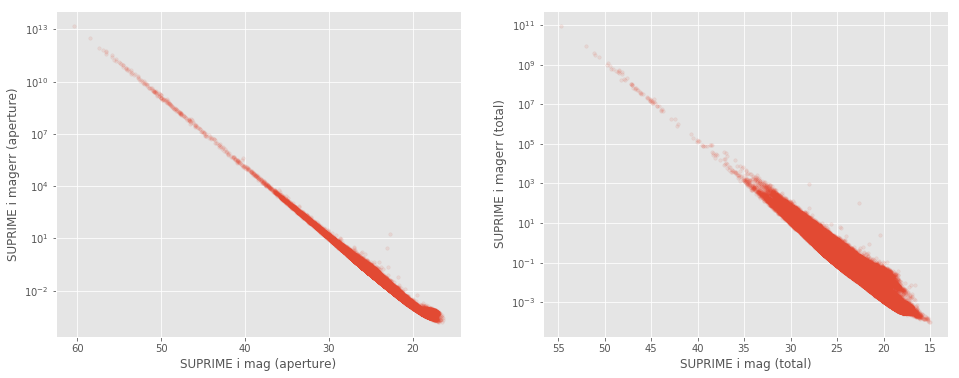

GPC1 i mag (aperture)
    Error max: 11583
    magerr > 10: Number of objects = 820, min mag = 21.3
    magerr > 100: Number of objects = 87, min mag = 23.5
    magerr > 1000: Number of objects = 6, min mag = 27.7

GPC1 i mag (total)
    Error max: 6874
    magerr > 10: Number of objects = 859, min mag = 20.2
    magerr > 100: Number of objects = 77, min mag = 23.6
    magerr > 1000: Number of objects = 6, min mag = 28.2



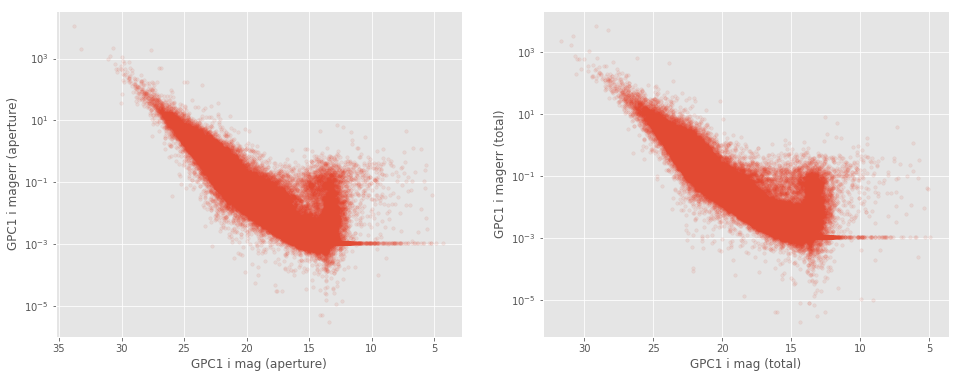

Megacam z mag (aperture)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam z mag (total)
    Error max: 10
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



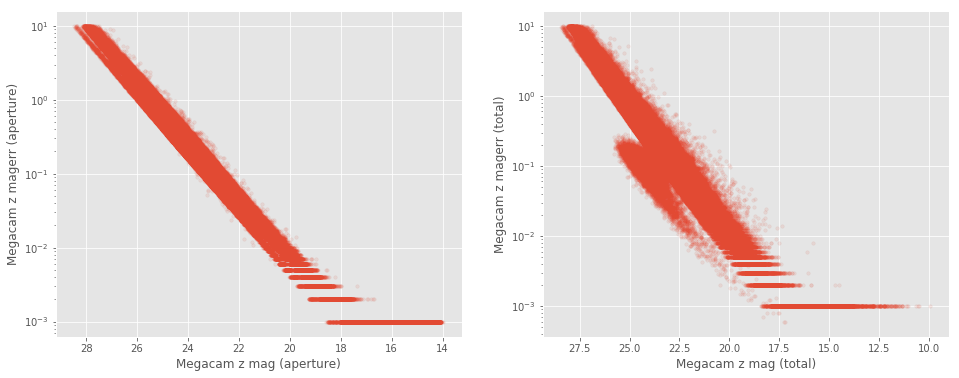

DECam z mag (aperture)
    Error max: 113229
    magerr > 10: Number of objects = 8353, min mag = 25.6
    magerr > 100: Number of objects = 782, min mag = 28.1
    magerr > 1000: Number of objects = 75, min mag = 30.9

DECam z mag (total)
    Error max: 1408916
    magerr > 10: Number of objects = 1861, min mag = 7.4
    magerr > 100: Number of objects = 189, min mag = 15.0
    magerr > 1000: Number of objects = 21, min mag = 15.0



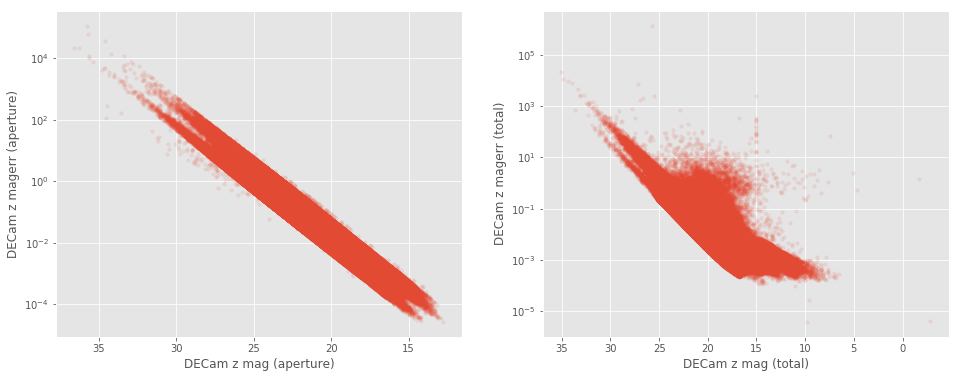

SUPRIME z mag (aperture)
    Error max: 2937344776732672
    magerr > 10: Number of objects = 18602, min mag = 28.3
    magerr > 100: Number of objects = 8910, min mag = 31.2
    magerr > 1000: Number of objects = 4167, min mag = 33.4

SUPRIME z mag (total)
    Error max: 43090324750336
    magerr > 10: Number of objects = 15124, min mag = 26.6
    magerr > 100: Number of objects = 3819, min mag = 29.1
    magerr > 1000: Number of objects = 1545, min mag = 32.2



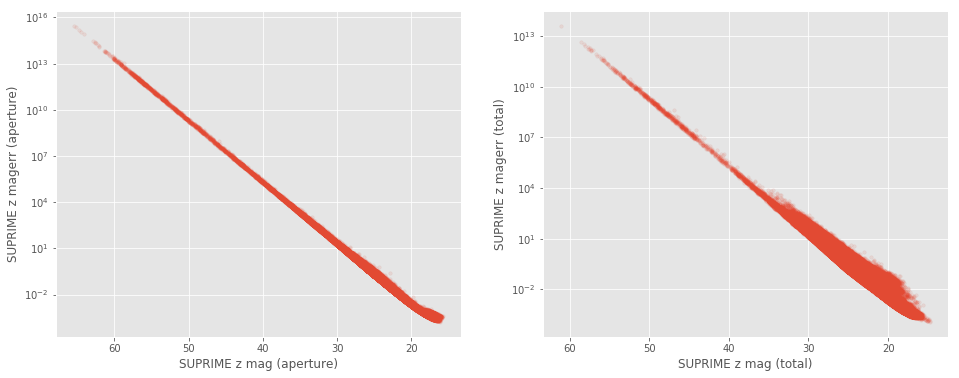

GPC1 z mag (aperture)
    Error max: 31097
    magerr > 10: Number of objects = 1041, min mag = 12.1
    magerr > 100: Number of objects = 105, min mag = 25.9
    magerr > 1000: Number of objects = 10, min mag = 28.4

GPC1 z mag (total)
    Error max: 27169
    magerr > 10: Number of objects = 1271, min mag = 21.2
    magerr > 100: Number of objects = 129, min mag = 24.2
    magerr > 1000: Number of objects = 7, min mag = 28.4



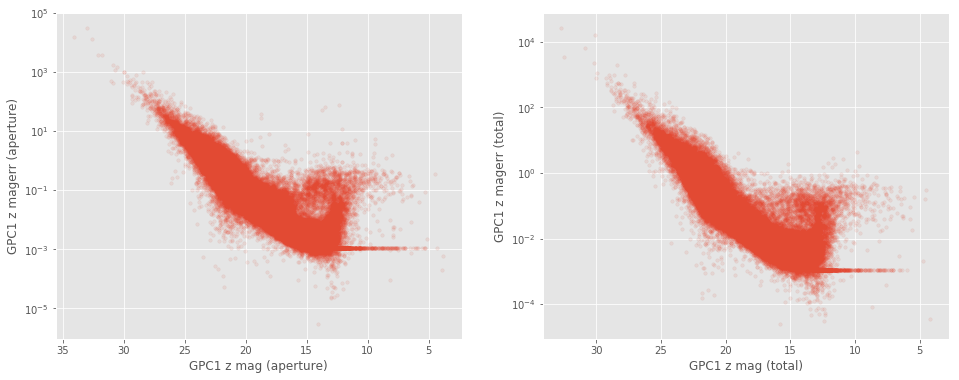

VISTA Z mag (aperture)
    Error max: 2432
    magerr > 10: Number of objects = 26, min mag = 23.5
    magerr > 100: Number of objects = 1, min mag = 32.8
    magerr > 1000: Number of objects = 1, min mag = 32.8

VISTA Z mag (total)
    Error max: 137260
    magerr > 10: Number of objects = 889, min mag = 22.6
    magerr > 100: Number of objects = 82, min mag = 27.6
    magerr > 1000: Number of objects = 12, min mag = 31.2



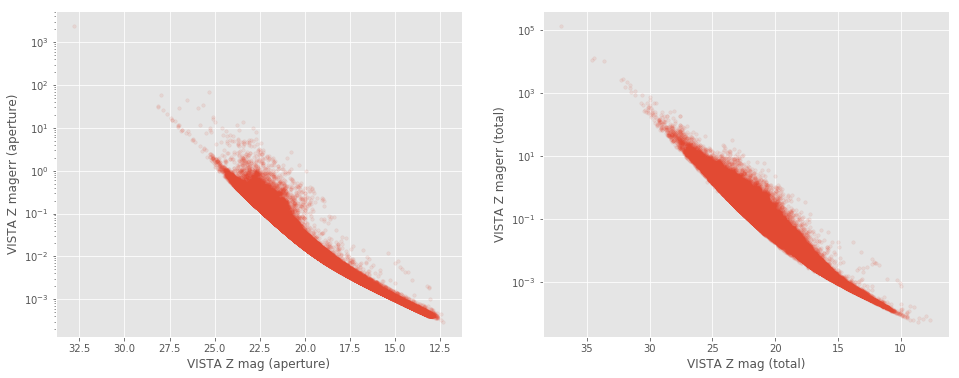

SUPRIME y mag (aperture)
    Error max: 785976263704576
    magerr > 10: Number of objects = 51061, min mag = 27.7
    magerr > 100: Number of objects = 20705, min mag = 30.2
    magerr > 1000: Number of objects = 7000, min mag = 32.9

SUPRIME y mag (total)
    Error max: 3517747560448
    magerr > 10: Number of objects = 30130, min mag = 24.9
    magerr > 100: Number of objects = 6757, min mag = 28.9
    magerr > 1000: Number of objects = 2185, min mag = 31.4



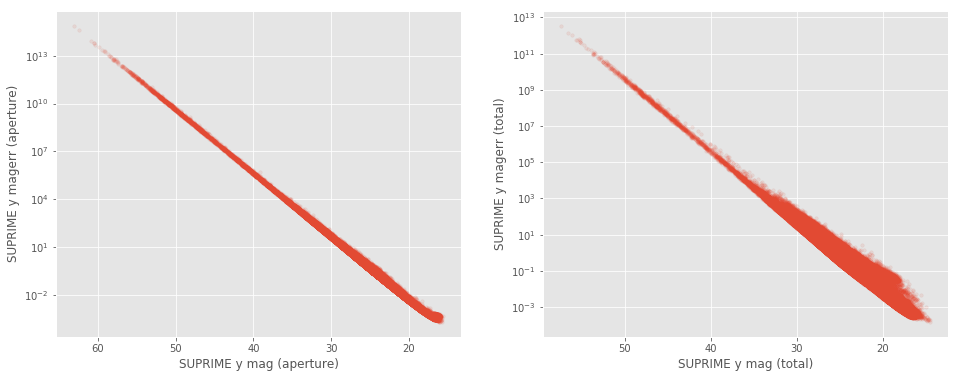

GPC1 y mag (aperture)
    Error max: 208610
    magerr > 10: Number of objects = 2357, min mag = 12.4
    magerr > 100: Number of objects = 229, min mag = 20.5
    magerr > 1000: Number of objects = 27, min mag = 24.9

GPC1 y mag (total)
    Error max: 11927
    magerr > 10: Number of objects = 3728, min mag = 11.6
    magerr > 100: Number of objects = 347, min mag = 21.6
    magerr > 1000: Number of objects = 27, min mag = 27.1



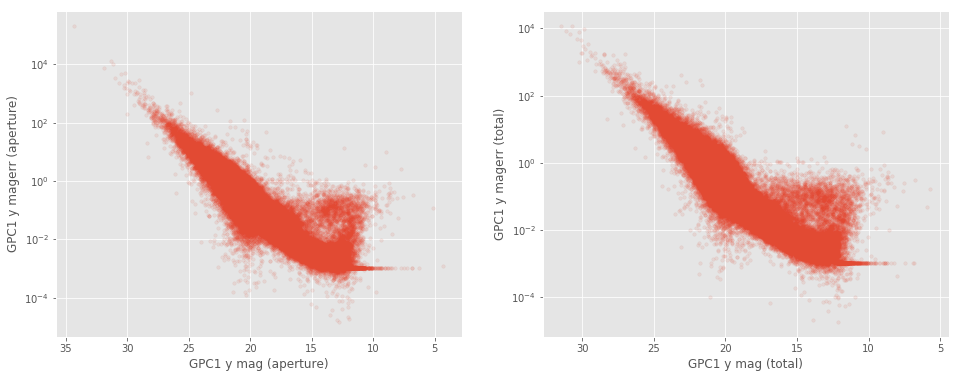

VISTA Y mag (aperture)
    Error max: 3836
    magerr > 10: Number of objects = 361, min mag = 18.5
    magerr > 100: Number of objects = 32, min mag = 18.5
    magerr > 1000: Number of objects = 9, min mag = 18.7

VISTA Y mag (total)
    Error max: 3836
    magerr > 10: Number of objects = 367, min mag = 22.1
    magerr > 100: Number of objects = 32, min mag = 26.9
    magerr > 1000: Number of objects = 9, min mag = 29.3



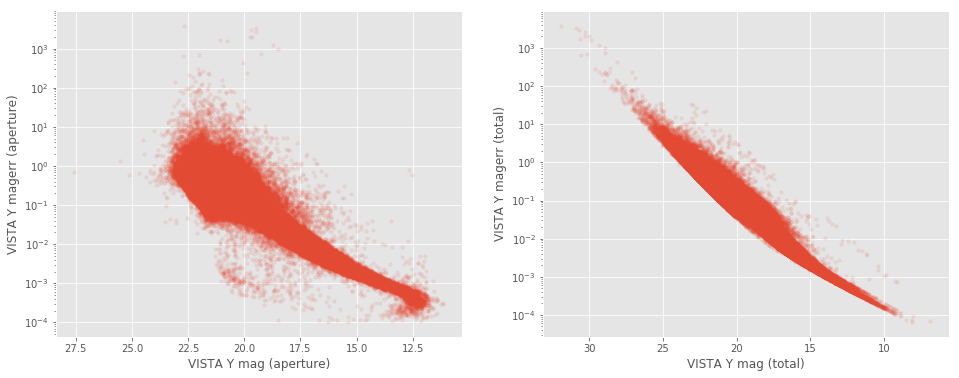

UKIDSS Y mag (aperture)
    Error max: 93
    magerr > 10: Number of objects = 21, min mag = 24.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS Y mag (total)
    Error max: 694
    magerr > 10: Number of objects = 171, min mag = 23.2
    magerr > 100: Number of objects = 18, min mag = 25.4
    magerr > 1000: Number of objects = 0, min mag = nan



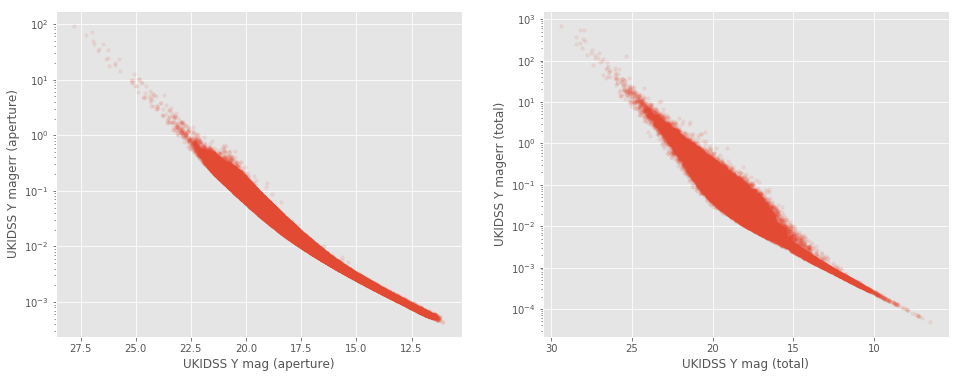

UKIDSS J mag (aperture)
    Error max: 1922
    magerr > 10: Number of objects = 26, min mag = 24.7
    magerr > 100: Number of objects = 5, min mag = 27.7
    magerr > 1000: Number of objects = 2, min mag = 30.3

UKIDSS J mag (total)
    Error max: 205
    magerr > 10: Number of objects = 53, min mag = 24.1
    magerr > 100: Number of objects = 4, min mag = 27.4
    magerr > 1000: Number of objects = 0, min mag = nan



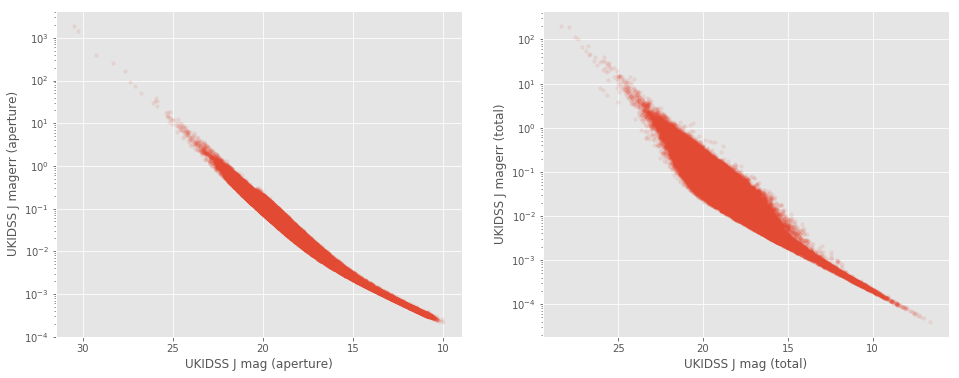

VISTA J mag (aperture)
    Error max: 24248
    magerr > 10: Number of objects = 454, min mag = 17.6
    magerr > 100: Number of objects = 46, min mag = 19.3
    magerr > 1000: Number of objects = 4, min mag = 21.5

VISTA J mag (total)
    Error max: 24248
    magerr > 10: Number of objects = 460, min mag = 20.7
    magerr > 100: Number of objects = 46, min mag = 26.5
    magerr > 1000: Number of objects = 4, min mag = 30.3



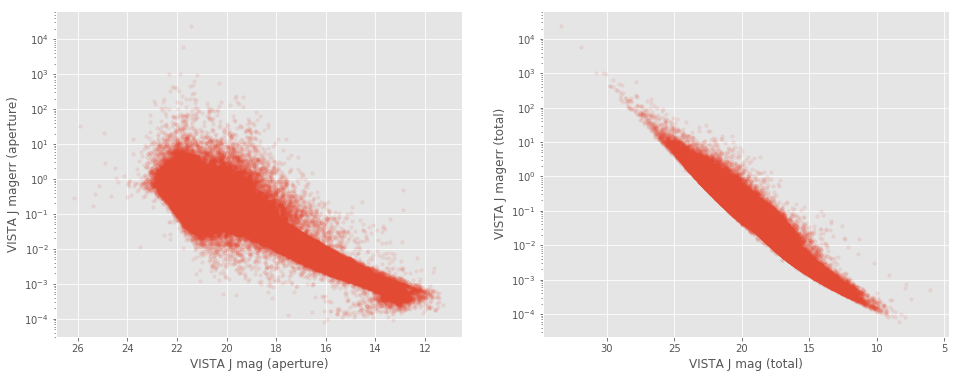

UKIDSS H mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS H mag (total)
    Error max: 521
    magerr > 10: Number of objects = 109, min mag = 23.3
    magerr > 100: Number of objects = 4, min mag = 26.1
    magerr > 1000: Number of objects = 0, min mag = nan



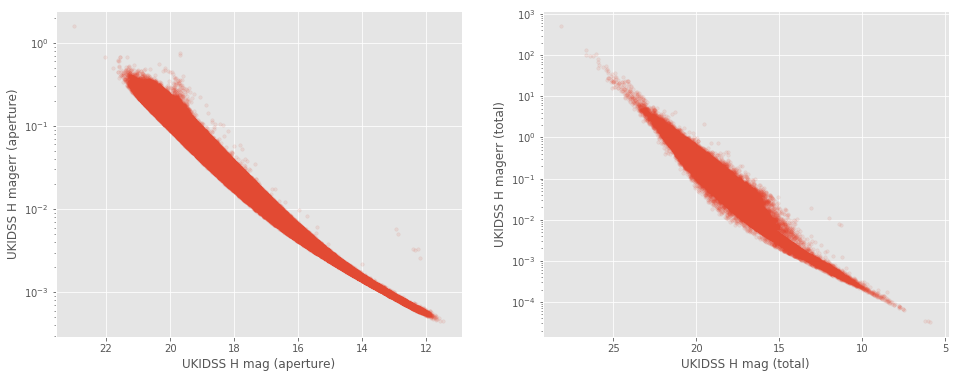

VISTA H mag (aperture)
    Error max: 11729
    magerr > 10: Number of objects = 1473, min mag = 17.8
    magerr > 100: Number of objects = 149, min mag = 18.4
    magerr > 1000: Number of objects = 11, min mag = 19.0

VISTA H mag (total)
    Error max: 11729
    magerr > 10: Number of objects = 1477, min mag = 20.3
    magerr > 100: Number of objects = 149, min mag = 23.8
    magerr > 1000: Number of objects = 11, min mag = 28.4



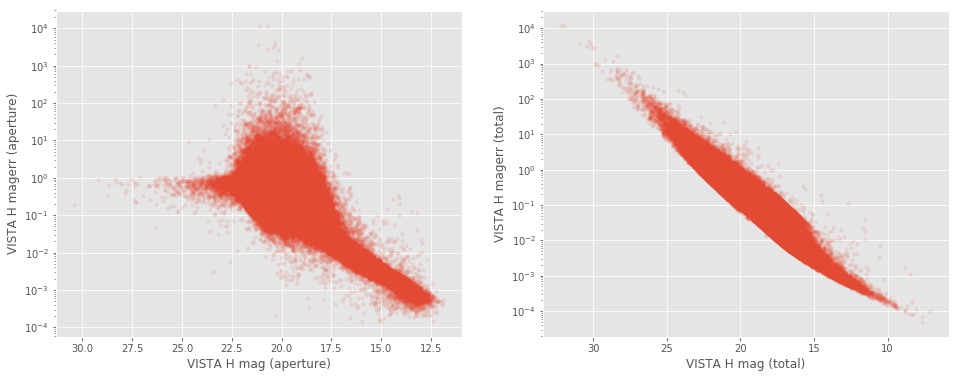

UKIDSS K mag (aperture)
    Error max: 57
    magerr > 10: Number of objects = 1, min mag = 26.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS K mag (total)
    Error max: 11074
    magerr > 10: Number of objects = 138, min mag = 23.3
    magerr > 100: Number of objects = 11, min mag = 25.9
    magerr > 1000: Number of objects = 3, min mag = 29.4



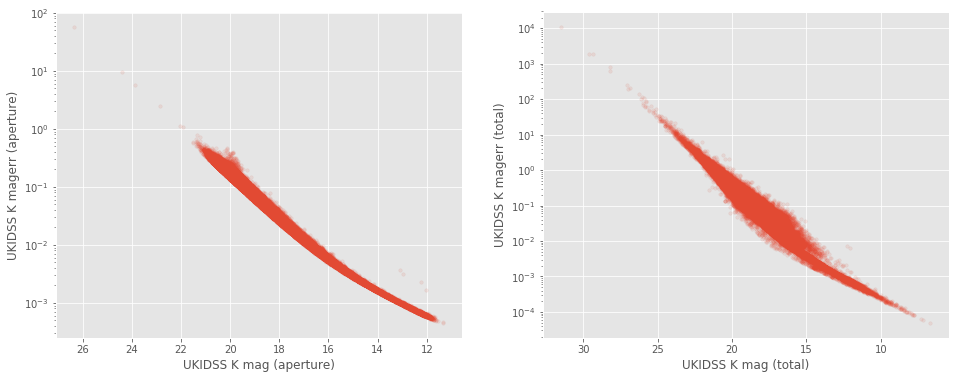

VISTA Ks mag (aperture)
    Error max: 2905
    magerr > 10: Number of objects = 300, min mag = 16.5
    magerr > 100: Number of objects = 18, min mag = 19.0
    magerr > 1000: Number of objects = 2, min mag = 20.9

VISTA Ks mag (total)
    Error max: 2905
    magerr > 10: Number of objects = 300, min mag = 21.5
    magerr > 100: Number of objects = 18, min mag = 24.3
    magerr > 1000: Number of objects = 2, min mag = 30.1



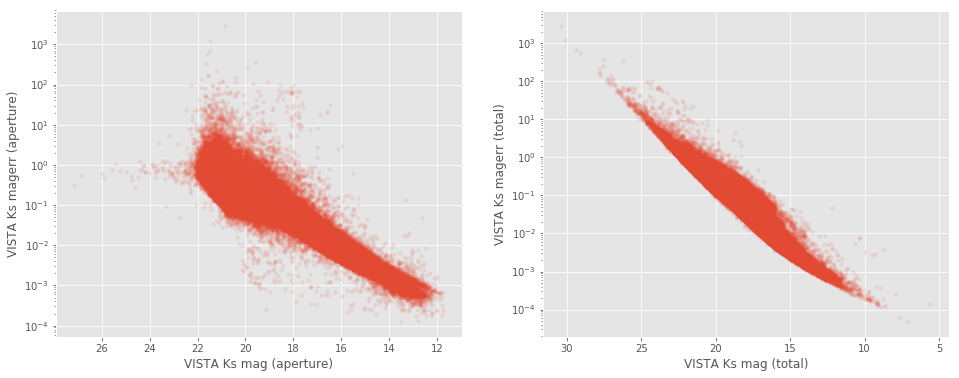

In [19]:
for mag in all_mags:
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    #if basecol == "omegacam_u":
    if basecol == "suprime_g":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [7]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None,  
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2:
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    # Comparing magnitudes
    ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
    ax2.plot(x2[mask], y2[mask], 'b.')
    if mask2 is not None:
        ax2.plot(x2[mask2], y2[mask2], 'g.')
    ax2.invert_xaxis()
    ax2.invert_yaxis()
    ax2.set_xlabel(labels2[0])
    ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()


### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 758


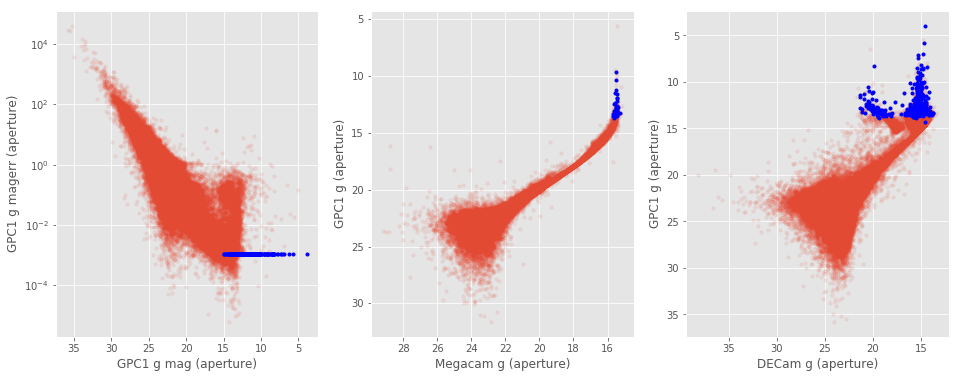

GPC1 r
   Number of flagged objects: 879


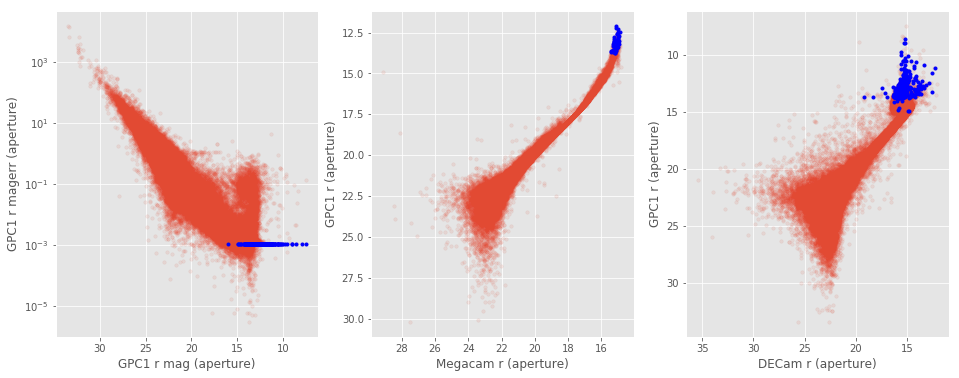

GPC1 i
   Number of flagged objects: 983


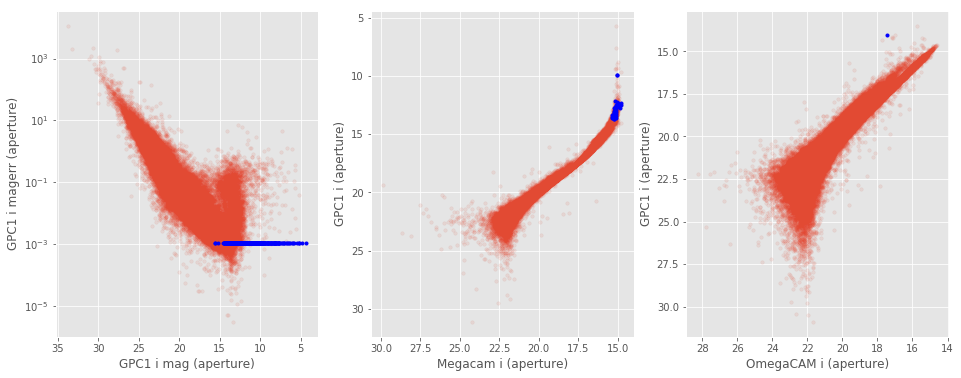

GPC1 z
   Number of flagged objects: 699


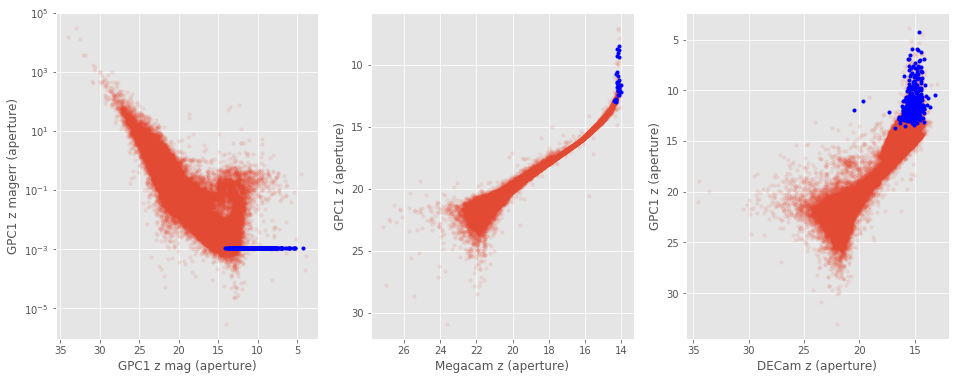

GPC1 y
   Number of flagged objects: 299


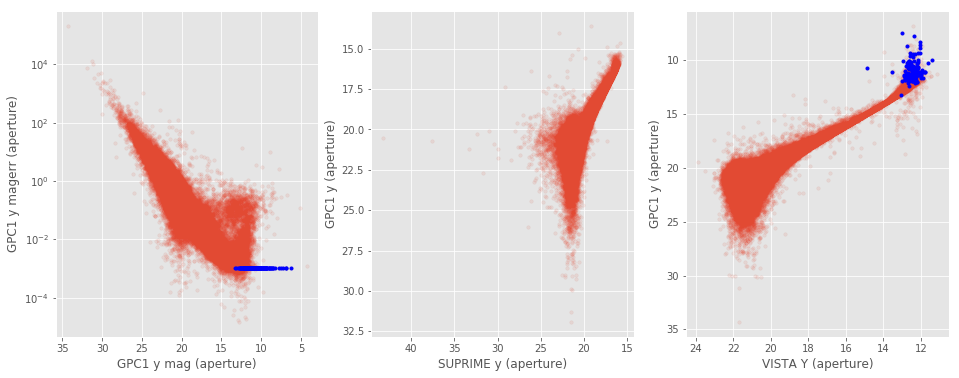

In [8]:
ps1_err = 0.0010860000038519502
bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_i':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.b. DECaLS total magnitudes

DECam g
   Number of flagged objects (m=14.999935): 110
   Number of flagged objects (m < 7 (and m=0)): 32 (3)


/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/astropy/table/column.py:929: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, oper)(other)


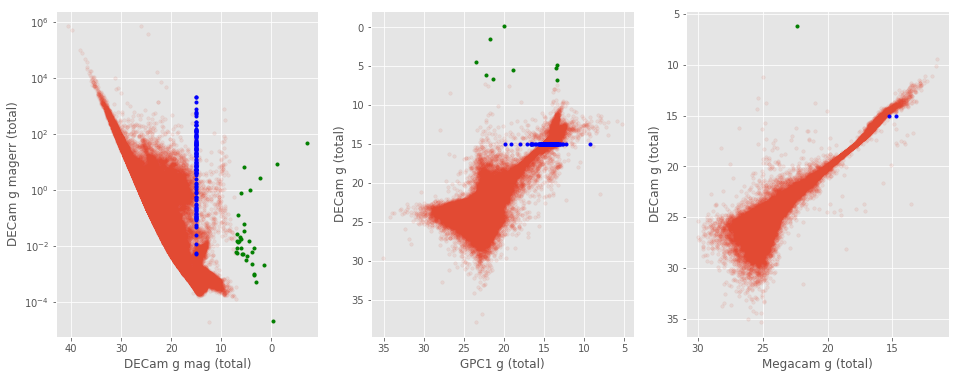

DECam r
   Number of flagged objects (m=14.999935): 96
   Number of flagged objects (m < 7 (and m=0)): 17 (1)


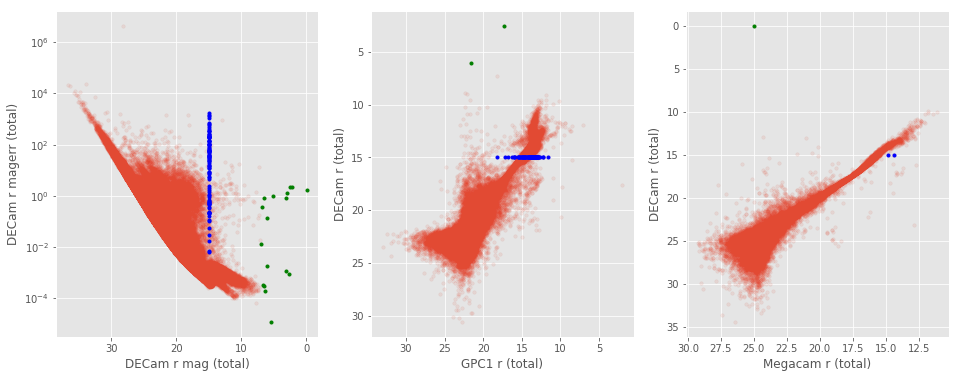

DECam z
   Number of flagged objects (m=14.999935): 18
   Number of flagged objects (m < 7 (and m=0)): 7 (2)


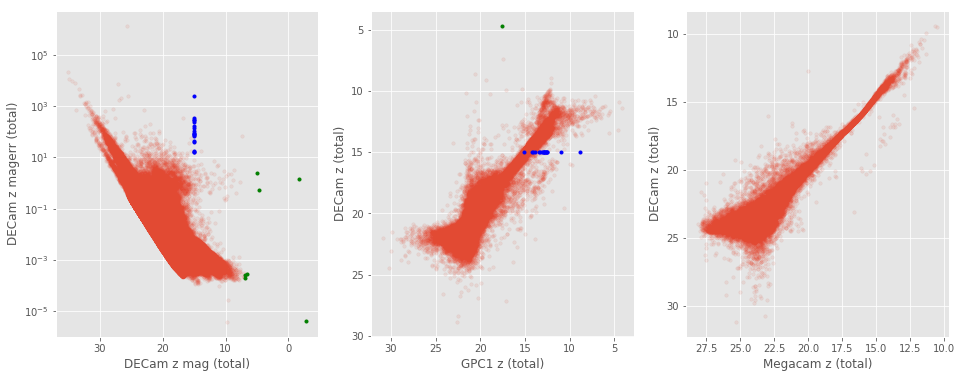

In [14]:
bands = ['g', 'r', 'z']

for i, surveys in enumerate([g_bands, r_bands, z_bands]):
    surveys.insert(0, surveys.pop(surveys.index('DECam '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
    ecol1 = "merr_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (total)".format(surveys[2]), "{} (total)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'decam_g':
        savefig = True
    else:
        savefig = False

    def cstr(s, color=34):
        # ANSI color: red: color=31, blue: color=34, green:color=32
        return "\x1b[{}m{}\x1b[0m".format(color, s)


    mask = (master_catalogue[col1] == 14.999935)
    print ('   Number of flagged objects ({}): {}'.format(cstr('m=14.999935'), len(master_catalogue[ecol1][mask])))
    mask2 = (master_catalogue[col1] < 7)
    mag0 = (master_catalogue[col1] < 0)
    print('   Number of flagged objects ({}): {} ({})'.format(cstr('m < 7 (and m=0)', color=32),\
                                                                           len(master_catalogue[ecol1][mask2]),\
                                                                           len(master_catalogue[ecol1][mag0])))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                   master_catalogue[col2], master_catalogue[col1], 
                   x3=x3, y3=y3, mask2=mask2, 
                   labels1=("{} mag (total)".format(surveys[0]), "{} magerr (total)".format(surveys[0])),
                   labels2=("{} (total)".format(surveys[1]), "{} (total)".format(surveys[0])),
                   labels3=labels3, nb=len(surveys), savefig=savefig)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 4.7\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [5]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

OmegaCAM u (aperture) - Megacam u (aperture) (126694 sources):
- Median: 0.16
- Median Absolute Deviation: 0.38
- 1% percentile: -2.3564561462402343
- 99% percentile: 2.5103386306762694
Outliers separation: log(chi2) = 4.48
Number of outliers: 384



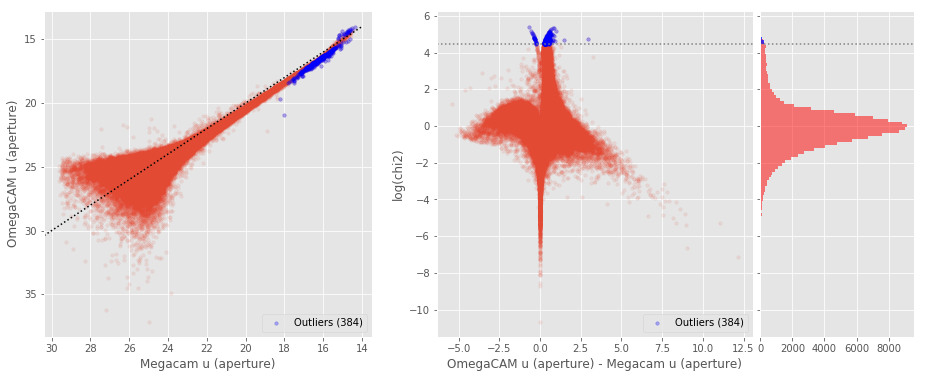

OmegaCAM u (total) - Megacam u (total) (131471 sources):
- Median: 0.26
- Median Absolute Deviation: 0.43
- 1% percentile: -2.3141082763671874
- 99% percentile: 3.3964653015136776
Outliers separation: log(chi2) = 4.02
Number of outliers: 1133



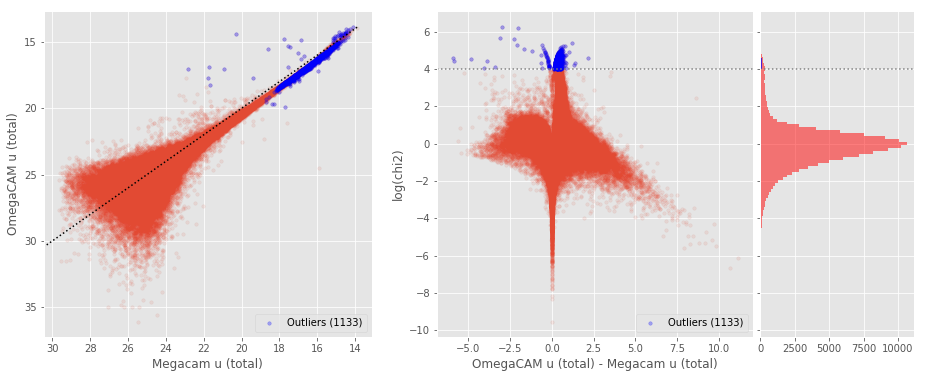

DECam g (aperture) - Megacam g (aperture) (142328 sources):
- Median: -0.01
- Median Absolute Deviation: 0.23
- 1% percentile: -1.5607752799987793
- 99% percentile: 2.7445079803466923
Outliers separation: log(chi2) = 4.50
Number of outliers: 1682



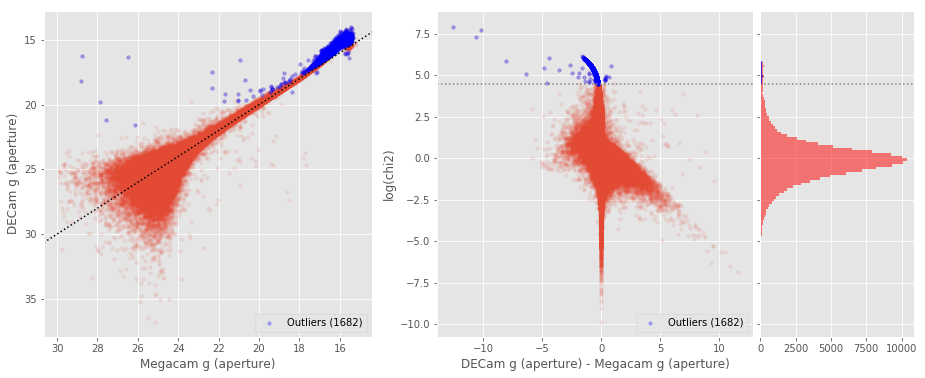

DECam g (total) - Megacam g (total) (144859 sources):
- Median: 0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -1.2292822265624999
- 99% percentile: 2.845144538879412
Outliers separation: log(chi2) = 4.07
Number of outliers: 1965



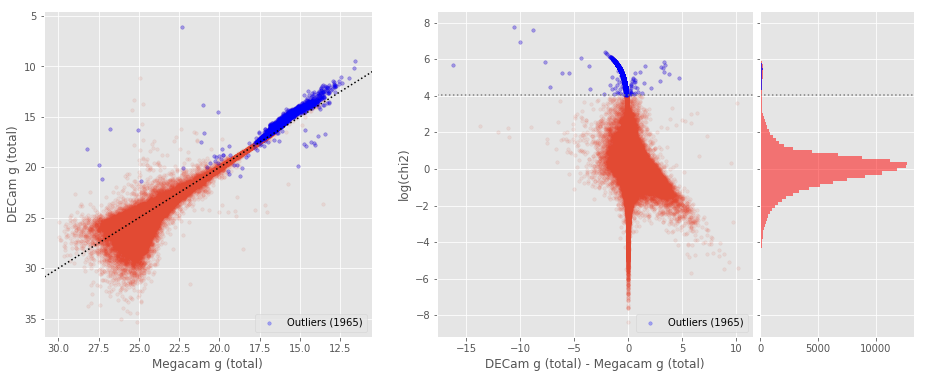

OmegaCAM g (aperture) - Megacam g (aperture) (169795 sources):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -0.8516174697875977
- 99% percentile: 1.6235643386840821
Outliers separation: log(chi2) = 4.79
Number of outliers: 340



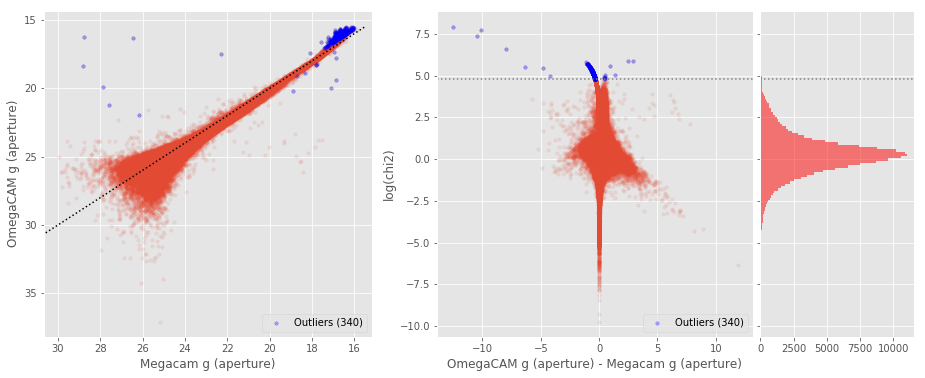

OmegaCAM g (total) - Megacam g (total) (171864 sources):
- Median: 0.29
- Median Absolute Deviation: 0.23
- 1% percentile: -0.811663818359375
- 99% percentile: 2.5189780807495086
Outliers separation: log(chi2) = 4.22
Number of outliers: 676



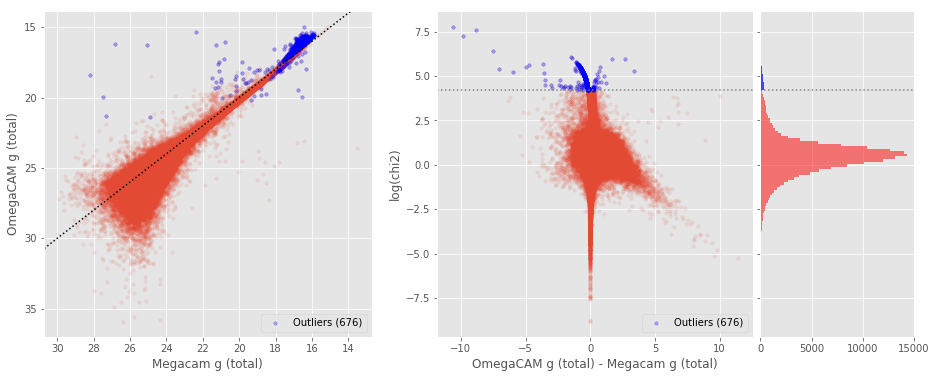

No sources have both Megacam g (aperture) and SUPRIME g (aperture) values.

No sources have both Megacam g (total) and SUPRIME g (total) values.

GPC1 g (aperture) - Megacam g (aperture) (45061 sources):
- Median: -0.13
- Median Absolute Deviation: 0.28
- 1% percentile: -2.7003189086914063
- 99% percentile: 2.3876796722412132
Outliers separation: log(chi2) = 6.53
Number of outliers: 19



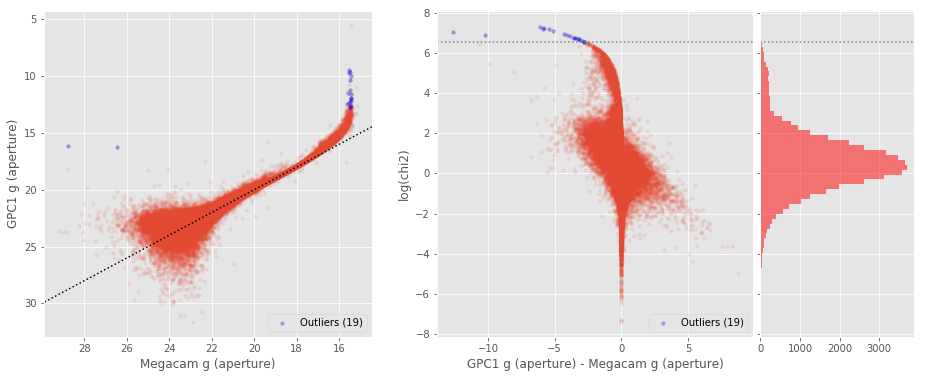

GPC1 g (total) - Megacam g (total) (45188 sources):
- Median: 0.03
- Median Absolute Deviation: 0.23
- 1% percentile: -2.843809013366699
- 99% percentile: 1.8545727920532173
Outliers separation: log(chi2) = 5.45
Number of outliers: 119



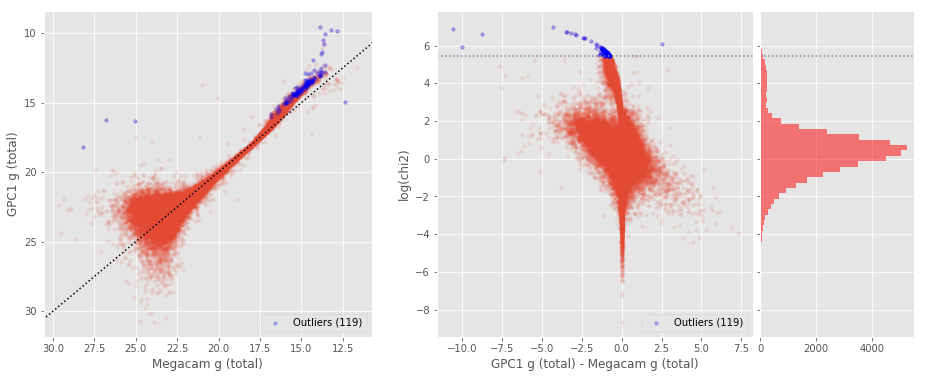

OmegaCAM g (aperture) - DECam g (aperture) (1394297 sources):
- Median: 0.20
- Median Absolute Deviation: 0.26
- 1% percentile: -2.425627593994141
- 99% percentile: 1.6451313781738293
Outliers separation: log(chi2) = 5.98
Number of outliers: 80



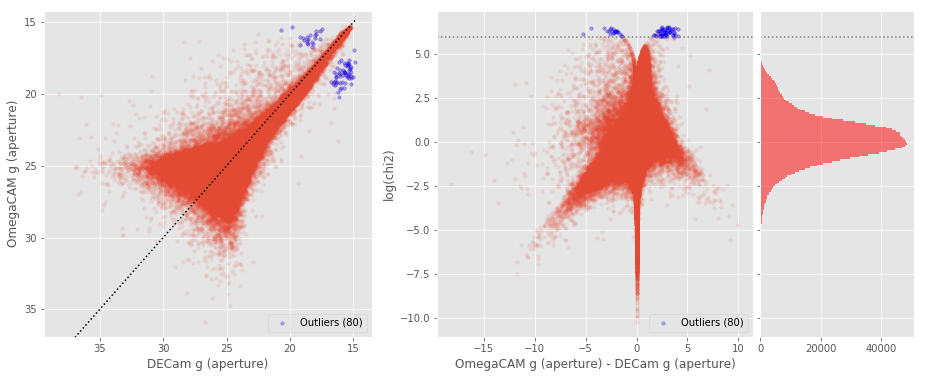

OmegaCAM g (total) - DECam g (total) (1428394 sources):
- Median: 0.11
- Median Absolute Deviation: 0.22
- 1% percentile: -1.9927460479736328
- 99% percentile: 2.037714328765873
Outliers separation: log(chi2) = 4.89
Number of outliers: 195



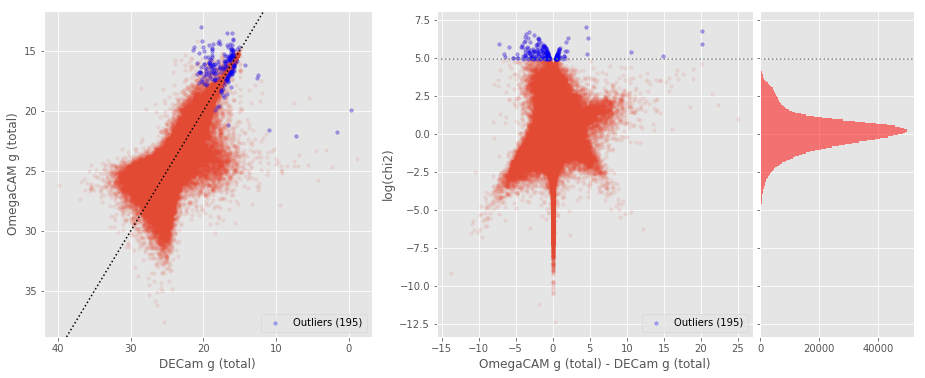

SUPRIME g (aperture) - DECam g (aperture) (549243 sources):
- Median: 0.08
- Median Absolute Deviation: 0.31
- 1% percentile: -2.926829032897949
- 99% percentile: 2.2232090759277185
Outliers separation: log(chi2) = 5.27
Number of outliers: 63



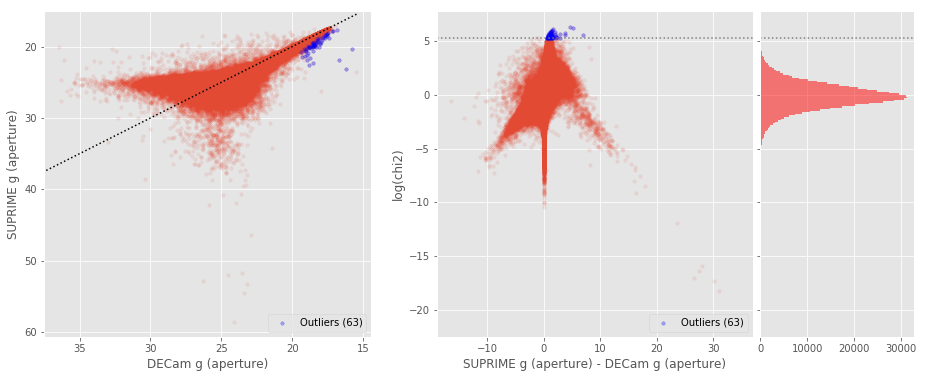

SUPRIME g (total) - DECam g (total) (551213 sources):
- Median: -0.15
- Median Absolute Deviation: 0.24
- 1% percentile: -2.9569704437255857
- 99% percentile: 2.125518341064455
Outliers separation: log(chi2) = 4.19
Number of outliers: 272



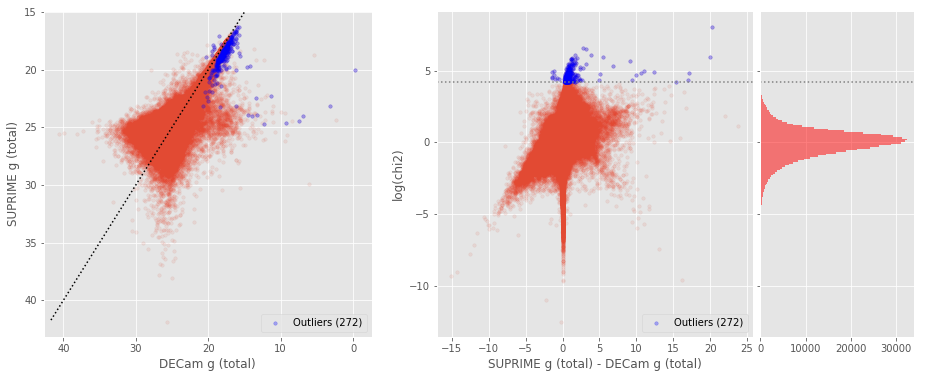

GPC1 g (aperture) - DECam g (aperture) (555551 sources):
- Median: -0.04
- Median Absolute Deviation: 0.24
- 1% percentile: -3.3257884979248047
- 99% percentile: 2.413954734802246
Outliers separation: log(chi2) = 5.08
Number of outliers: 3999



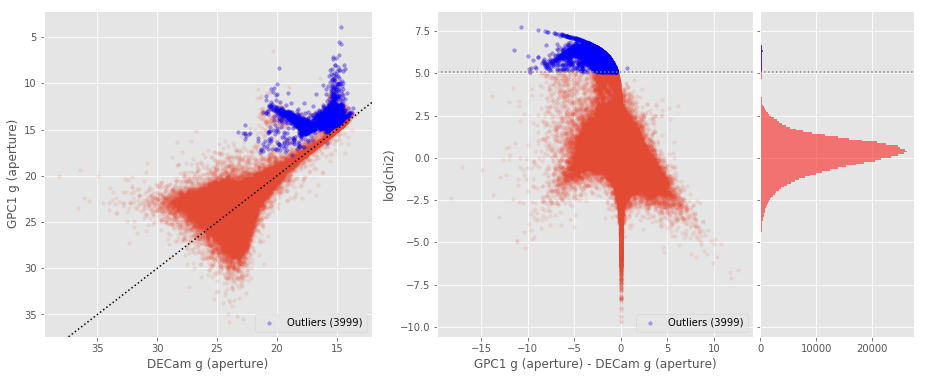

GPC1 g (total) - DECam g (total) (560434 sources):
- Median: 0.03
- Median Absolute Deviation: 0.22
- 1% percentile: -3.275019130706787
- 99% percentile: 2.047042484283451
Outliers separation: log(chi2) = 5.37
Number of outliers: 228



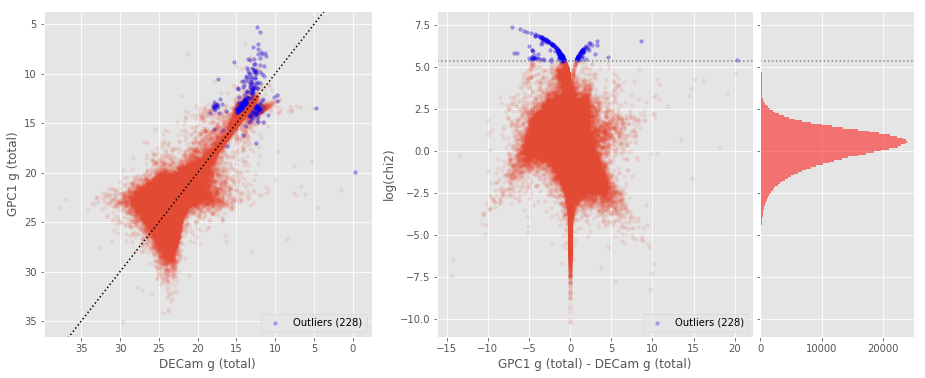

SUPRIME g (aperture) - OmegaCAM g (aperture) (814857 sources):
- Median: -0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -1.648996353149414
- 99% percentile: 0.9430461120605438
Outliers separation: log(chi2) = 4.19
Number of outliers: 84



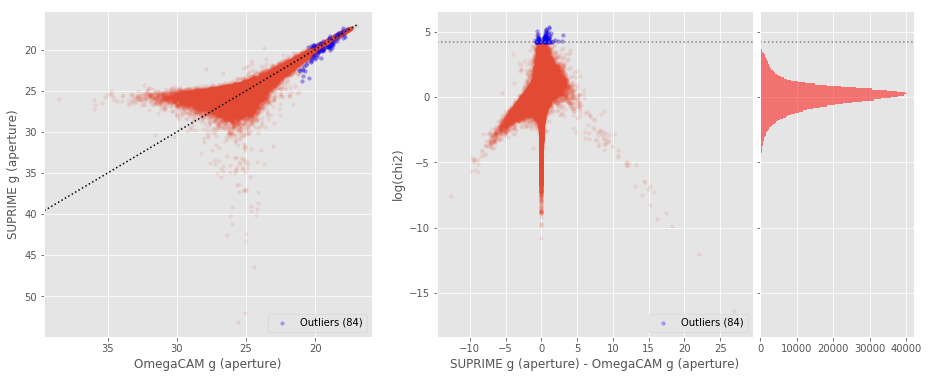

SUPRIME g (total) - OmegaCAM g (total) (798474 sources):
- Median: -0.30
- Median Absolute Deviation: 0.26
- 1% percentile: -2.7267471694946286
- 99% percentile: 1.2941008567810082
Outliers separation: log(chi2) = 4.19
Number of outliers: 344



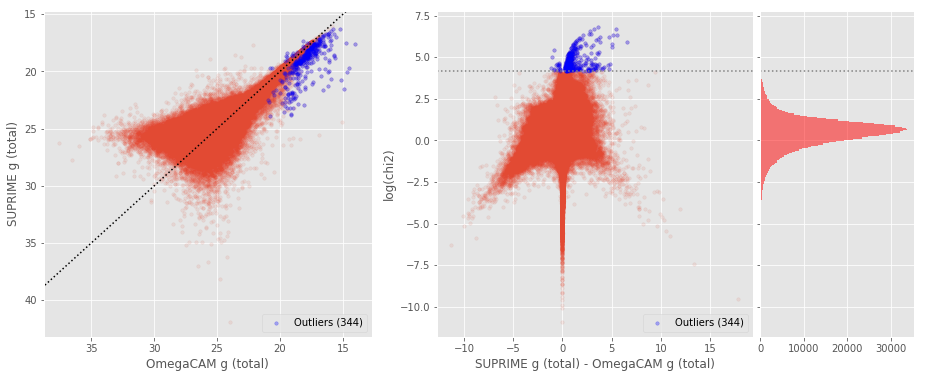

GPC1 g (aperture) - OmegaCAM g (aperture) (576753 sources):
- Median: -0.26
- Median Absolute Deviation: 0.33
- 1% percentile: -2.896809158325195
- 99% percentile: 2.229577102661132
Outliers separation: log(chi2) = 7.11
Number of outliers: 0



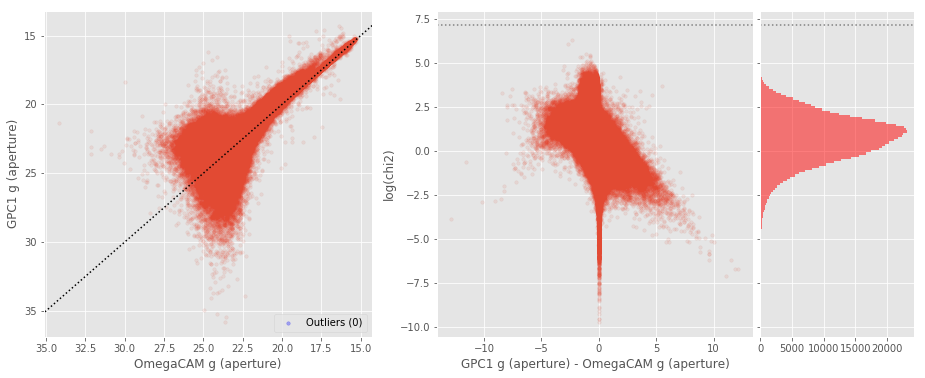

GPC1 g (total) - OmegaCAM g (total) (577112 sources):
- Median: -0.08
- Median Absolute Deviation: 0.23
- 1% percentile: -3.3261725425720217
- 99% percentile: 1.8503779029846201
Outliers separation: log(chi2) = 5.59
Number of outliers: 6



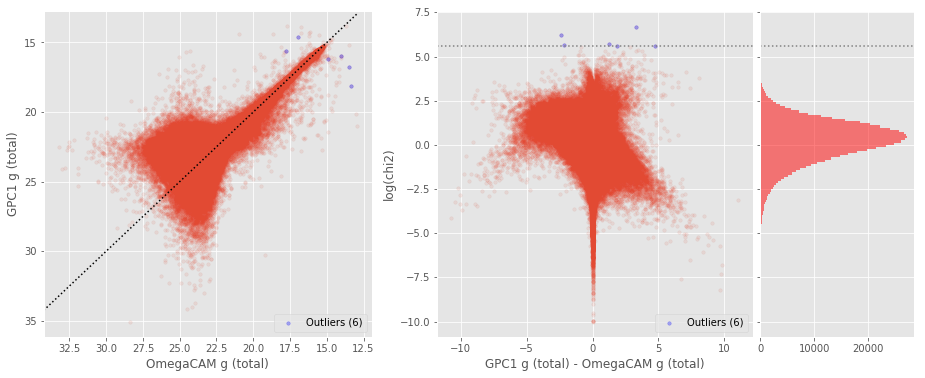

GPC1 g (aperture) - SUPRIME g (aperture) (177225 sources):
- Median: -0.18
- Median Absolute Deviation: 0.36
- 1% percentile: -2.9991661834716794
- 99% percentile: 2.362476730346682
Outliers separation: log(chi2) = 6.22
Number of outliers: 0



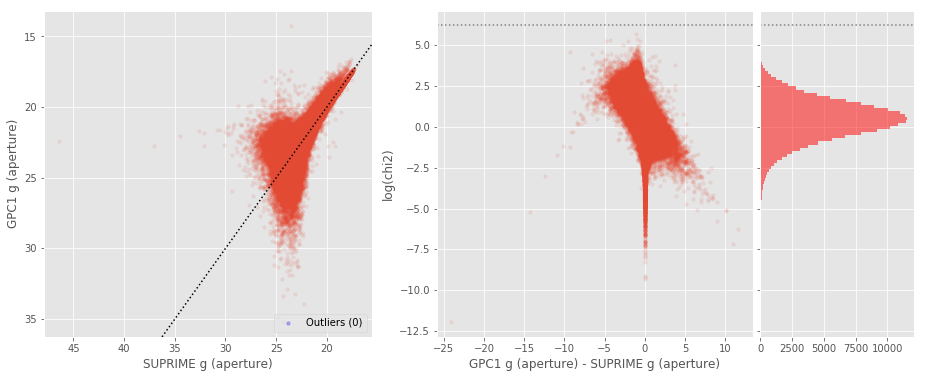

GPC1 g (total) - SUPRIME g (total) (176775 sources):
- Median: 0.02
- Median Absolute Deviation: 0.26
- 1% percentile: -3.13635498046875
- 99% percentile: 1.9695343017578129
Outliers separation: log(chi2) = 5.19
Number of outliers: 3



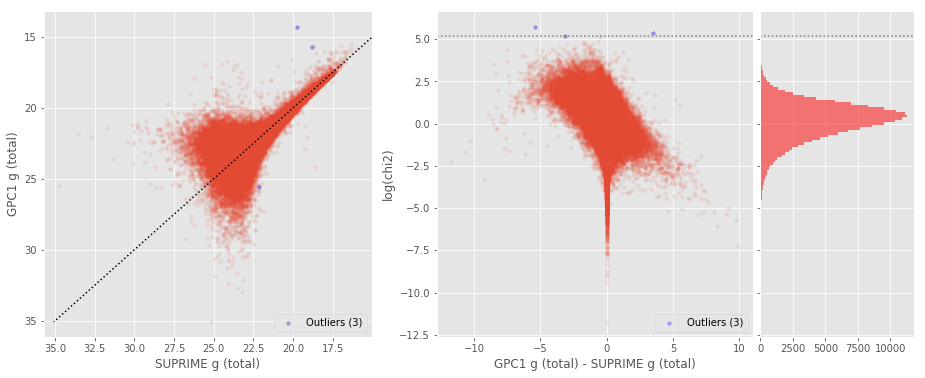

DECam r (aperture) - Megacam r (aperture) (150718 sources):
- Median: -0.17
- Median Absolute Deviation: 0.20
- 1% percentile: -1.3818358612060548
- 99% percentile: 2.6100524711608744
Outliers separation: log(chi2) = 6.73
Number of outliers: 2



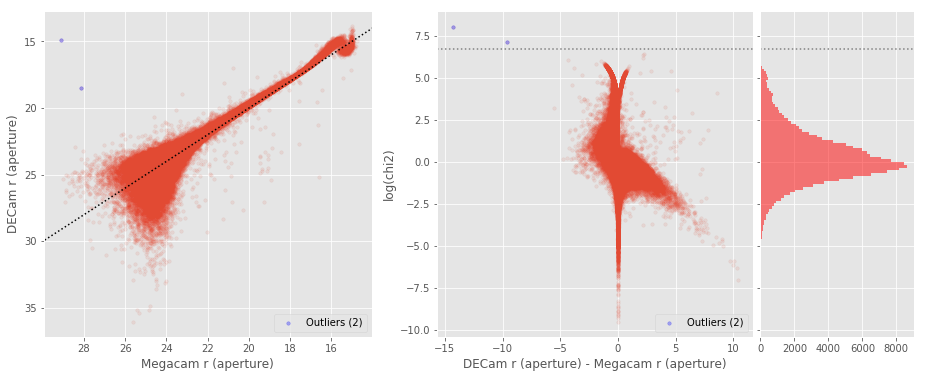

DECam r (total) - Megacam r (total) (157247 sources):
- Median: -0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -1.3091444015502929
- 99% percentile: 2.164816131591802
Outliers separation: log(chi2) = 5.50
Number of outliers: 527



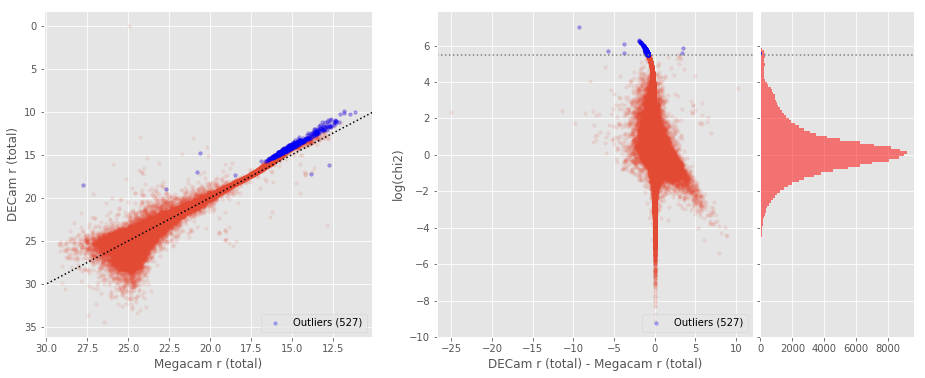

OmegaCAM r (aperture) - Megacam r (aperture) (180288 sources):
- Median: 0.04
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9275249290466308
- 99% percentile: 0.8000829887390137
Outliers separation: log(chi2) = 4.86
Number of outliers: 8



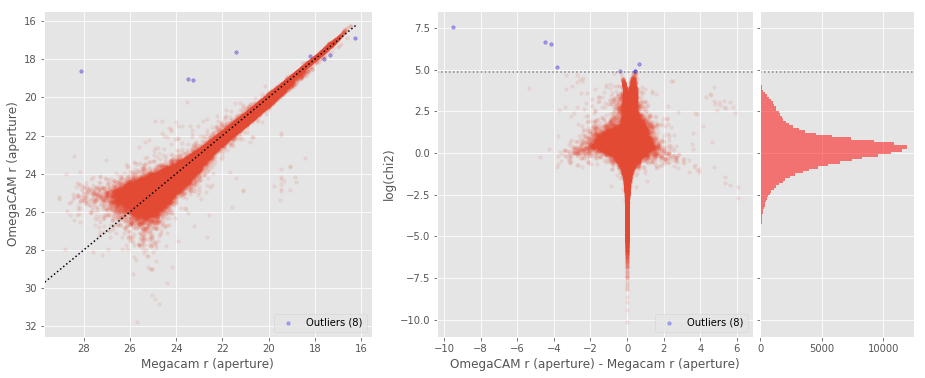

OmegaCAM r (total) - Megacam r (total) (181545 sources):
- Median: 0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -0.9332782745361328
- 99% percentile: 1.3440770721435547
Outliers separation: log(chi2) = 4.54
Number of outliers: 45



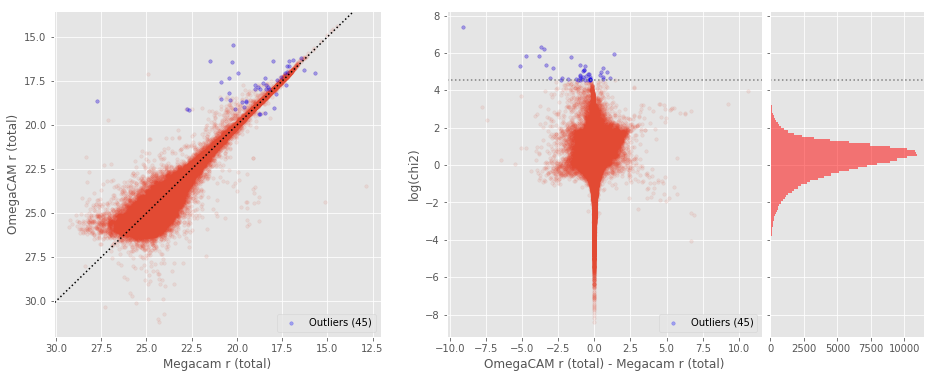

No sources have both Megacam r (aperture) and SUPRIME r (aperture) values.

No sources have both Megacam r (total) and SUPRIME r (total) values.

GPC1 r (aperture) - Megacam r (aperture) (48105 sources):
- Median: -0.09
- Median Absolute Deviation: 0.18
- 1% percentile: -1.6788975524902343
- 99% percentile: 1.761156005859374
Outliers separation: log(chi2) = 6.58
Number of outliers: 3



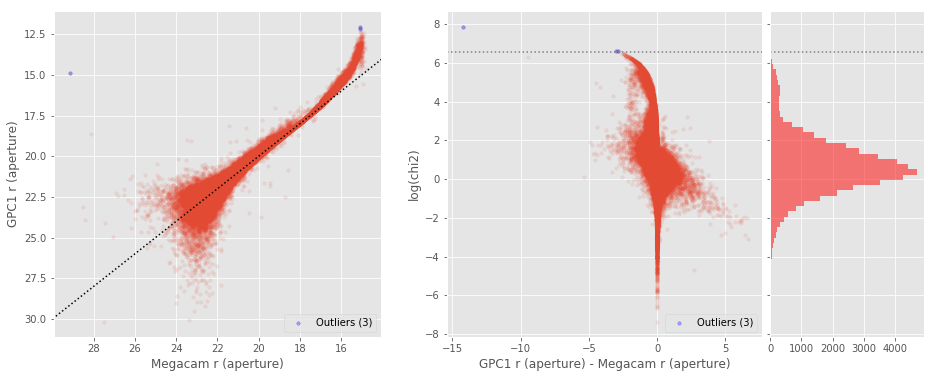

GPC1 r (total) - Megacam r (total) (48312 sources):
- Median: 0.07
- Median Absolute Deviation: 0.13
- 1% percentile: -1.4666668128967286
- 99% percentile: 1.288244590759277
Outliers separation: log(chi2) = 5.14
Number of outliers: 301



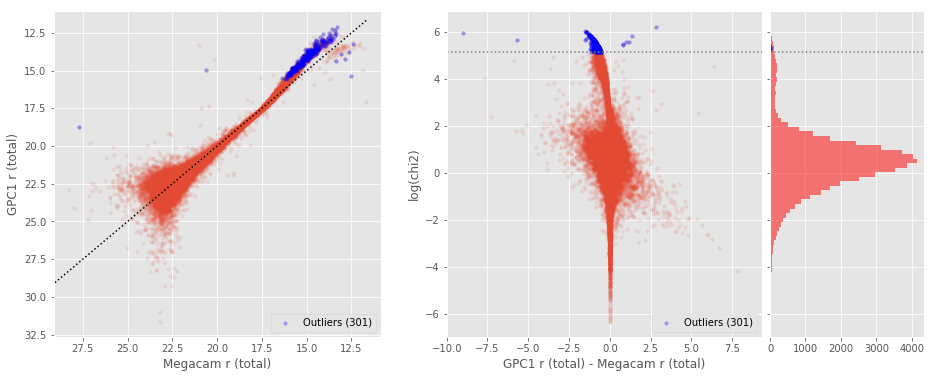

OmegaCAM r (aperture) - DECam r (aperture) (1457842 sources):
- Median: 0.23
- Median Absolute Deviation: 0.23
- 1% percentile: -2.2316493225097656
- 99% percentile: 1.205780868530276
Outliers separation: log(chi2) = 7.02
Number of outliers: 0



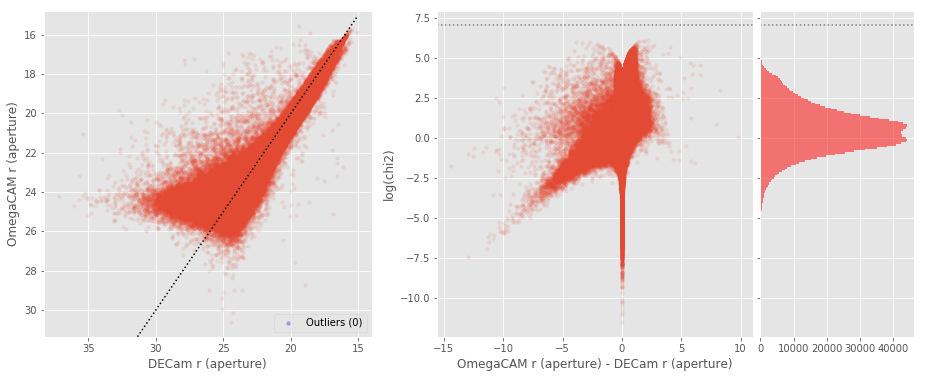

OmegaCAM r (total) - DECam r (total) (1497128 sources):
- Median: 0.17
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1699206924438477
- 99% percentile: 1.4385870552062974
Outliers separation: log(chi2) = 5.76
Number of outliers: 12



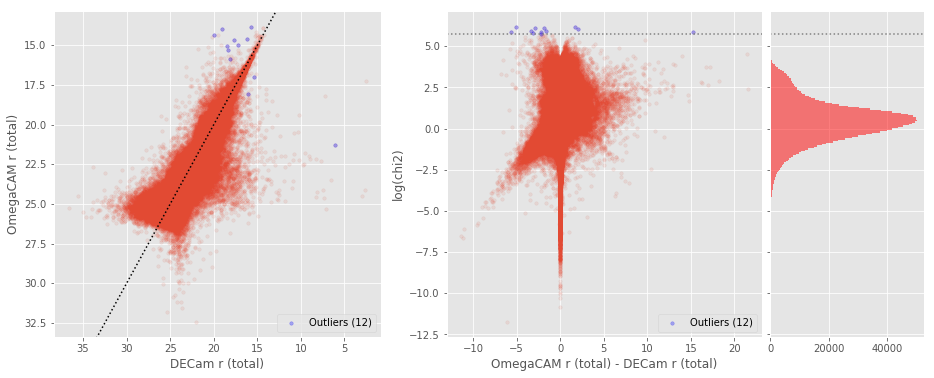

SUPRIME r (aperture) - DECam r (aperture) (584888 sources):
- Median: 0.17
- Median Absolute Deviation: 0.26
- 1% percentile: -2.6950467109680174
- 99% percentile: 1.7158669090270997
Outliers separation: log(chi2) = 6.94
Number of outliers: 0



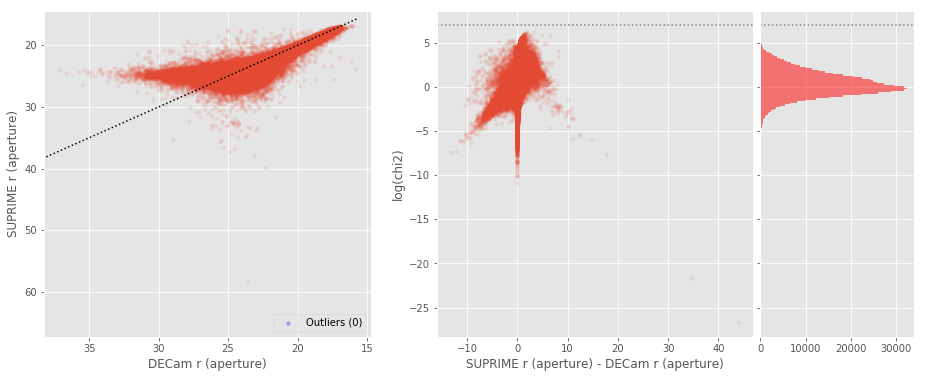

SUPRIME r (total) - DECam r (total) (601983 sources):
- Median: 0.03
- Median Absolute Deviation: 0.21
- 1% percentile: -2.182908477783203
- 99% percentile: 1.8177863693237384
Outliers separation: log(chi2) = 5.35
Number of outliers: 56



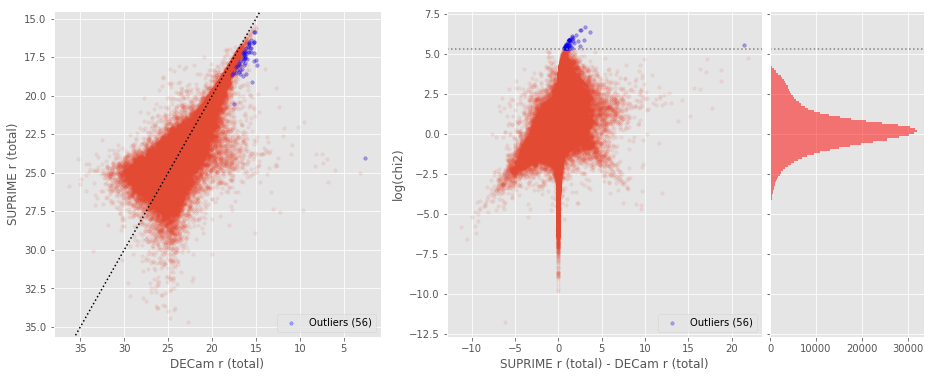

GPC1 r (aperture) - DECam r (aperture) (585022 sources):
- Median: 0.12
- Median Absolute Deviation: 0.17
- 1% percentile: -2.1173525619506837
- 99% percentile: 2.0416387939453173
Outliers separation: log(chi2) = 5.72
Number of outliers: 3672



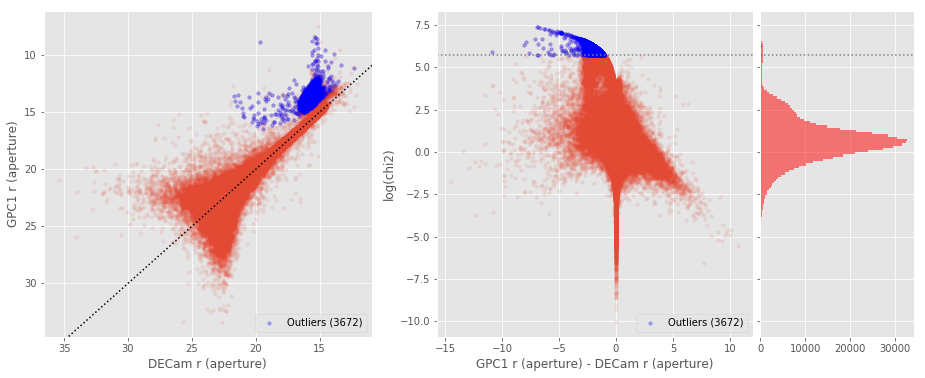

GPC1 r (total) - DECam r (total) (589181 sources):
- Median: 0.22
- Median Absolute Deviation: 0.14
- 1% percentile: -1.4197444915771484
- 99% percentile: 1.7647159576415996
Outliers separation: log(chi2) = 6.49
Number of outliers: 7



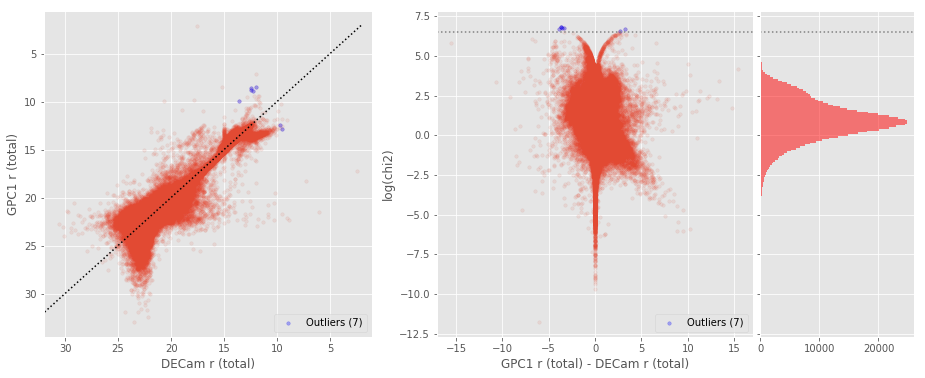

SUPRIME r (aperture) - OmegaCAM r (aperture) (864277 sources):
- Median: -0.03
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7951371002197265
- 99% percentile: 0.9210187530517571
Outliers separation: log(chi2) = 4.52
Number of outliers: 71



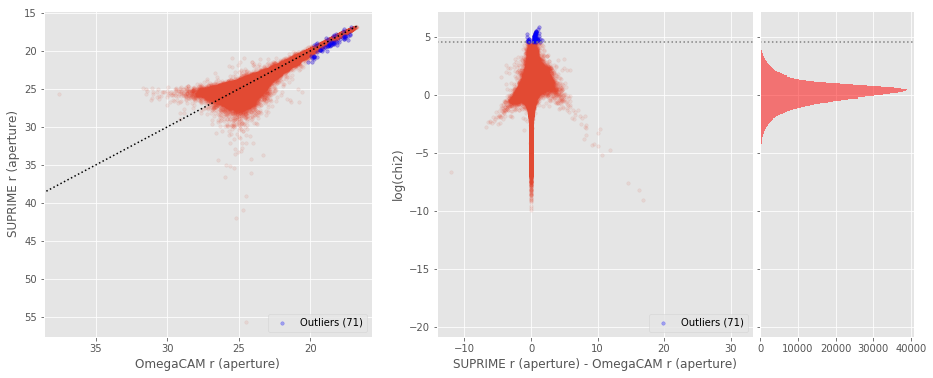

SUPRIME r (total) - OmegaCAM r (total) (839615 sources):
- Median: -0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6508621597290039
- 99% percentile: 1.349310722351073
Outliers separation: log(chi2) = 4.68
Number of outliers: 347



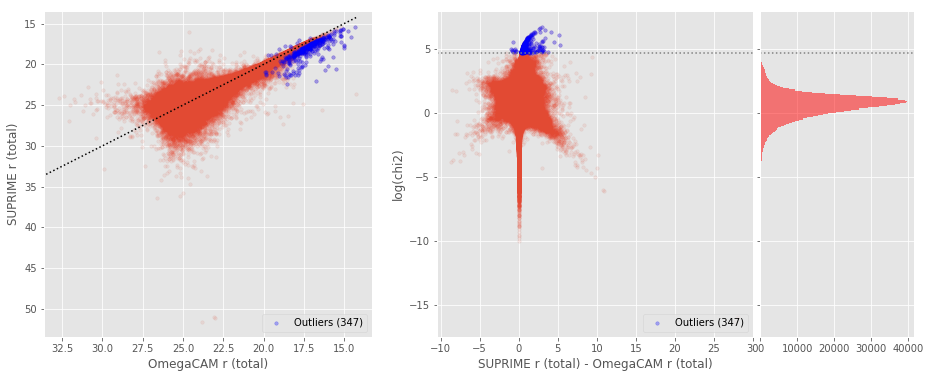

GPC1 r (aperture) - OmegaCAM r (aperture) (588059 sources):
- Median: -0.07
- Median Absolute Deviation: 0.23
- 1% percentile: -1.3889680480957032
- 99% percentile: 1.878293647766115
Outliers separation: log(chi2) = 5.97
Number of outliers: 0



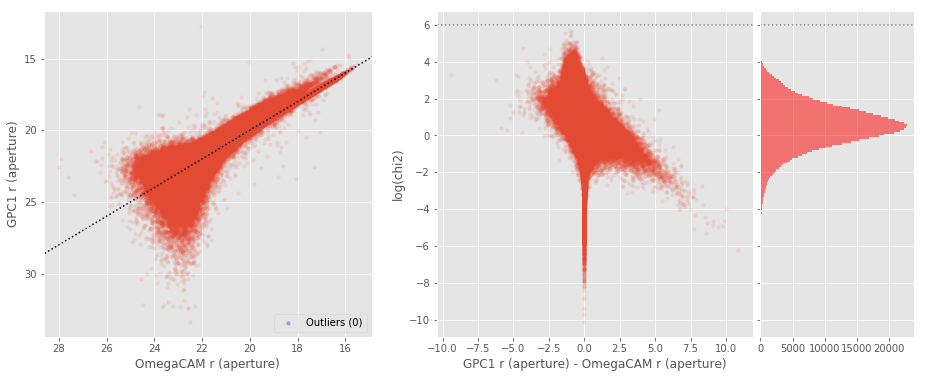

GPC1 r (total) - OmegaCAM r (total) (589655 sources):
- Median: 0.07
- Median Absolute Deviation: 0.12
- 1% percentile: -1.5568242645263672
- 99% percentile: 1.3730993652343635
Outliers separation: log(chi2) = 5.05
Number of outliers: 6



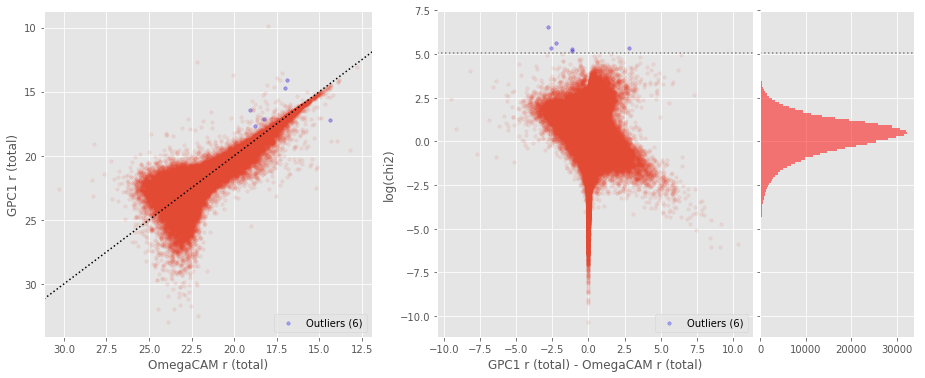

GPC1 r (aperture) - SUPRIME r (aperture) (186058 sources):
- Median: -0.06
- Median Absolute Deviation: 0.25
- 1% percentile: -1.6872344779968262
- 99% percentile: 1.9105348205566401
Outliers separation: log(chi2) = 6.14
Number of outliers: 0



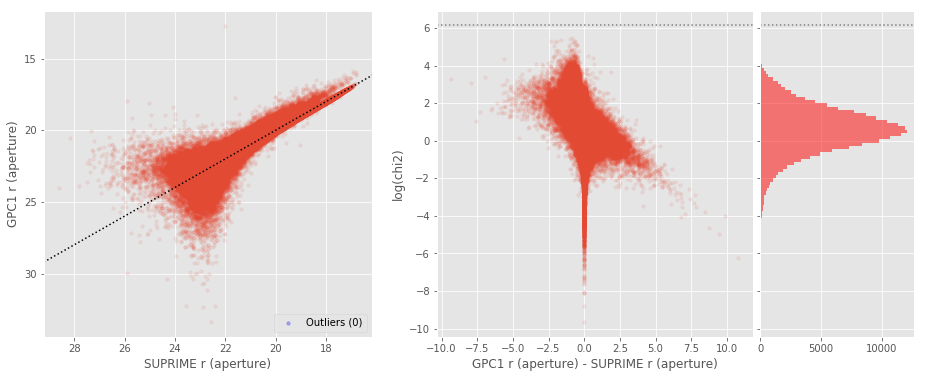

GPC1 r (total) - SUPRIME r (total) (186191 sources):
- Median: 0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -1.7849594116210936
- 99% percentile: 1.3600614547729502
Outliers separation: log(chi2) = 5.03
Number of outliers: 6



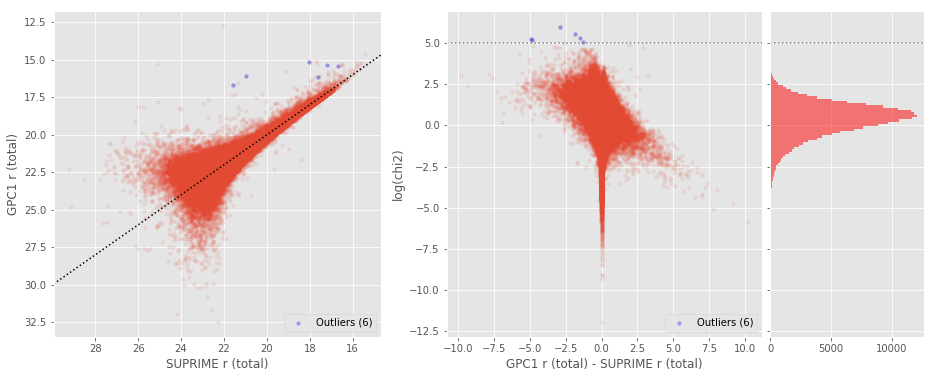

OmegaCAM i (aperture) - Megacam i (aperture) (158736 sources):
- Median: 0.08
- Median Absolute Deviation: 0.19
- 1% percentile: -1.3836599349975587
- 99% percentile: 1.9829711914062484
Outliers separation: log(chi2) = 4.91
Number of outliers: 453



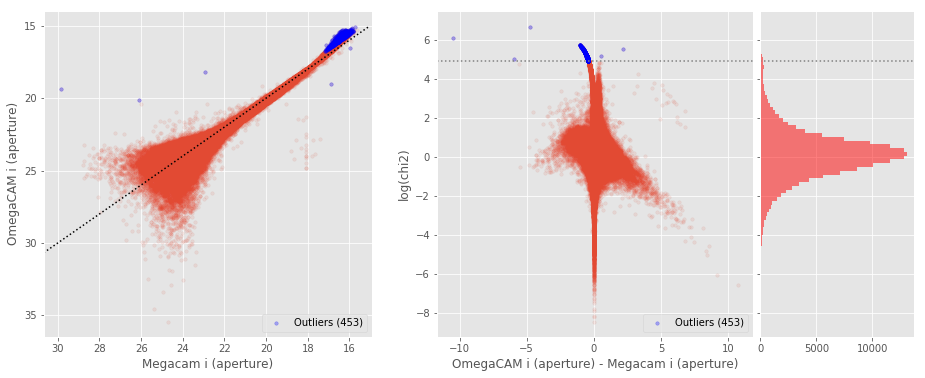

OmegaCAM i (total) - Megacam i (total) (161809 sources):
- Median: 0.18
- Median Absolute Deviation: 0.25
- 1% percentile: -1.239338150024414
- 99% percentile: 2.9382378387451173
Outliers separation: log(chi2) = 4.57
Number of outliers: 666



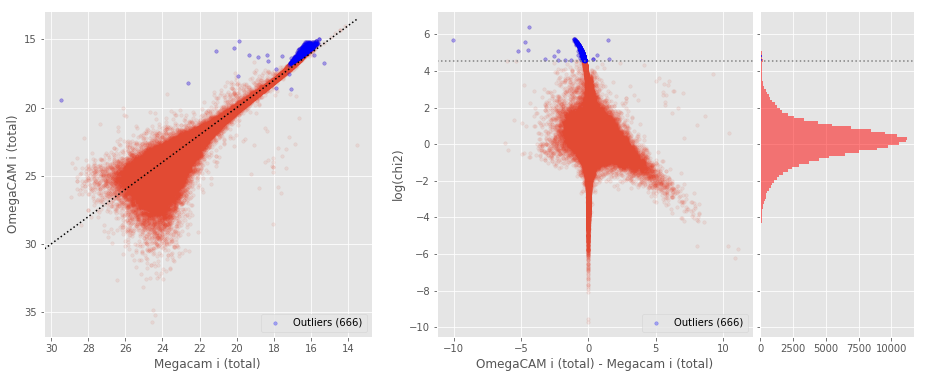

No sources have both Megacam i (aperture) and SUPRIME i (aperture) values.

No sources have both Megacam i (total) and SUPRIME i (total) values.

GPC1 i (aperture) - Megacam i (aperture) (48833 sources):
- Median: -0.03
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4989160919189453
- 99% percentile: 1.2364846038818378
Outliers separation: log(chi2) = 6.07
Number of outliers: 94



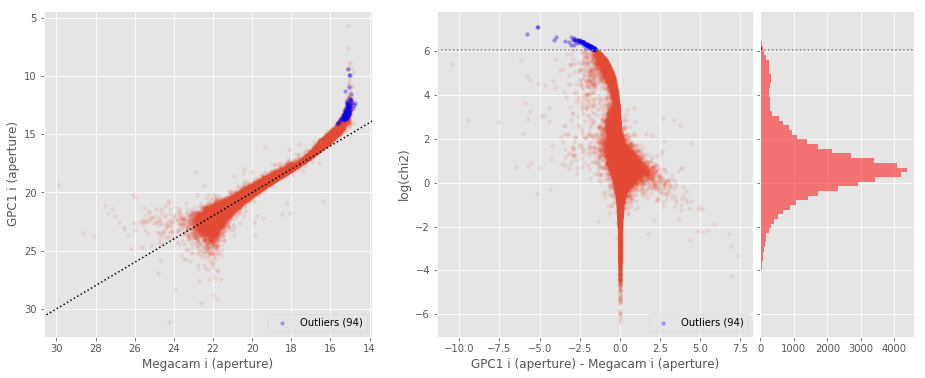

GPC1 i (total) - Megacam i (total) (48987 sources):
- Median: 0.13
- Median Absolute Deviation: 0.10
- 1% percentile: -1.0393377494812013
- 99% percentile: 0.8363279342651366
Outliers separation: log(chi2) = 5.05
Number of outliers: 430



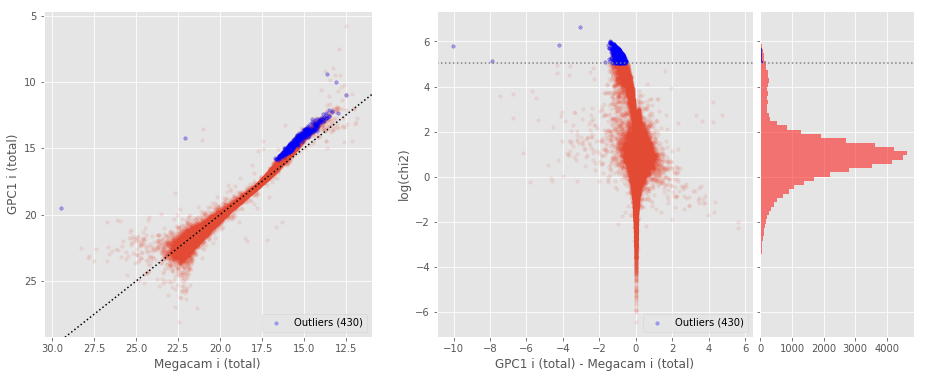

SUPRIME i (aperture) - OmegaCAM i (aperture) (777312 sources):
- Median: -0.08
- Median Absolute Deviation: 0.16
- 1% percentile: -1.9025225448608396
- 99% percentile: 1.14066282272339
Outliers separation: log(chi2) = 4.63
Number of outliers: 1341



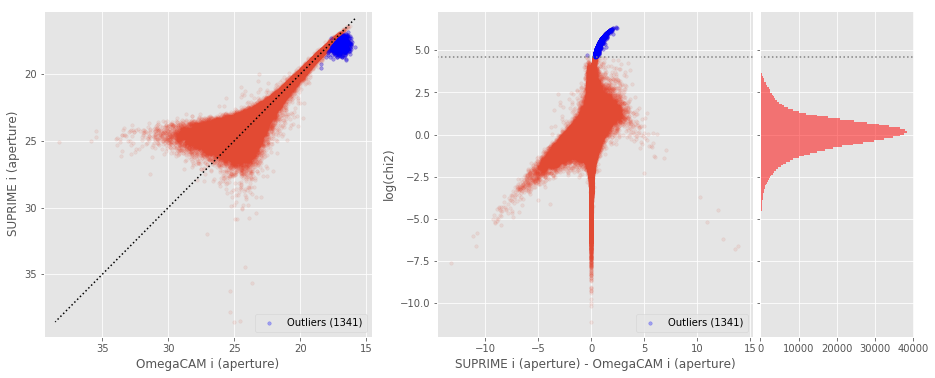

SUPRIME i (total) - OmegaCAM i (total) (758090 sources):
- Median: -0.26
- Median Absolute Deviation: 0.26
- 1% percentile: -2.996978244781494
- 99% percentile: 1.471901569366455
Outliers separation: log(chi2) = 4.79
Number of outliers: 828



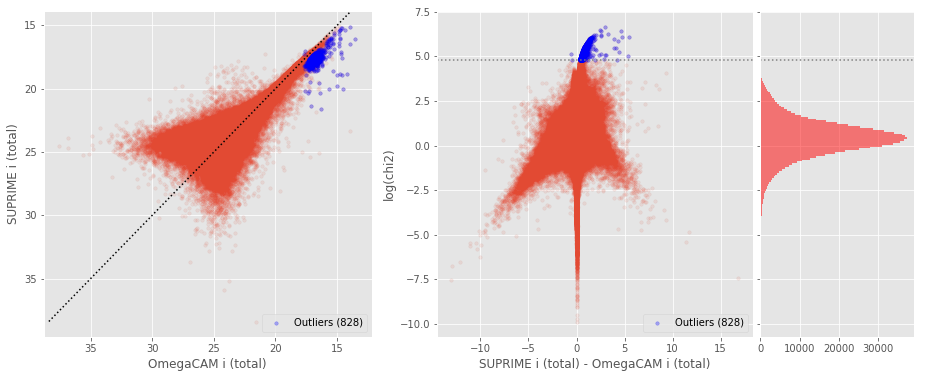

GPC1 i (aperture) - OmegaCAM i (aperture) (607995 sources):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.009663314819336
- 99% percentile: 1.162247161865234
Outliers separation: log(chi2) = 5.87
Number of outliers: 1



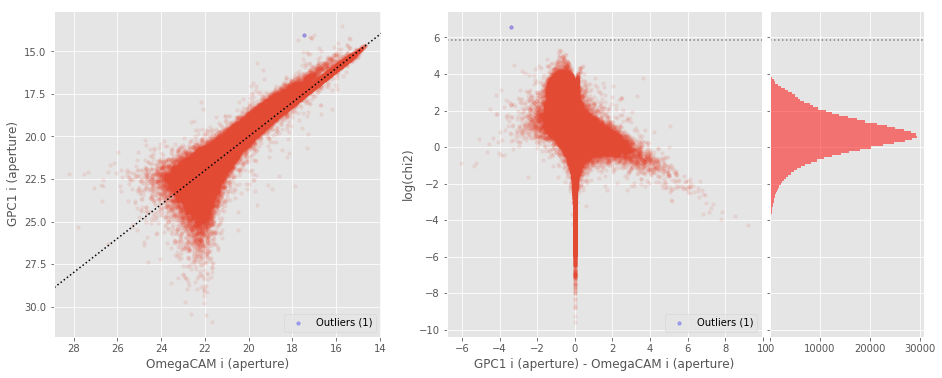

GPC1 i (total) - OmegaCAM i (total) (608557 sources):
- Median: 0.07
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8066690063476563
- 99% percentile: 0.8724625396728509
Outliers separation: log(chi2) = 5.07
Number of outliers: 13



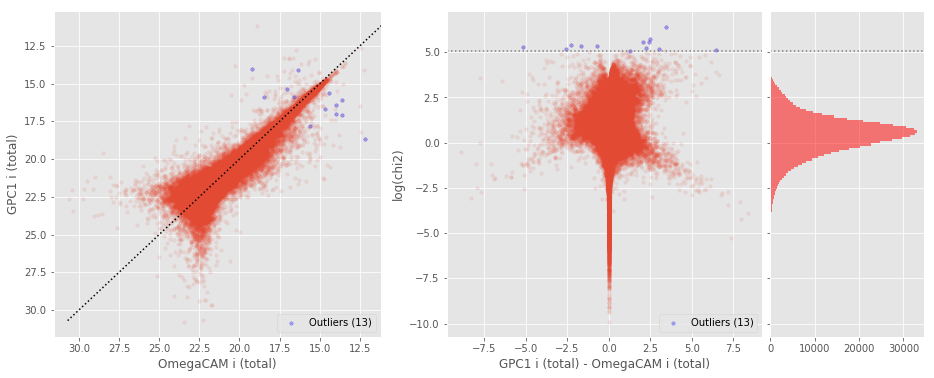

GPC1 i (aperture) - SUPRIME i (aperture) (189348 sources):
- Median: 0.01
- Median Absolute Deviation: 0.20
- 1% percentile: -1.1491367530822754
- 99% percentile: 1.263934803009033
Outliers separation: log(chi2) = 6.03
Number of outliers: 1



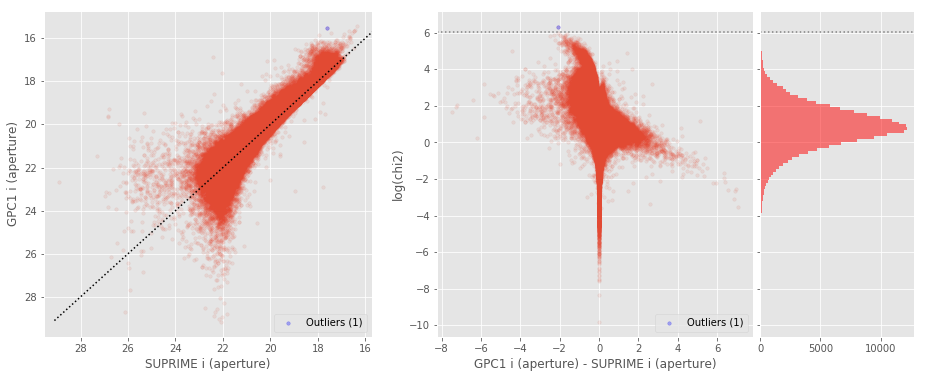

GPC1 i (total) - SUPRIME i (total) (189148 sources):
- Median: 0.22
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8407403564453124
- 99% percentile: 0.9326608848571776
Outliers separation: log(chi2) = 5.02
Number of outliers: 71



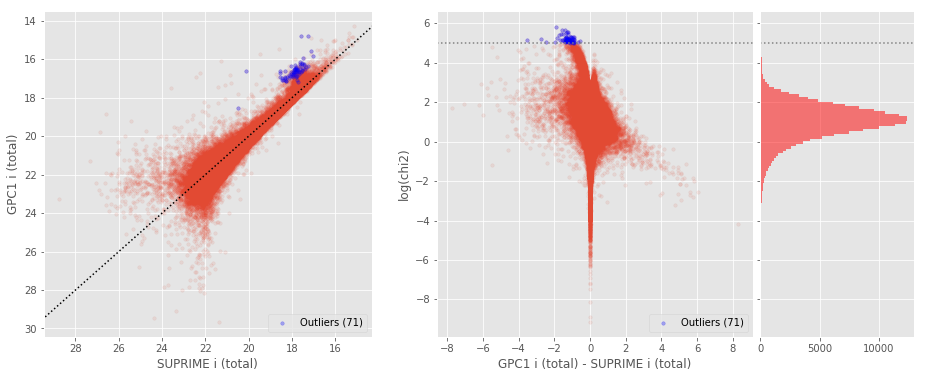

DECam z (aperture) - Megacam z (aperture) (156748 sources):
- Median: -0.25
- Median Absolute Deviation: 0.19
- 1% percentile: -1.6457503318786622
- 99% percentile: 2.2158865737915026
Outliers separation: log(chi2) = 7.49
Number of outliers: 0



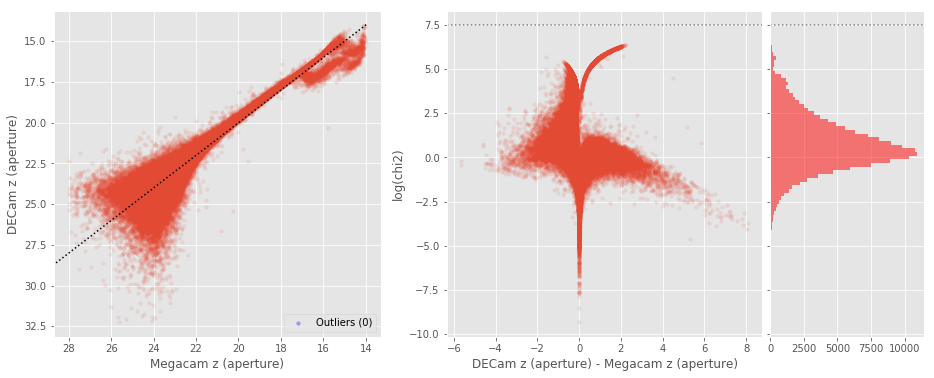

DECam z (total) - Megacam z (total) (161563 sources):
- Median: -0.19
- Median Absolute Deviation: 0.17
- 1% percentile: -2.06123348236084
- 99% percentile: 1.1107024002075196
Outliers separation: log(chi2) = 6.55
Number of outliers: 0



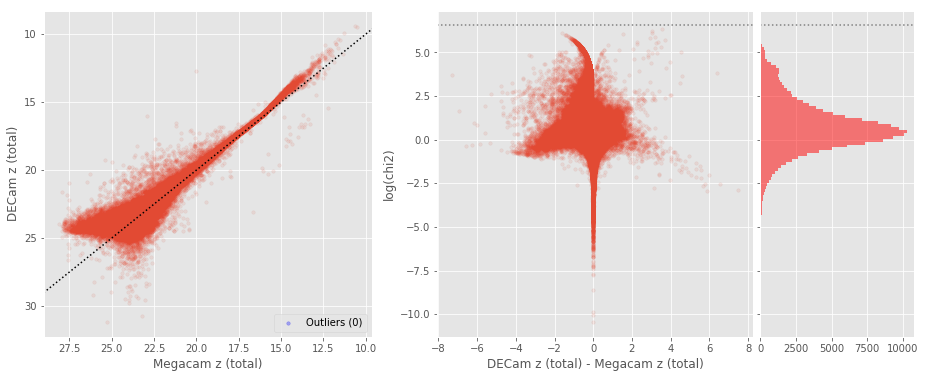

No sources have both Megacam z (aperture) and SUPRIME z (aperture) values.

No sources have both Megacam z (total) and SUPRIME z (total) values.

GPC1 z (aperture) - Megacam z (aperture) (48663 sources):
- Median: -0.11
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2294121551513673
- 99% percentile: 1.2343894195556628
Outliers separation: log(chi2) = 6.53
Number of outliers: 14



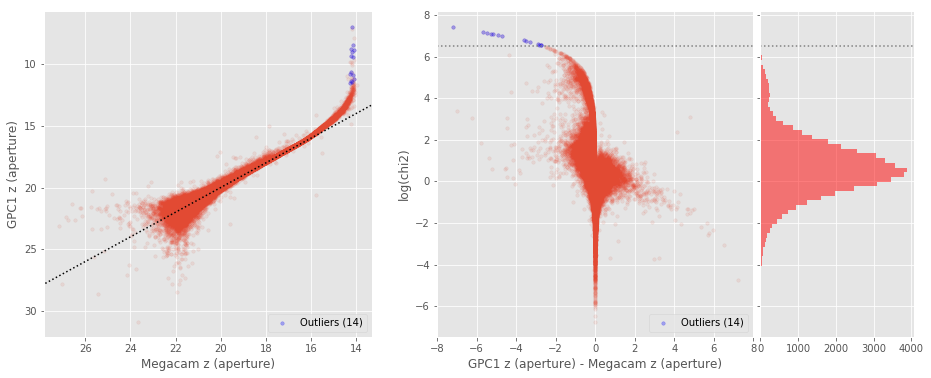

GPC1 z (total) - Megacam z (total) (48731 sources):
- Median: 0.06
- Median Absolute Deviation: 0.11
- 1% percentile: -1.0529401779174805
- 99% percentile: 0.8884191513061507
Outliers separation: log(chi2) = 4.79
Number of outliers: 147



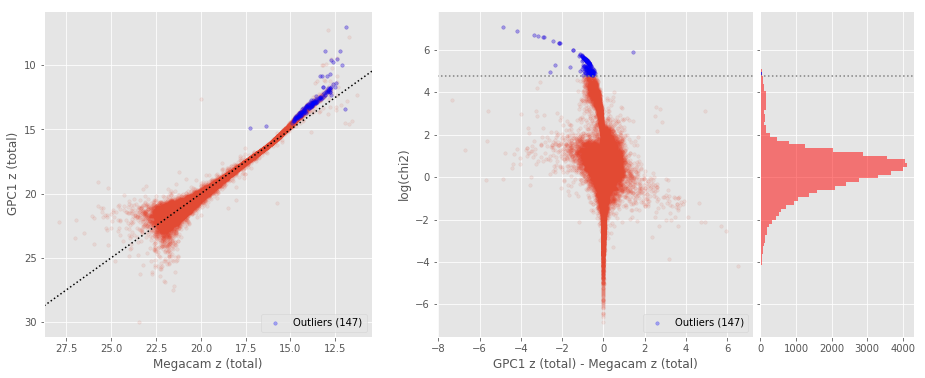

VISTA Z (aperture) - Megacam z (aperture) (77578 sources):
- Median: -0.07
- Median Absolute Deviation: 0.11
- 1% percentile: -1.0627245140075683
- 99% percentile: 0.5014590644836423
Outliers separation: log(chi2) = 5.97
Number of outliers: 2



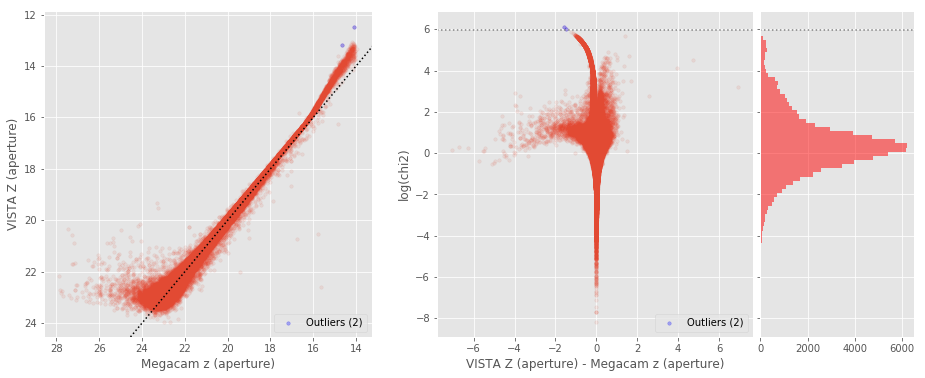

VISTA Z (total) - Megacam z (total) (77805 sources):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -1.5758645629882813
- 99% percentile: 1.2600578308105579
Outliers separation: log(chi2) = 5.33
Number of outliers: 146



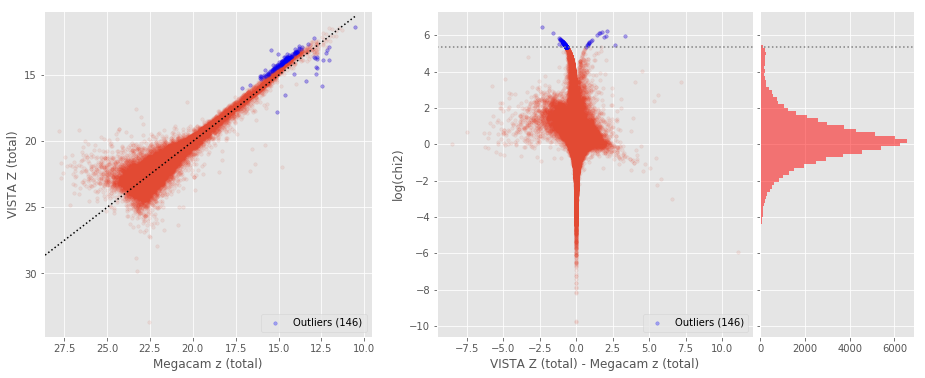

SUPRIME z (aperture) - DECam z (aperture) (628830 sources):
- Median: 0.10
- Median Absolute Deviation: 0.24
- 1% percentile: -2.5712469291687015
- 99% percentile: 1.2975270080566403
Outliers separation: log(chi2) = 6.47
Number of outliers: 0



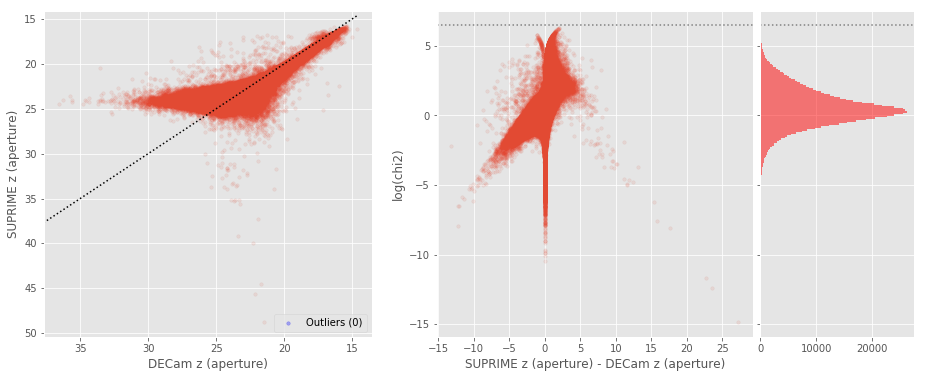

SUPRIME z (total) - DECam z (total) (632782 sources):
- Median: 0.00
- Median Absolute Deviation: 0.16
- 1% percentile: -1.2578619003295899
- 99% percentile: 1.7157085609435994
Outliers separation: log(chi2) = 5.57
Number of outliers: 188



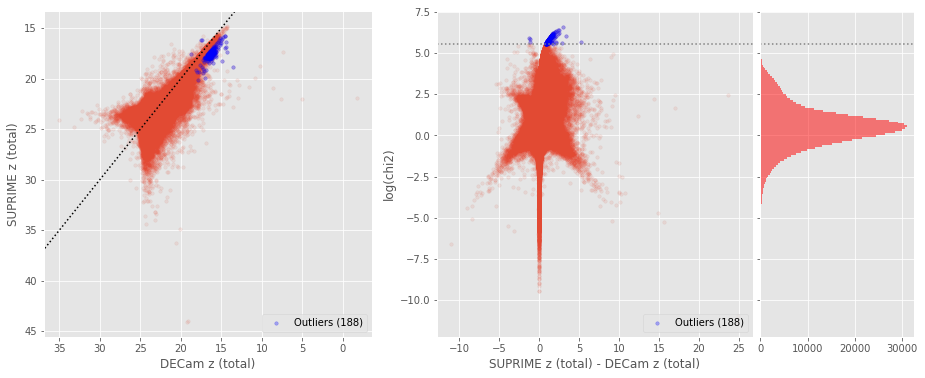

GPC1 z (aperture) - DECam z (aperture) (622290 sources):
- Median: 0.17
- Median Absolute Deviation: 0.12
- 1% percentile: -2.4245209884643555
- 99% percentile: 1.3799658393859857
Outliers separation: log(chi2) = 5.89
Number of outliers: 4276



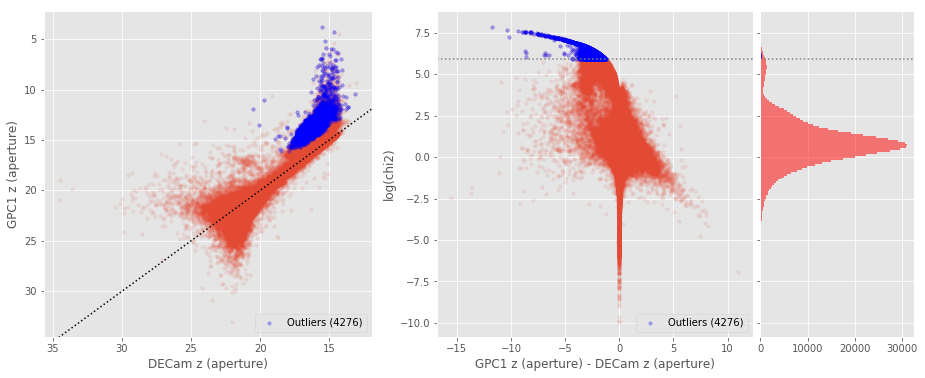

GPC1 z (total) - DECam z (total) (622856 sources):
- Median: 0.28
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8378459930419921
- 99% percentile: 1.3390662193298195
Outliers separation: log(chi2) = 6.45
Number of outliers: 53



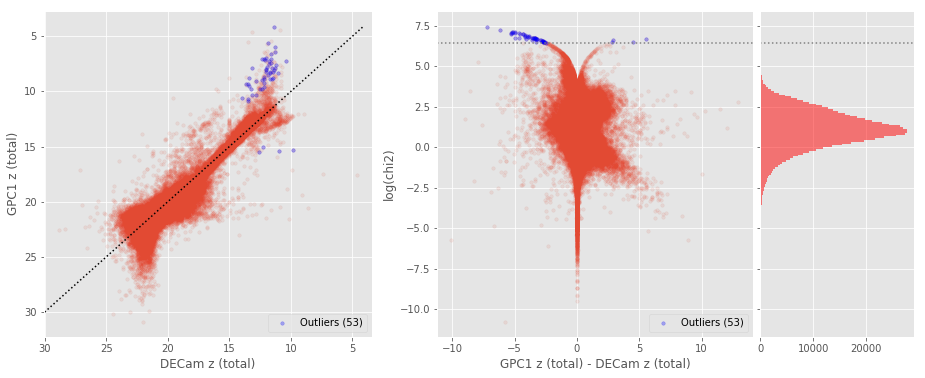

VISTA Z (aperture) - DECam z (aperture) (813686 sources):
- Median: 0.21
- Median Absolute Deviation: 0.17
- 1% percentile: -1.9213523864746094
- 99% percentile: 0.9232542991638184
Outliers separation: log(chi2) = 6.79
Number of outliers: 4



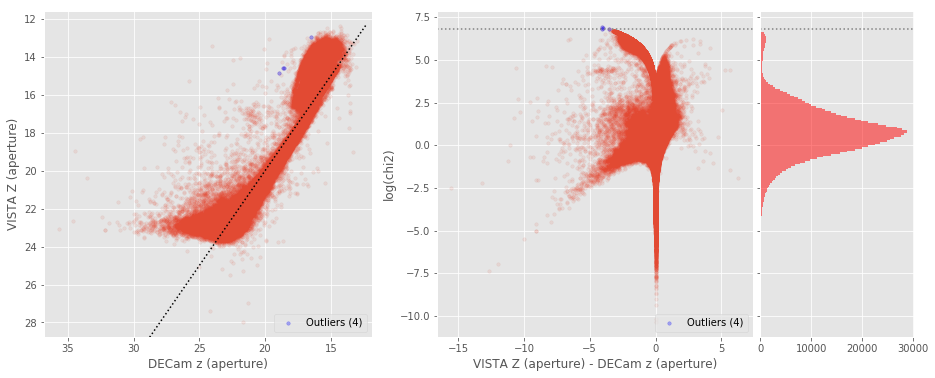

VISTA Z (total) - DECam z (total) (817476 sources):
- Median: 0.14
- Median Absolute Deviation: 0.19
- 1% percentile: -1.1419644355773926
- 99% percentile: 1.6422967910766602
Outliers separation: log(chi2) = 5.05
Number of outliers: 1852



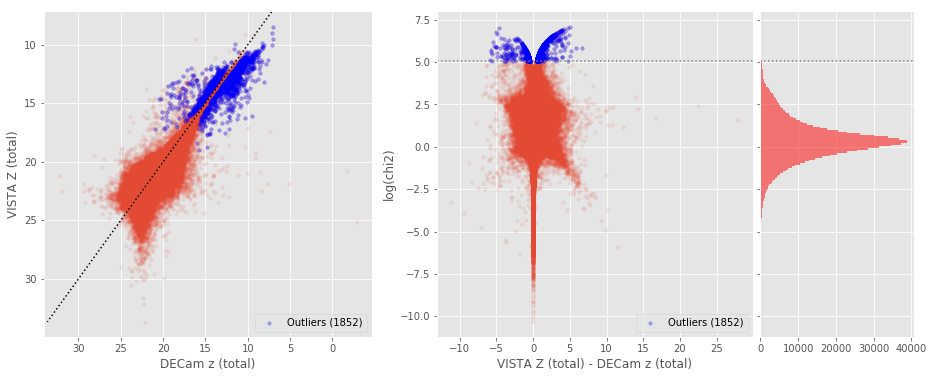

GPC1 z (aperture) - SUPRIME z (aperture) (188888 sources):
- Median: 0.01
- Median Absolute Deviation: 0.19
- 1% percentile: -1.130504264831543
- 99% percentile: 1.3021692657470707
Outliers separation: log(chi2) = 5.70
Number of outliers: 4



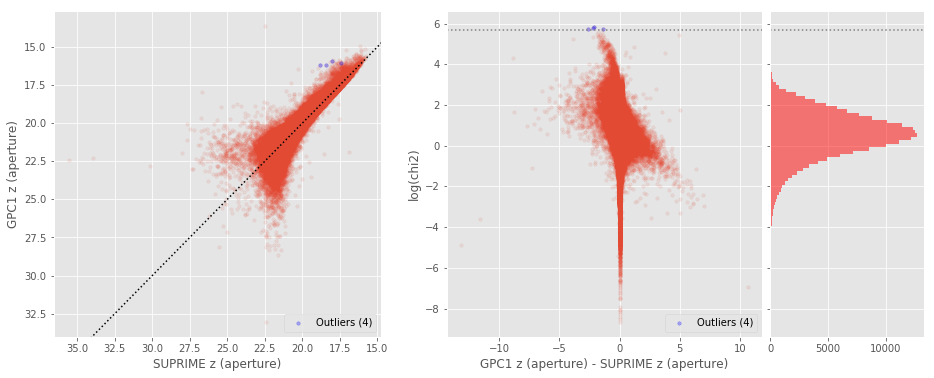

GPC1 z (total) - SUPRIME z (total) (188466 sources):
- Median: 0.22
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9405445098876952
- 99% percentile: 1.02163782119751
Outliers separation: log(chi2) = 5.16
Number of outliers: 6



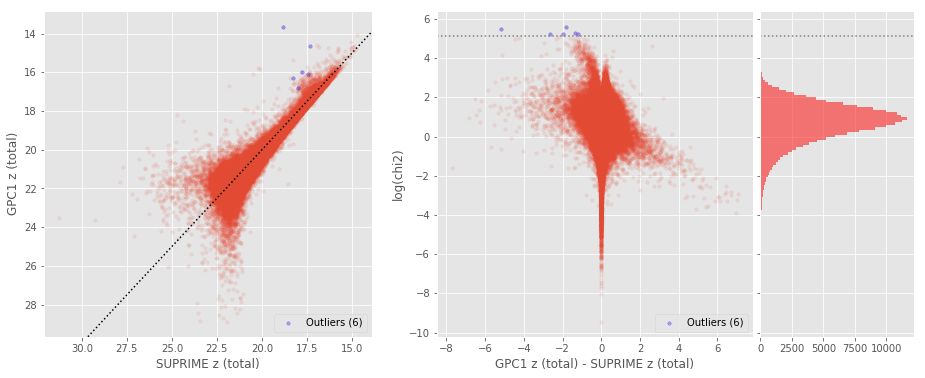

VISTA Z (aperture) - SUPRIME z (aperture) (306309 sources):
- Median: 0.05
- Median Absolute Deviation: 0.09
- 1% percentile: -1.8200199890136721
- 99% percentile: 0.5142575073242176
Outliers separation: log(chi2) = 4.85
Number of outliers: 144



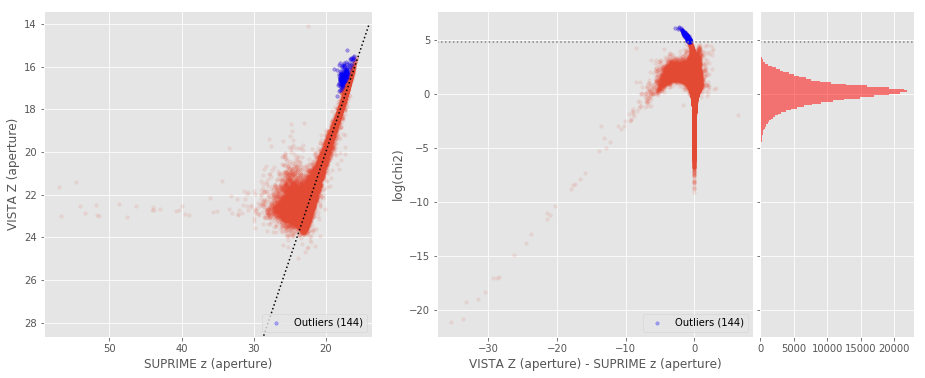

VISTA Z (total) - SUPRIME z (total) (303632 sources):
- Median: 0.10
- Median Absolute Deviation: 0.20
- 1% percentile: -2.0666374015808104
- 99% percentile: 1.471244716644288
Outliers separation: log(chi2) = 4.21
Number of outliers: 504



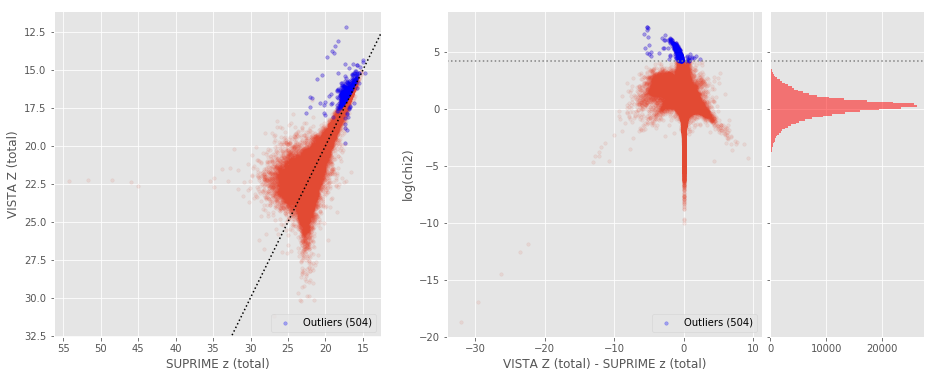

VISTA Z (aperture) - GPC1 z (aperture) (458162 sources):
- Median: 0.00
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1948314666748048
- 99% percentile: 1.015518684387208
Outliers separation: log(chi2) = 5.70
Number of outliers: 349



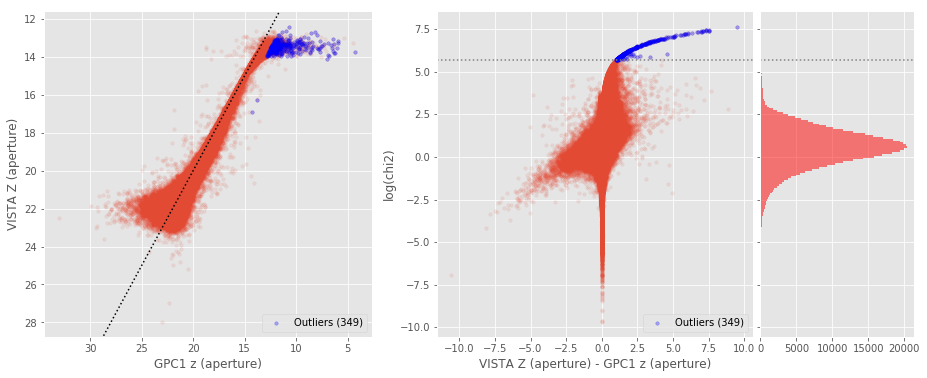

VISTA Z (total) - GPC1 z (total) (458002 sources):
- Median: -0.15
- Median Absolute Deviation: 0.14
- 1% percentile: -1.1476056098937988
- 99% percentile: 1.3034868240356436
Outliers separation: log(chi2) = 5.85
Number of outliers: 153



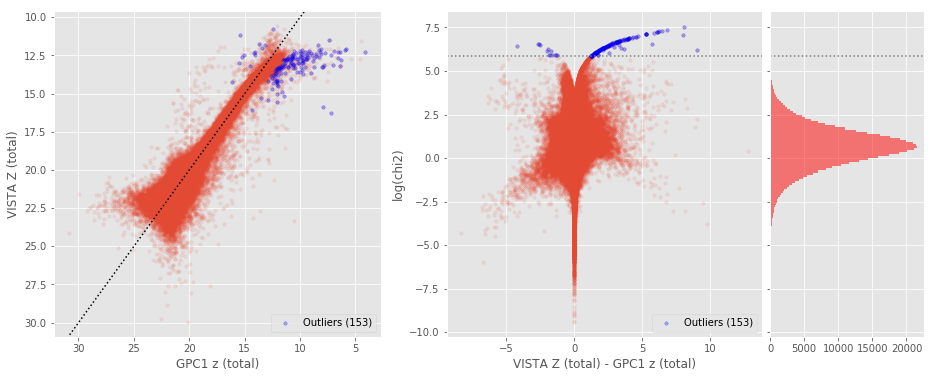

GPC1 y (aperture) - SUPRIME y (aperture) (186287 sources):
- Median: -0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -1.8586738586425782
- 99% percentile: 1.7942556381225572
Outliers separation: log(chi2) = 5.43
Number of outliers: 5



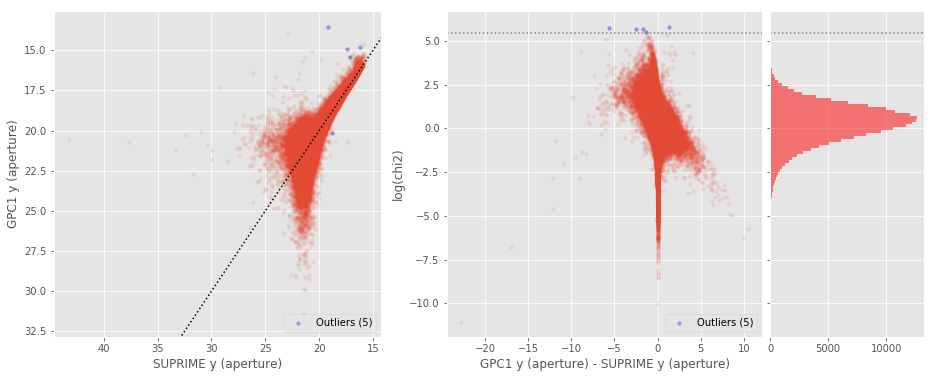

GPC1 y (total) - SUPRIME y (total) (182003 sources):
- Median: 0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -2.012005500793457
- 99% percentile: 1.8762794876098645
Outliers separation: log(chi2) = 5.58
Number of outliers: 2



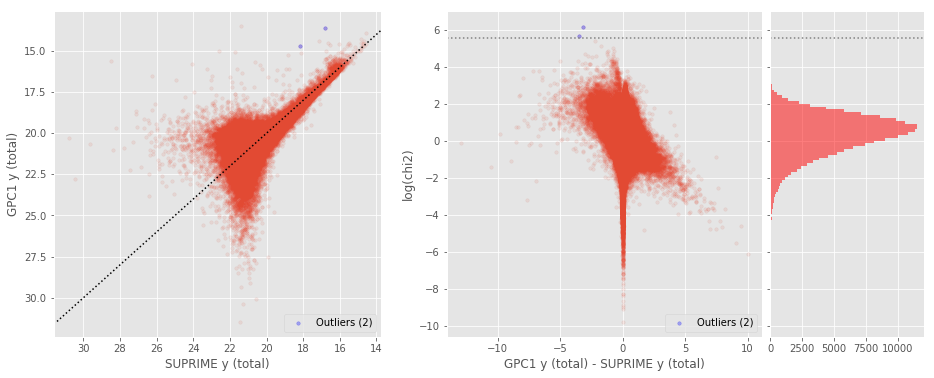

VISTA Y (aperture) - SUPRIME y (aperture) (157099 sources):
- Median: -0.07
- Median Absolute Deviation: 0.07
- 1% percentile: -1.7757165908813477
- 99% percentile: 0.36070468902587877
Outliers separation: log(chi2) = 4.94
Number of outliers: 44



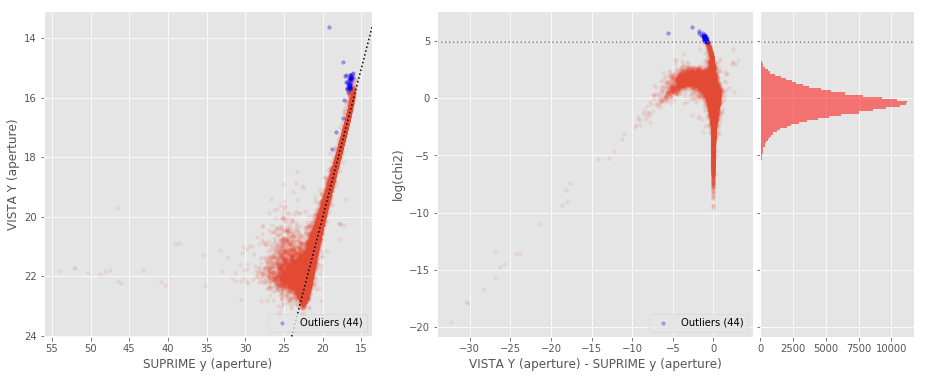

VISTA Y (total) - SUPRIME y (total) (156078 sources):
- Median: -0.02
- Median Absolute Deviation: 0.17
- 1% percentile: -1.8766998481750488
- 99% percentile: 1.2009667396545414
Outliers separation: log(chi2) = 4.44
Number of outliers: 109



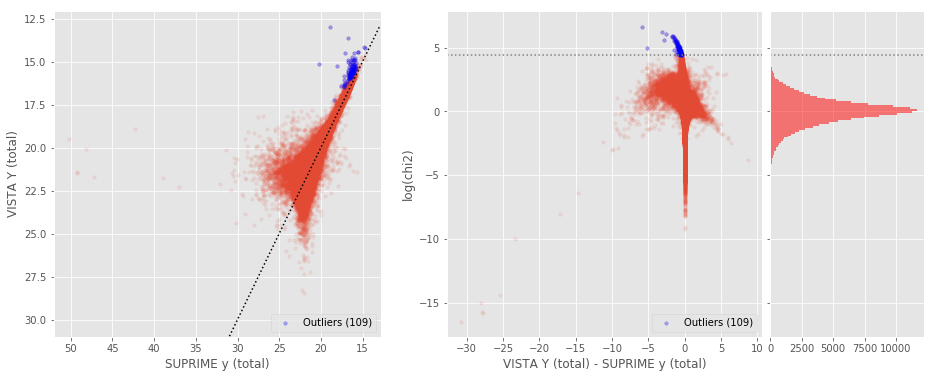

UKIDSS Y (aperture) - SUPRIME y (aperture) (117361 sources):
- Median: 0.03
- Median Absolute Deviation: 0.08
- 1% percentile: -1.8560207366943358
- 99% percentile: 0.4689327239990232
Outliers separation: log(chi2) = 4.35
Number of outliers: 88



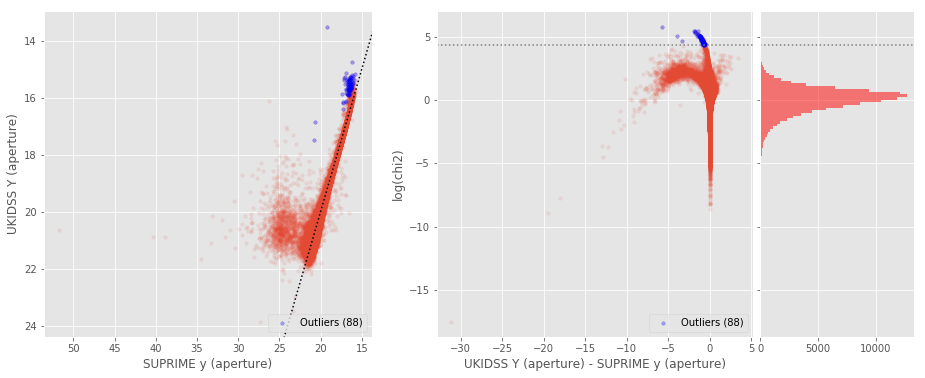

UKIDSS Y (total) - SUPRIME y (total) (116961 sources):
- Median: 0.09
- Median Absolute Deviation: 0.13
- 1% percentile: -1.6178241729736322
- 99% percentile: 1.1513740539550779
Outliers separation: log(chi2) = 4.51
Number of outliers: 50



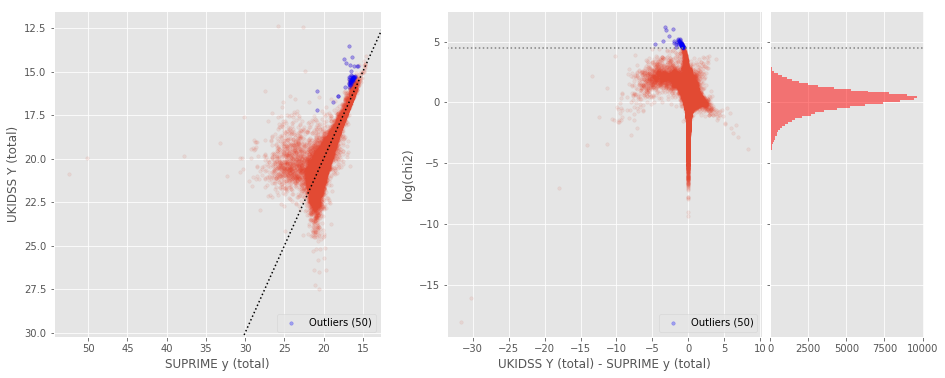

VISTA Y (aperture) - GPC1 y (aperture) (398263 sources):
- Median: 0.00
- Median Absolute Deviation: 0.22
- 1% percentile: -1.7570660781860352
- 99% percentile: 1.5551343536376954
Outliers separation: log(chi2) = 5.25
Number of outliers: 216



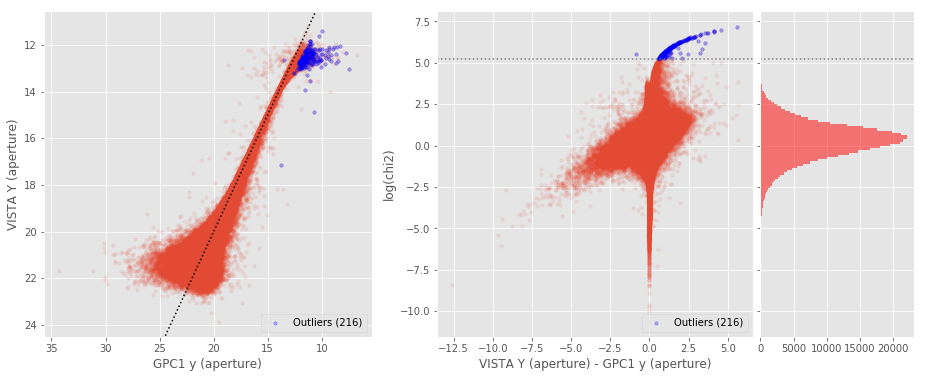

VISTA Y (total) - GPC1 y (total) (391903 sources):
- Median: -0.17
- Median Absolute Deviation: 0.21
- 1% percentile: -1.7533990859985353
- 99% percentile: 2.055547027587888
Outliers separation: log(chi2) = 5.98
Number of outliers: 52



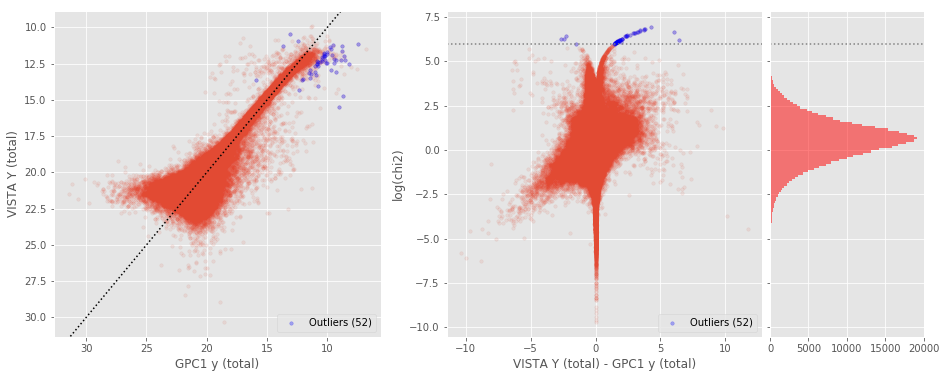

UKIDSS Y (aperture) - GPC1 y (aperture) (370625 sources):
- Median: 0.04
- Median Absolute Deviation: 0.16
- 1% percentile: -1.2504541778564453
- 99% percentile: 1.1787864685058613
Outliers separation: log(chi2) = 5.12
Number of outliers: 154



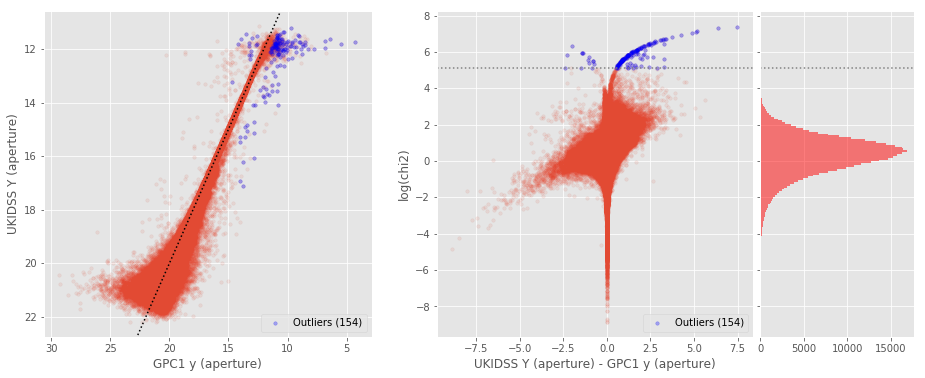

UKIDSS Y (total) - GPC1 y (total) (368973 sources):
- Median: -0.08
- Median Absolute Deviation: 0.14
- 1% percentile: -1.216707534790039
- 99% percentile: 1.4661273193359283
Outliers separation: log(chi2) = 5.02
Number of outliers: 153



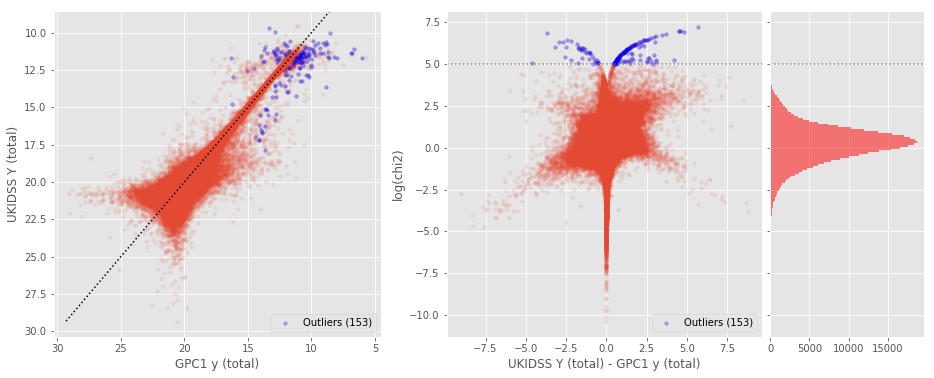

UKIDSS Y (aperture) - VISTA Y (aperture) (219012 sources):
- Median: 0.09
- Median Absolute Deviation: 0.06
- 1% percentile: -0.5013003158569336
- 99% percentile: 0.5786559486389151
Outliers separation: log(chi2) = 5.24
Number of outliers: 467



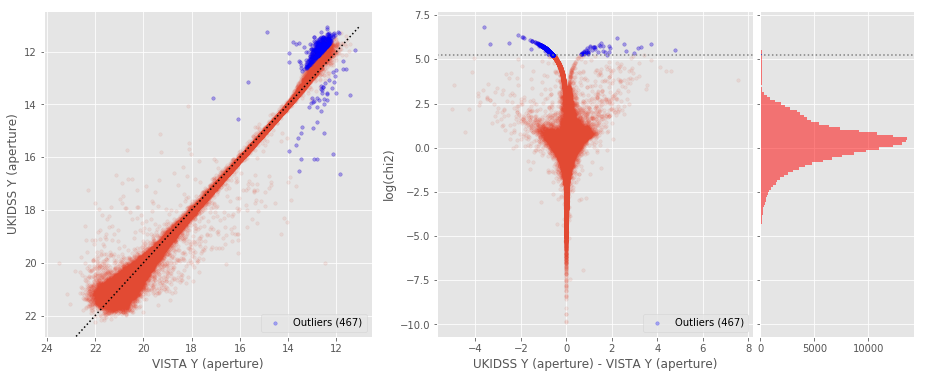

UKIDSS Y (total) - VISTA Y (total) (218842 sources):
- Median: 0.12
- Median Absolute Deviation: 0.13
- 1% percentile: -1.0493769836425781
- 99% percentile: 1.272962188720703
Outliers separation: log(chi2) = 5.62
Number of outliers: 208



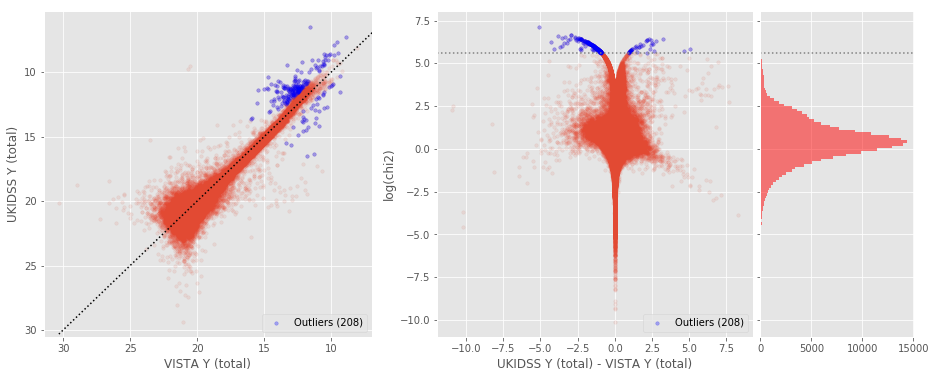

In [9]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "decam_r" and basecol2 == "gpc1_r":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))
        
plt.close() 
plt.close()
plt.close()
plt.close() 
plt.close()
plt.close()
plt.close() 
plt.close()
plt.close()

## 4/ Aperture correction issues

In [42]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

OmegaCAM u (aperture) - Megacam u (aperture):


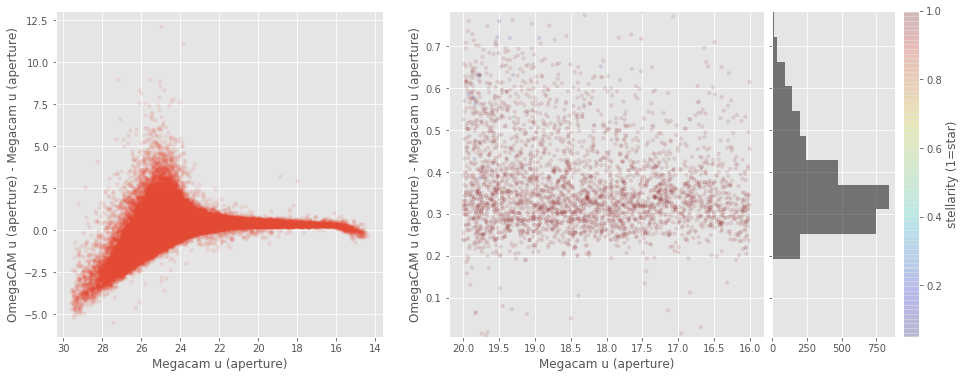

GPC1 g (aperture) - DECam g (aperture):


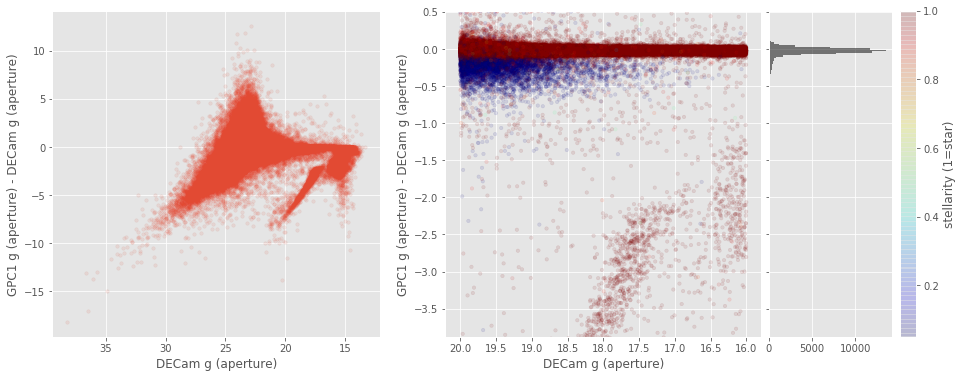

Megacam g (aperture) - DECam g (aperture):


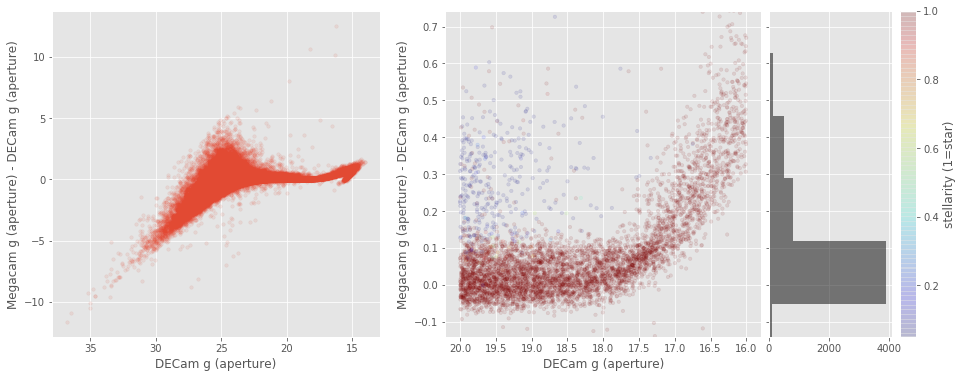

OmegaCAM g (aperture) - DECam g (aperture):


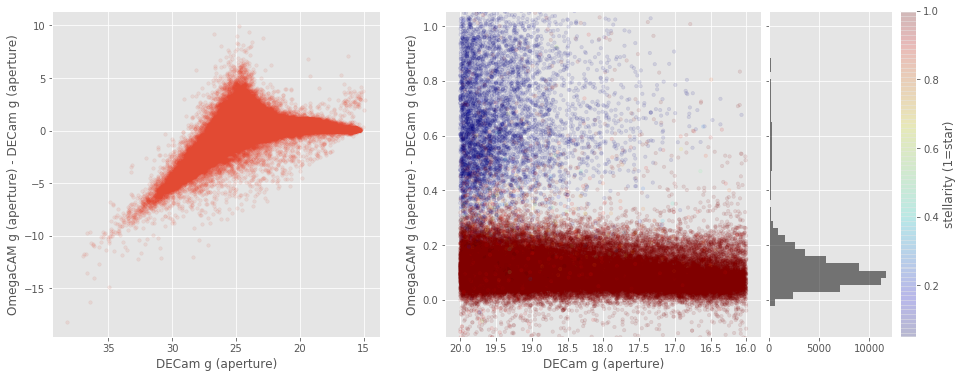

SUPRIME g (aperture) - DECam g (aperture):


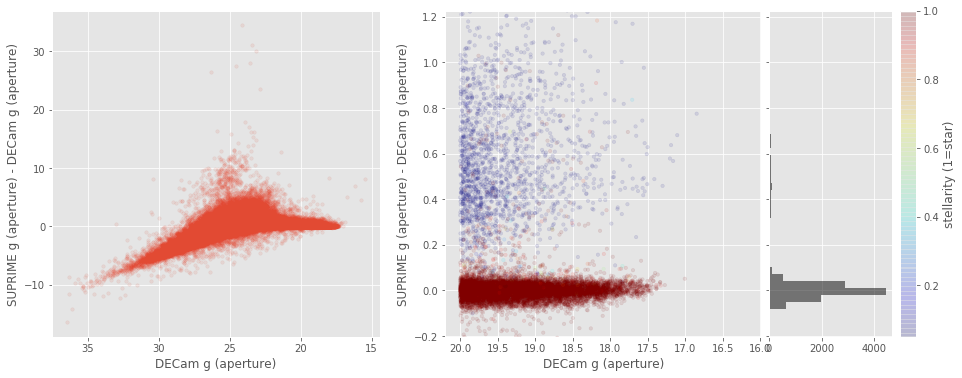

Megacam g (aperture) - GPC1 g (aperture):


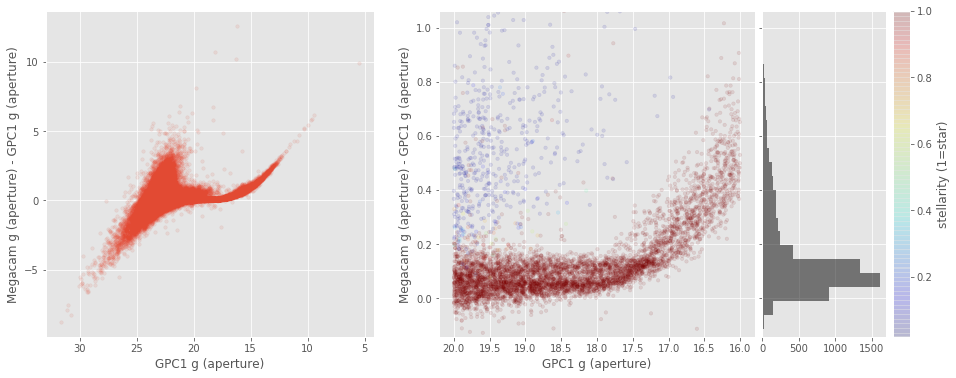

OmegaCAM g (aperture) - GPC1 g (aperture):


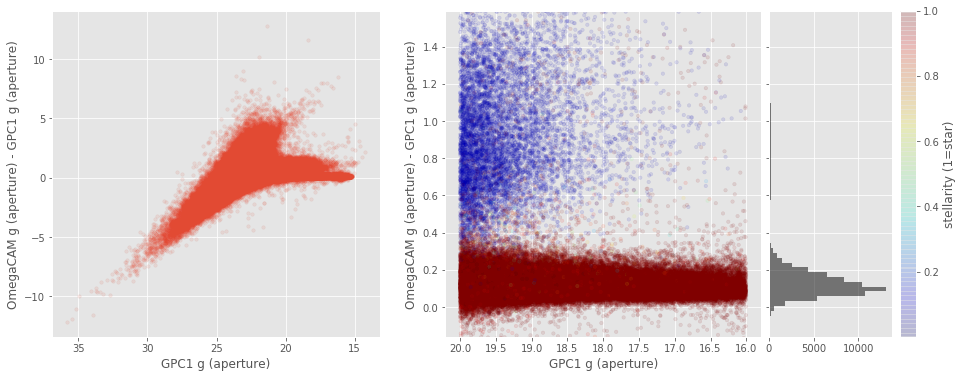

SUPRIME g (aperture) - GPC1 g (aperture):


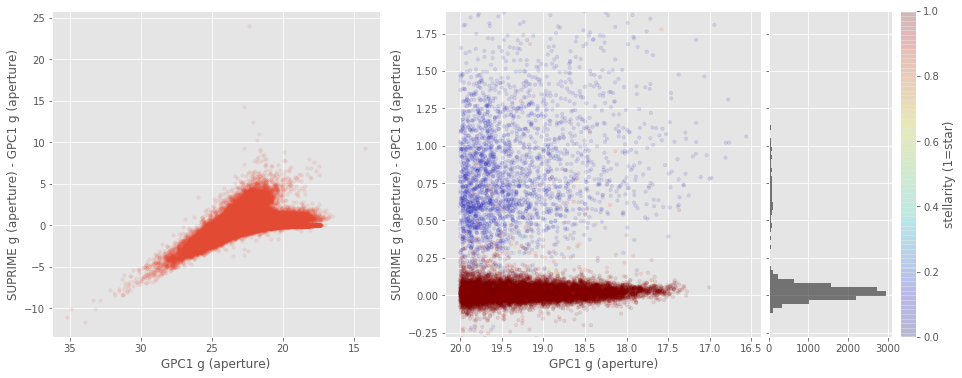

OmegaCAM g (aperture) - Megacam g (aperture):


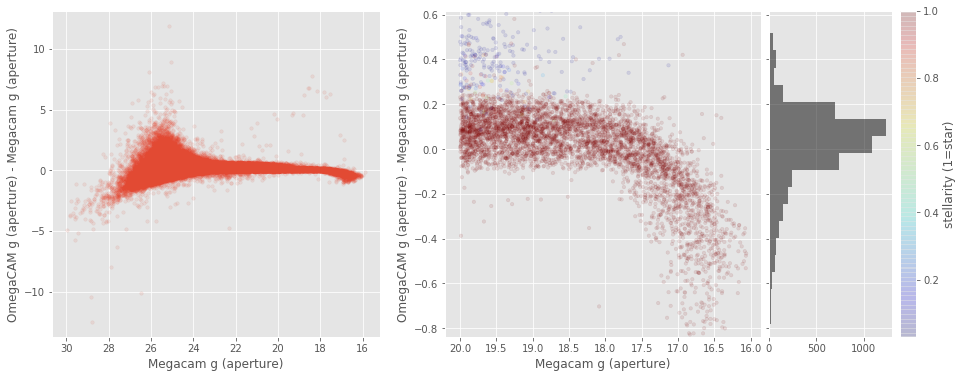

No sources have both Megacam g (aperture) and SUPRIME g (aperture) values.

SUPRIME g (aperture) - OmegaCAM g (aperture):


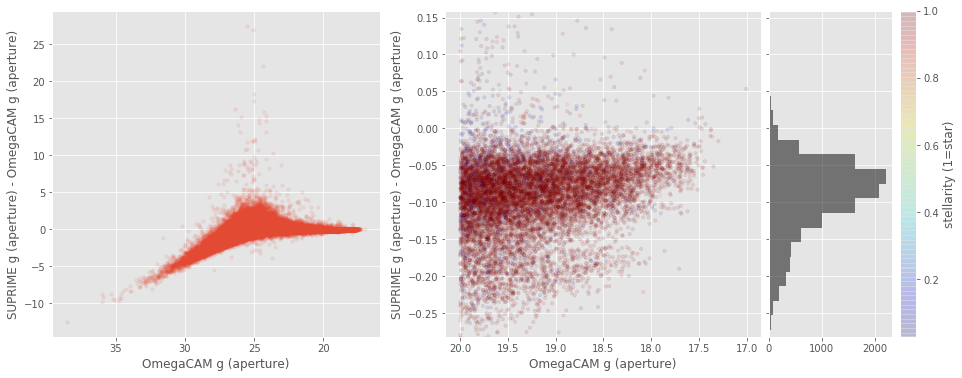

GPC1 r (aperture) - DECam r (aperture):


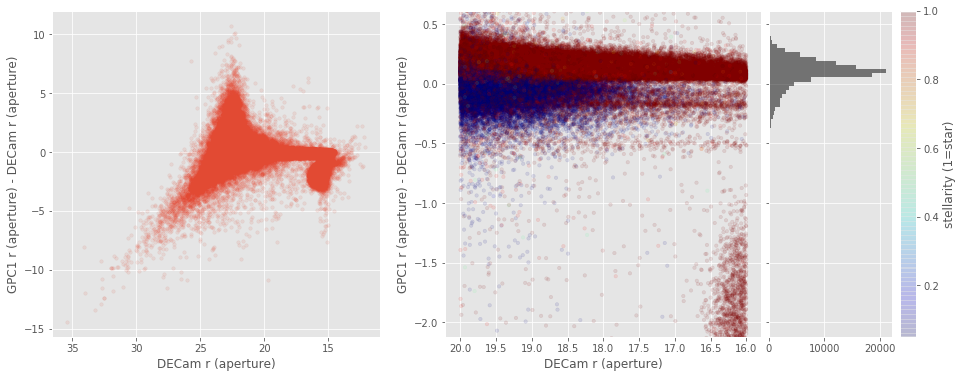

Megacam r (aperture) - DECam r (aperture):


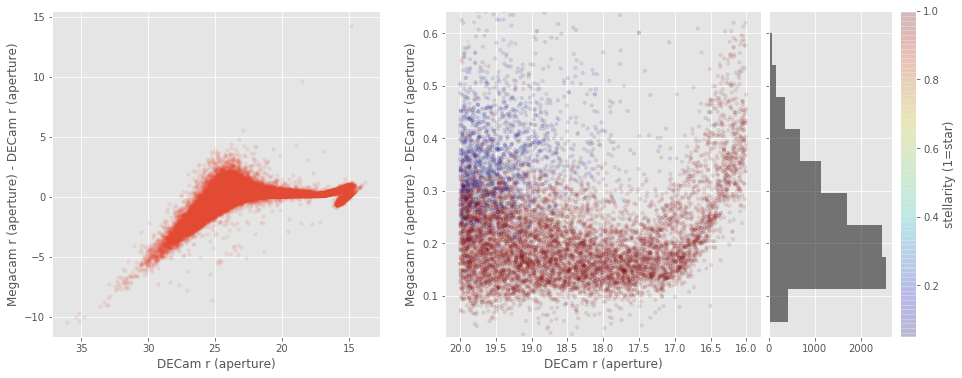

OmegaCAM r (aperture) - DECam r (aperture):


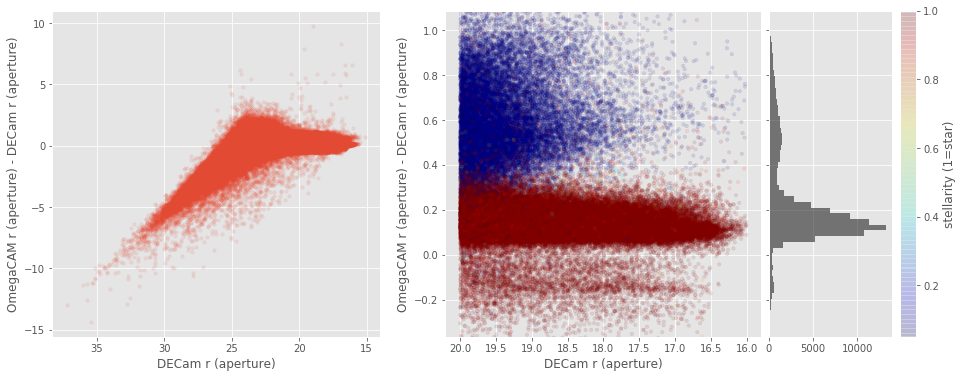

SUPRIME r (aperture) - DECam r (aperture):


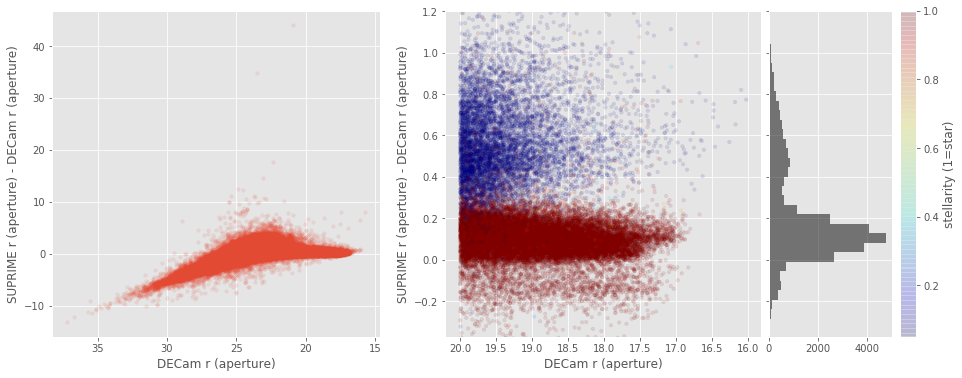

Megacam r (aperture) - GPC1 r (aperture):


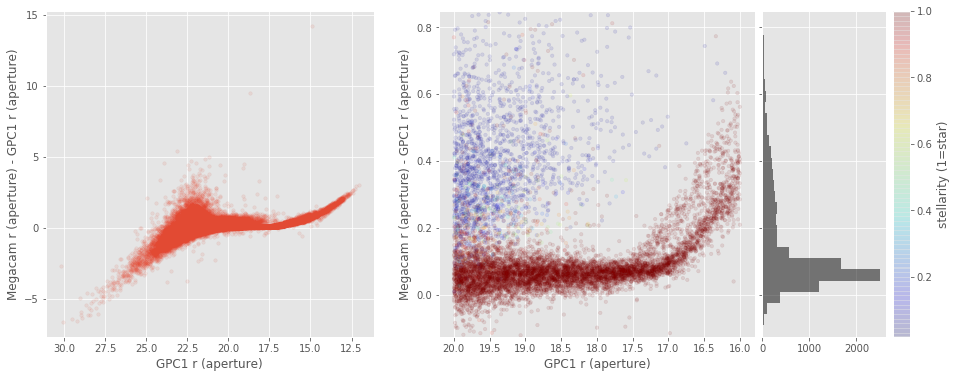

OmegaCAM r (aperture) - GPC1 r (aperture):


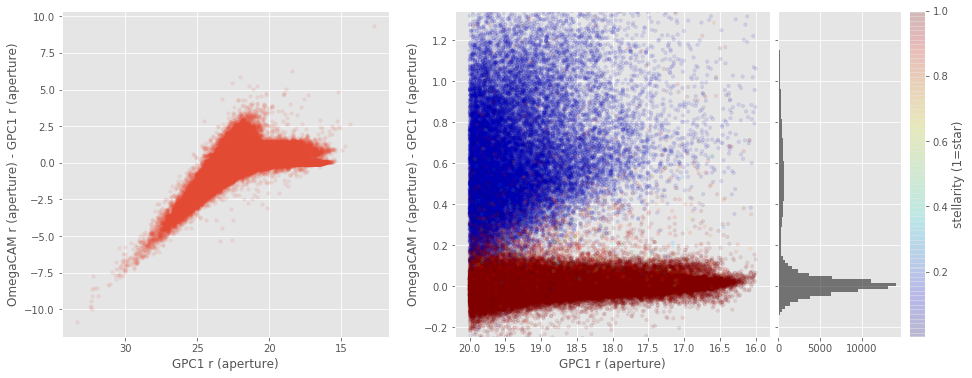

SUPRIME r (aperture) - GPC1 r (aperture):


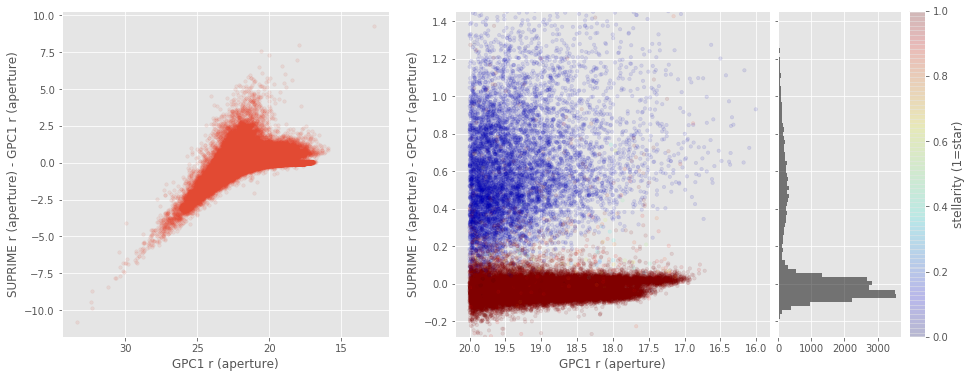

OmegaCAM r (aperture) - Megacam r (aperture):


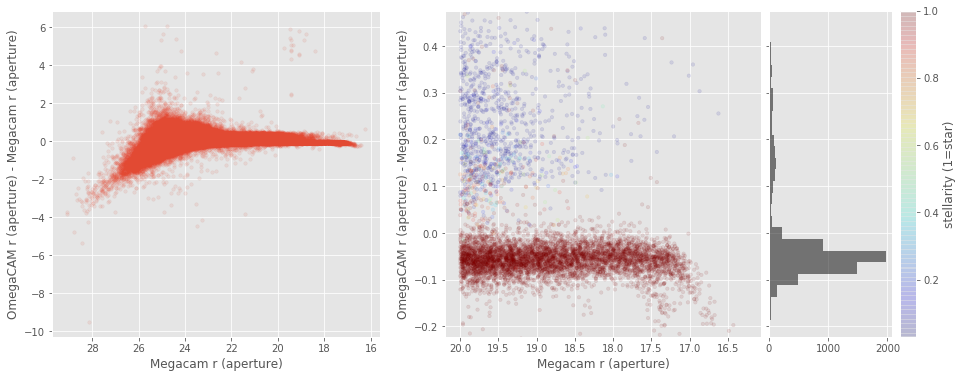

No sources have both Megacam r (aperture) and SUPRIME r (aperture) values.

SUPRIME r (aperture) - OmegaCAM r (aperture):


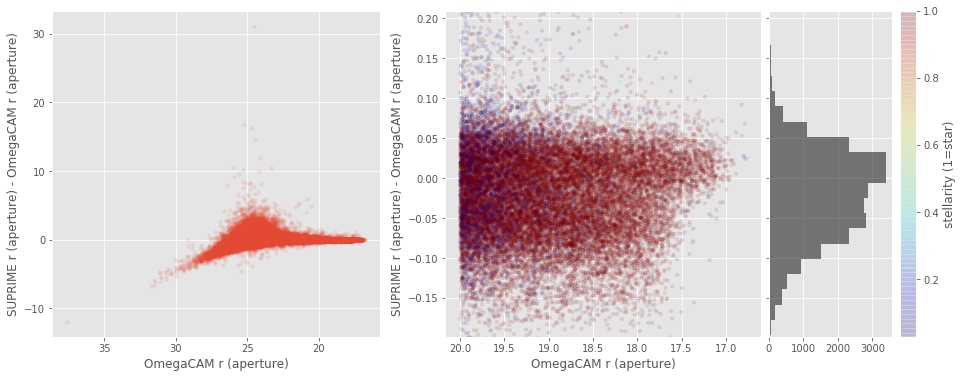

Megacam i (aperture) - GPC1 i (aperture):


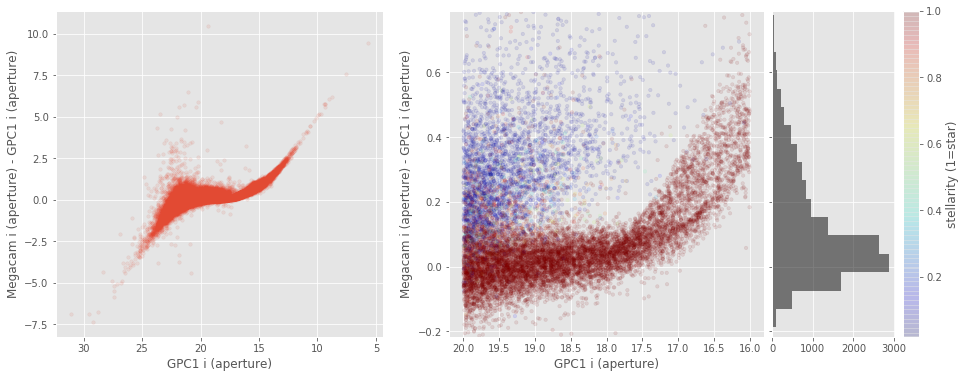

OmegaCAM i (aperture) - GPC1 i (aperture):


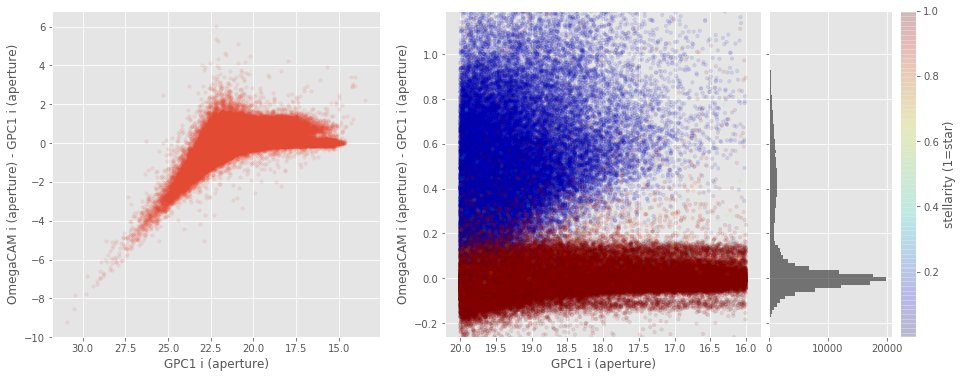

SUPRIME i (aperture) - GPC1 i (aperture):


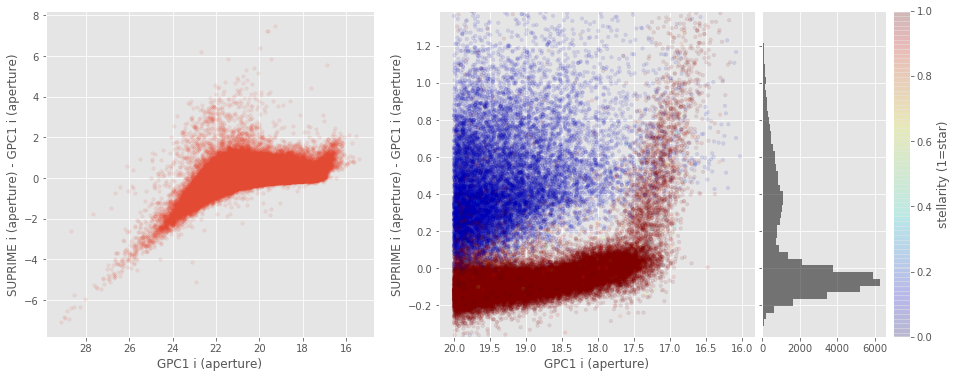

OmegaCAM i (aperture) - Megacam i (aperture):


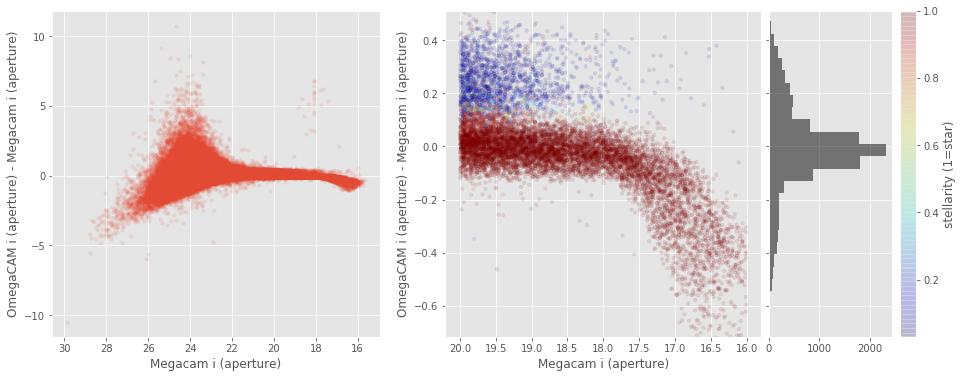

No sources have both Megacam i (aperture) and SUPRIME i (aperture) values.

SUPRIME i (aperture) - OmegaCAM i (aperture):


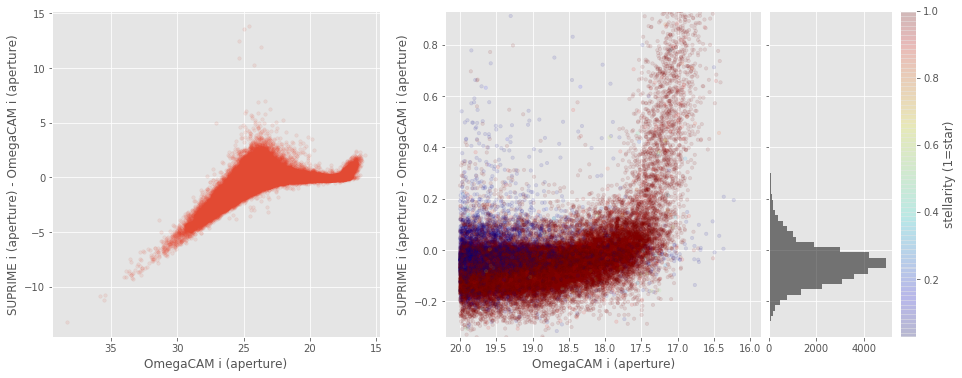

GPC1 z (aperture) - DECam z (aperture):


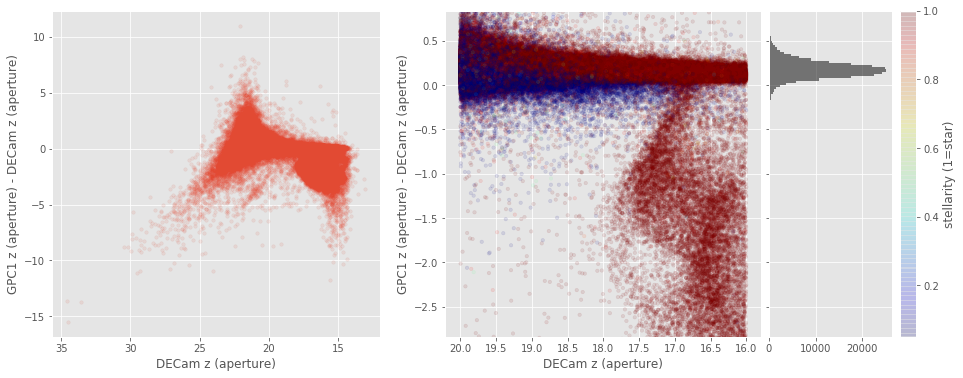

Megacam z (aperture) - DECam z (aperture):


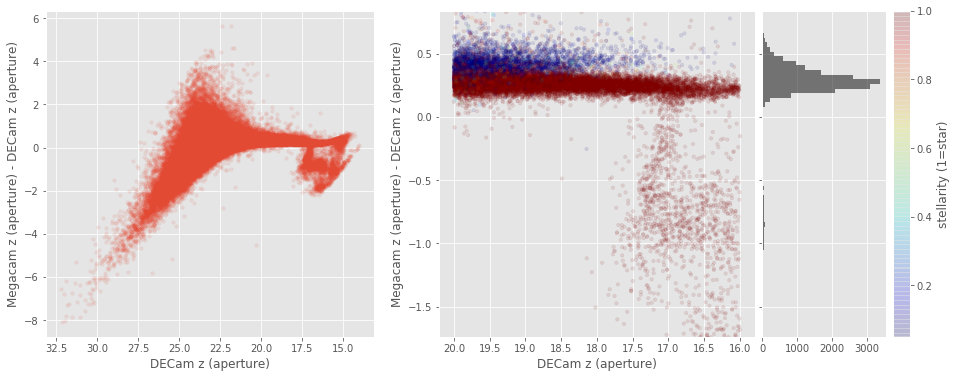

SUPRIME z (aperture) - DECam z (aperture):


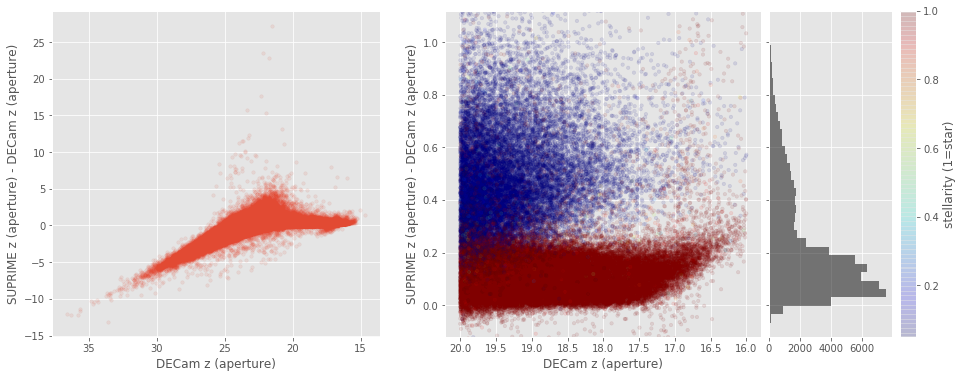

VISTA Z (aperture) - DECam z (aperture):


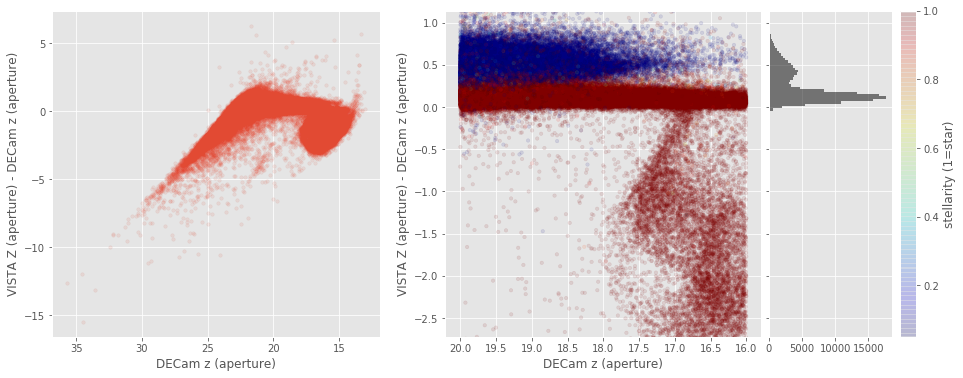

Megacam z (aperture) - GPC1 z (aperture):


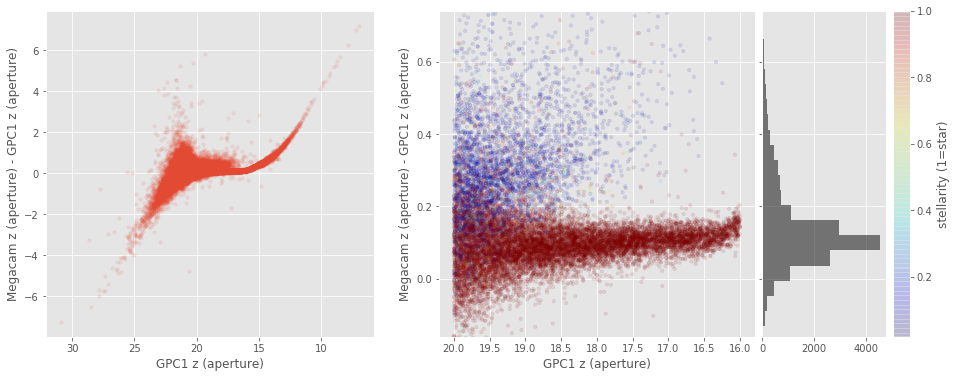

SUPRIME z (aperture) - GPC1 z (aperture):


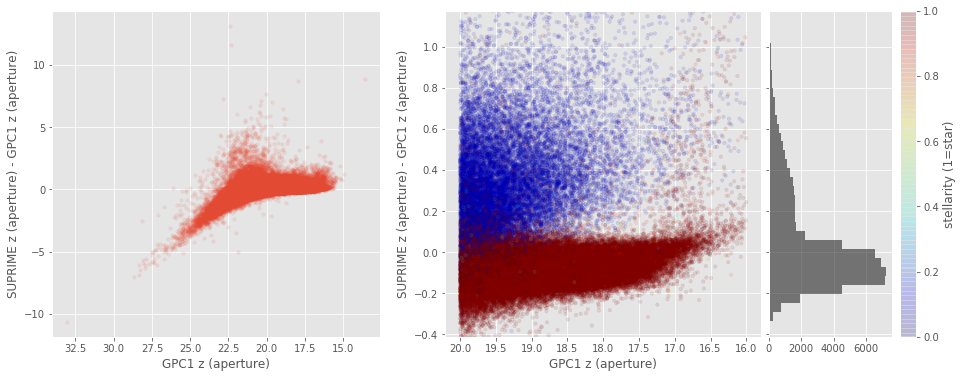

VISTA Z (aperture) - GPC1 z (aperture):


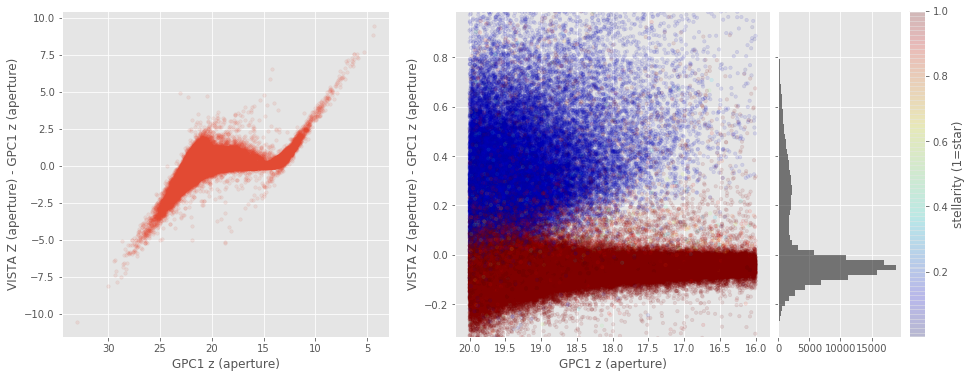

No sources have both Megacam z (aperture) and SUPRIME z (aperture) values.

VISTA Z (aperture) - Megacam z (aperture):


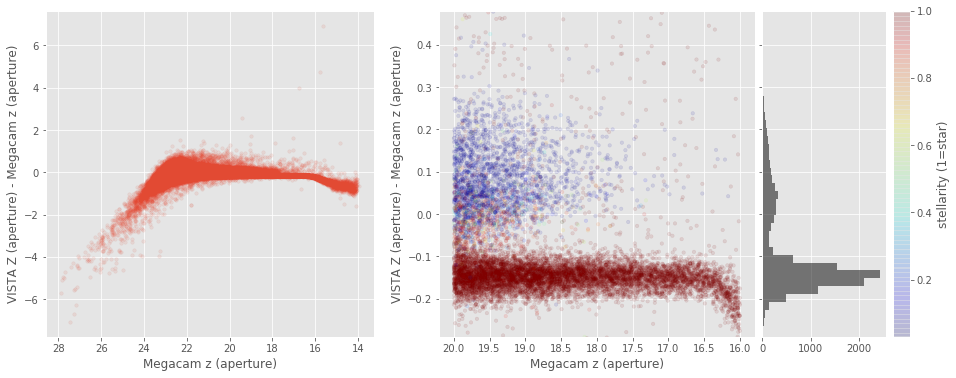

VISTA Z (aperture) - SUPRIME z (aperture):


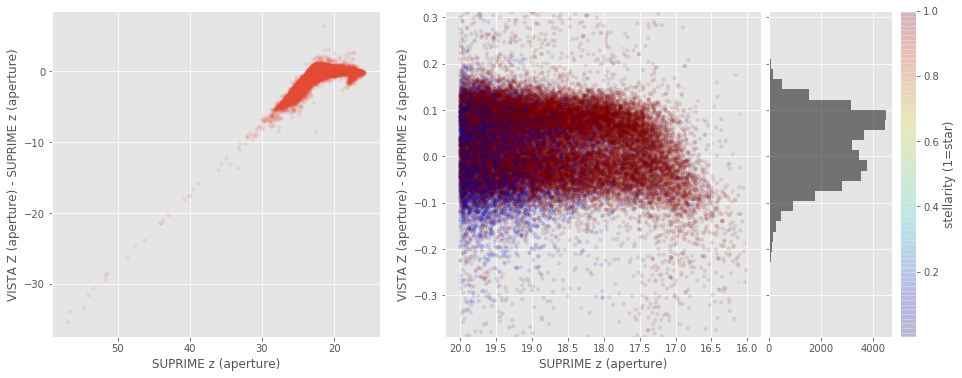

SUPRIME y (aperture) - GPC1 y (aperture):


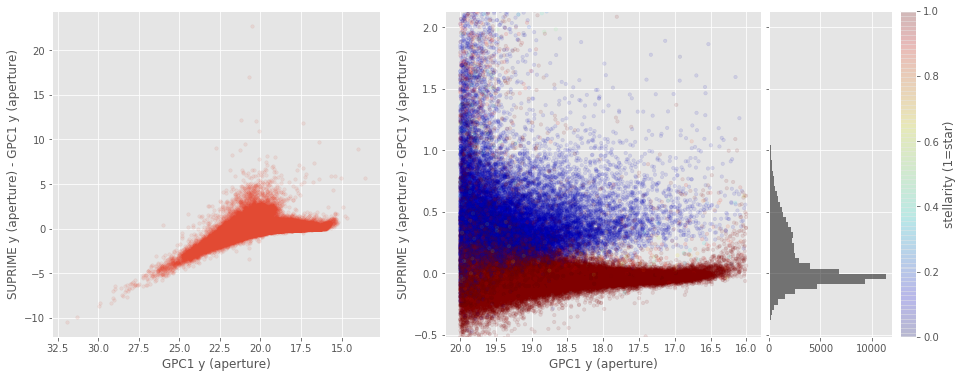

VISTA Y (aperture) - GPC1 y (aperture):


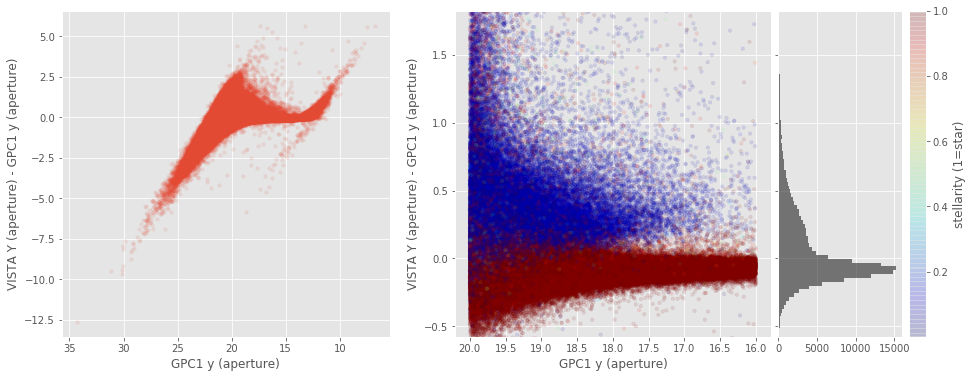

UKIDSS Y (aperture) - GPC1 y (aperture):


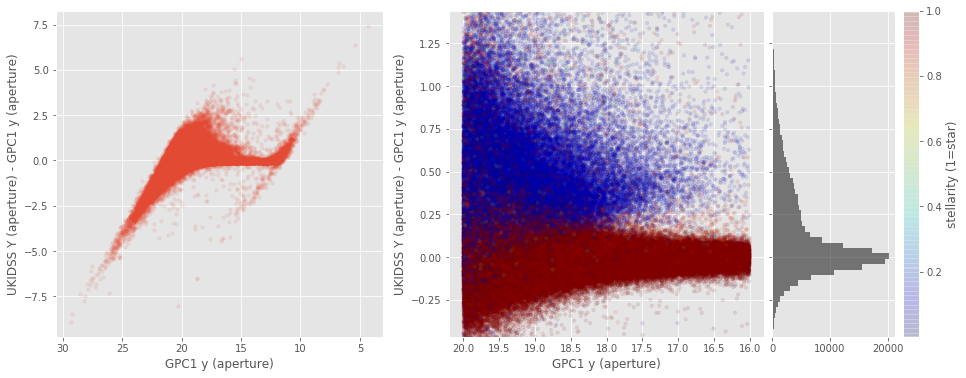

VISTA Y (aperture) - SUPRIME y (aperture):


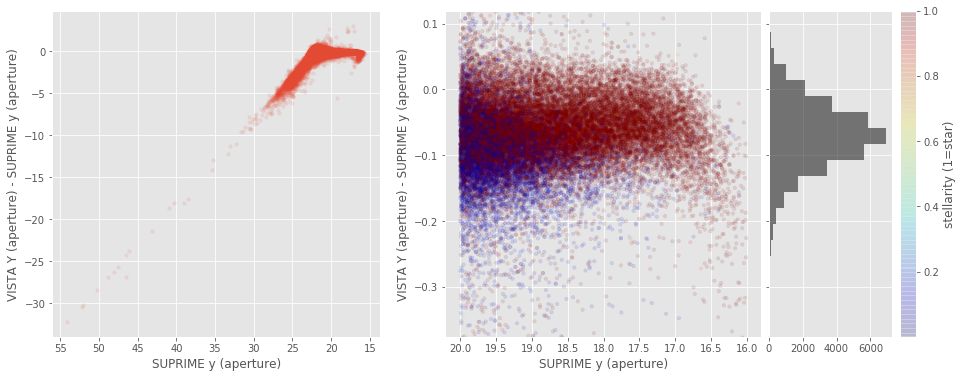

UKIDSS Y (aperture) - SUPRIME y (aperture):


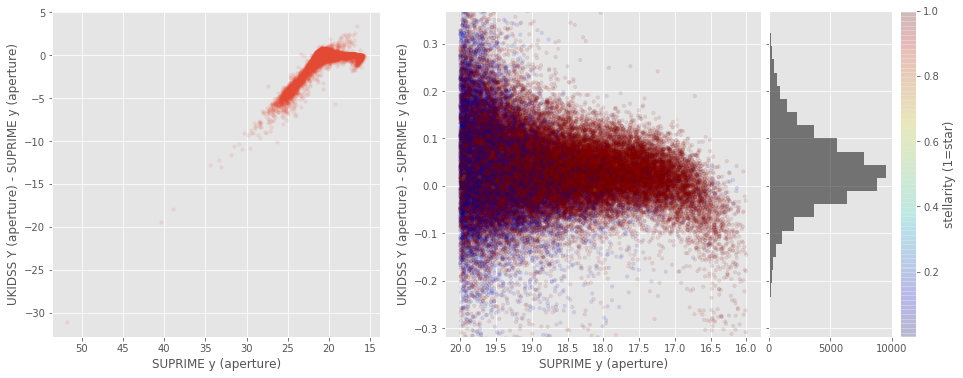

UKIDSS Y (aperture) - VISTA Y (aperture):


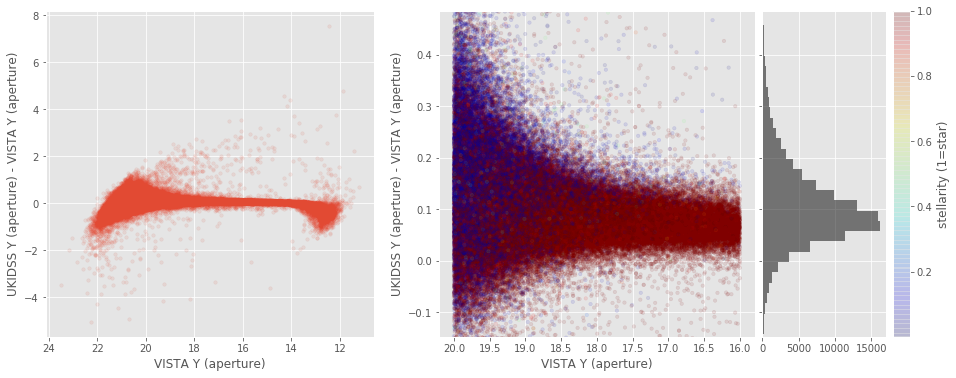

In [43]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if (basecol1 == "gpc1_i" and basecol2 == "omegacam_i"):
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)

plt.close()
plt.close()
plt.close()
plt.close()